In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm , skew
from scipy.special import boxcox
import os
from scipy import stats
import warnings  ### 煩 XD
warnings.filterwarnings("ignore")

# Data set

In [2]:
city_data_list_all = os.listdir('../DATAS/DATAS_Hsin/')
city_data_list_all

['HsinChuHouseDataBySASClearMRTLine',
 'KaoHsiungHouseDataBySASClearMRTLine',
 'NewTaipeiHouseDataBySASClearMRTLine',
 'TaiChungHouseDataBySASClearMRTLine',
 'TainanHouseDataBySASClearMRTLine',
 'TaipeiHouseDataBySASClearMRTLine',
 'TaoYuanHouseDataBySASClearMRTLine']

# Merge all city data 

In [3]:
data_all = pd.DataFrame()
for city in city_data_list_all :
    
    data = pd.read_csv('../DATAS/DATAS_Hsin/{}/{}.csv'.format(city,city))
    
    data_all = pd.concat([data_all,data],axis=0)

In [4]:
data_all = data_all.reset_index()

# EDA

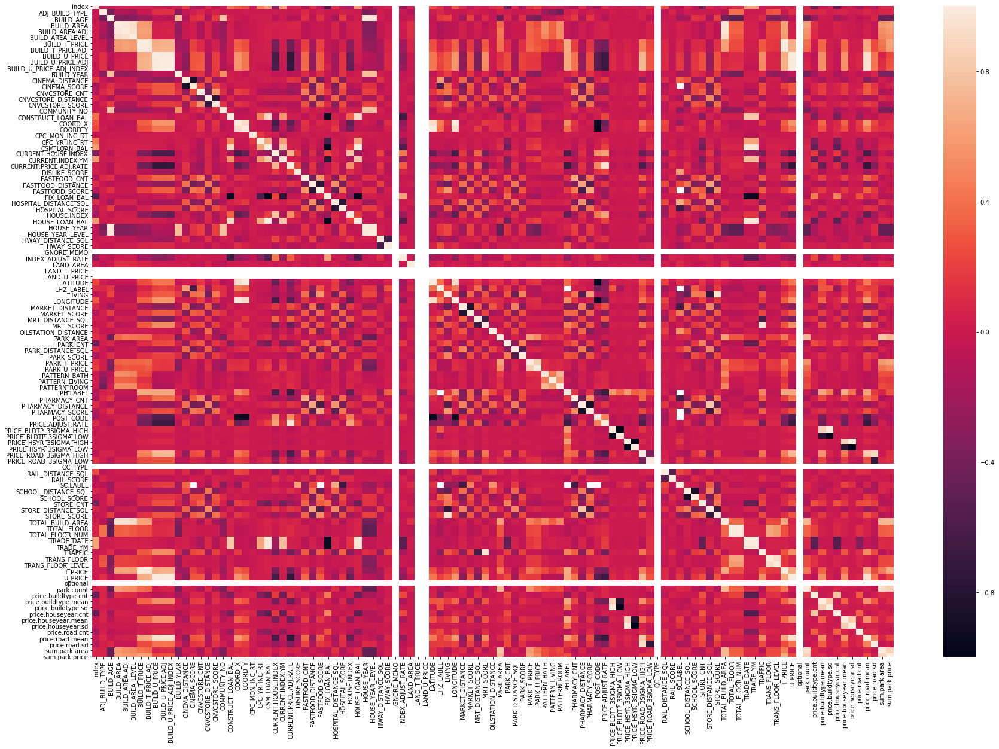

In [39]:
plt.figure(figsize=(30,20))
corr = data_all.corr()
sns.heatmap(corr)

# Find important col 皆為量化資料   先查看其分配是否接近常態

In [42]:
important_col_nona = data_all[important_col].dropna(axis=1).columns.tolist()

In [43]:
important_col

['BUILD_T_PRICE',
 'BUILD_T_PRICE.ADJ',
 'BUILD_U_PRICE',
 'BUILD_U_PRICE.ADJ',
 'BUILD_U_PRICE_ADJ_INDEX',
 'CNVCSTORE_CNT',
 'COORD_X',
 'COORD_Y',
 'CURRENT.HOUSE.INDEX',
 'CURRENT.PRICE.ADJ.RATE',
 'FASTFOOD_CNT',
 'FASTFOOD_SCORE',
 'HOUSE.INDEX',
 'INDEX_ADJUST_RATE',
 'LATITUDE',
 'LIVING',
 'LONGITUDE',
 'MARKET_SCORE',
 'MRT_DISTANCE_SQL',
 'MRT_SCORE',
 'PH.LABEL',
 'PHARMACY_CNT',
 'POST_CODE',
 'PRICE.ADJUST.RATE',
 'PRICE_ROAD_3SIGMA_HIGH',
 'TRAFFIC',
 'T_PRICE',
 'U_PRICE',
 'price.buildtype.mean',
 'price.houseyear.mean',
 'price.road.mean',
 'price.road.sd']

In [44]:
important_col_human=['CINEMA_DISTANCE',
 'COORD_X',
 'COORD_Y',
 'CURRENT.HOUSE.INDEX',
 'FASTFOOD_CNT',
 'HOUSE.INDEX',
 'LATITUDE',
 'LHZ_LABEL',
 'LONGITUDE',
 'MARKET_SCORE',
 'MRT_DISTANCE_SQL',
 'MRT_SCORE',
 'PH.LABEL',
 'PHARMACY_CNT',
 'POST_CODE',
 'TRAFFIC']

In [45]:
human1 = important_col_human[:8]
human2 = important_col_human[8:]

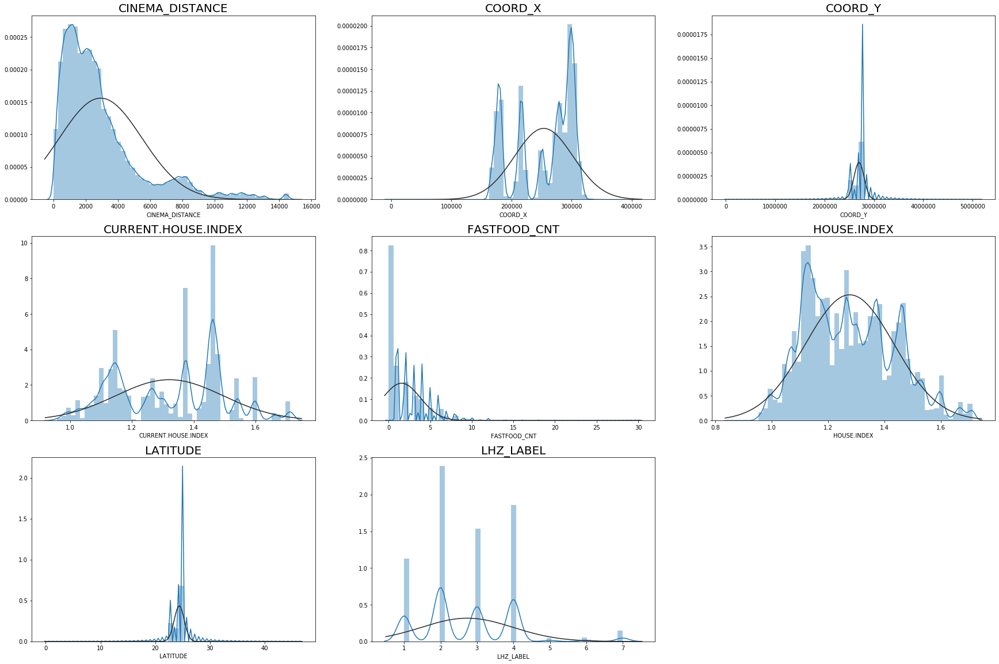

In [46]:
count = 1
plt.figure(figsize=(30,20))
for col in human1 :
    plt.subplot(3,3,count)
    sns.distplot(data_all[col].dropna(),fit= norm)
    plt.title(col,fontsize=20)
    
    
    count += 1
plt.show()

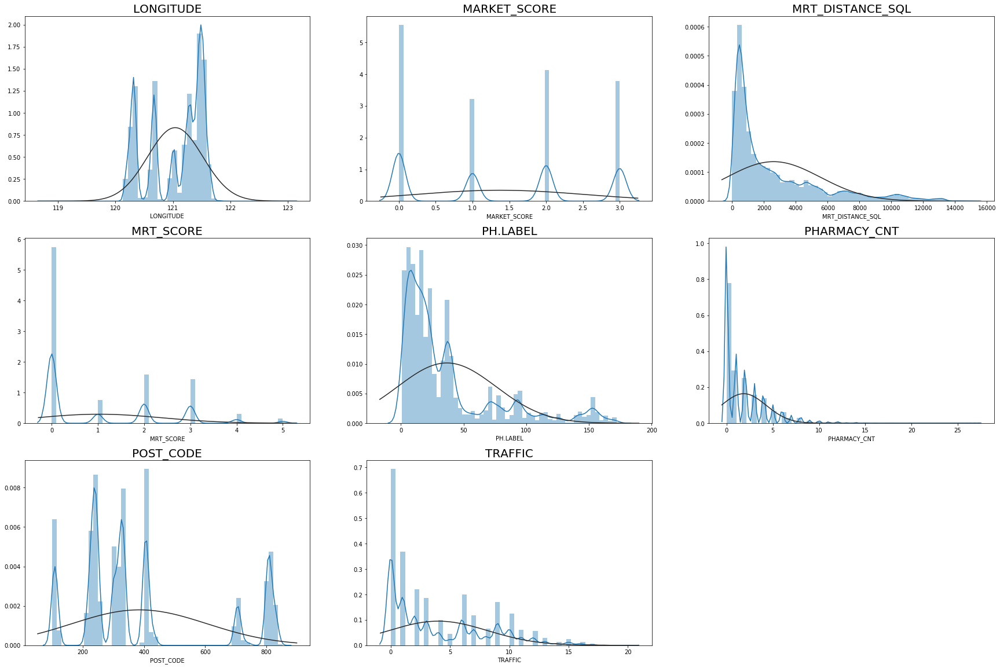

In [47]:
count = 1
plt.figure(figsize=(30,20))
for col in human2 :
    plt.subplot(3,3,count)
    sns.distplot(data_all[col].dropna(),fit= norm)
    plt.title(col,fontsize=20)
    
    
    count += 1
plt.show()

# 可轉換的目測為 'CINEMA_DISTANCE' ,'MRT_DISTANCE_SQL','PH.LABEL'
# INDEX類別用Try & error 嘗試

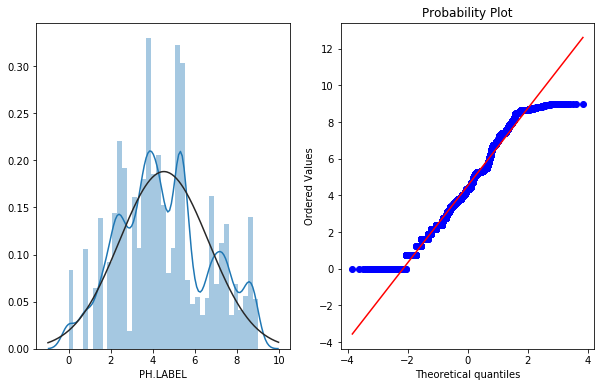

In [126]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
sns.distplot(boxcox(data_all['PH.LABEL'].dropna(),0.2),fit= norm)
plt.subplot(1,2,2)
stats.probplot(boxcox(data_all['PH.LABEL'].dropna(),0.2),plot=plt)
plt.show()

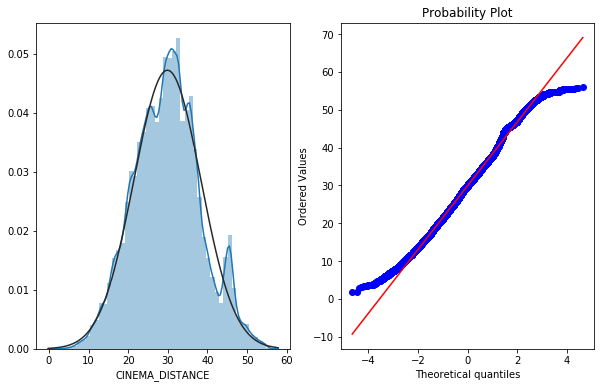

In [129]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
sns.distplot(boxcox(data_all['CINEMA_DISTANCE'].dropna(),0.3),fit= norm)
plt.subplot(1,2,2)
stats.probplot(boxcox(data_all['CINEMA_DISTANCE'].dropna(),0.3),plot=plt)
plt.show()

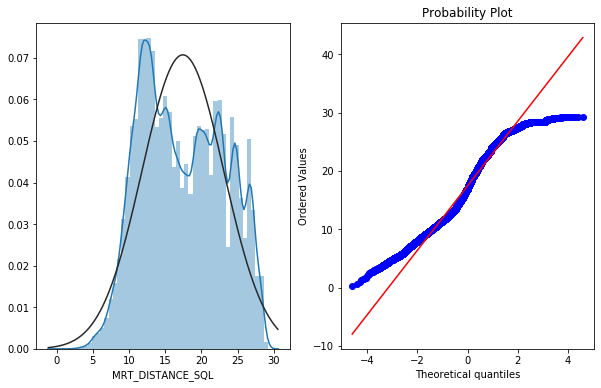

In [128]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
sns.distplot(boxcox(data_all['MRT_DISTANCE_SQL'].dropna(),0.2),fit= norm)
plt.subplot(1,2,2)
stats.probplot(boxcox(data_all['MRT_DISTANCE_SQL'].dropna(),0.2),plot=plt)
plt.show()

# 填補遺漏值 (太多則直接丟棄)

In [6]:
data_all_col = data_all.columns.tolist()

In [7]:
data_all_na_col = []
for col in data_all_col :
    if data_all[col].isna().sum() == 0 :
        pass
    else :
        data_all_na_col.append(col)
        print(col,'na_num =',data_all[col].isna().sum())

ADDR na_num = 138
BUILD_AGE na_num = 36334
BUILD_DATE na_num = 871
BUILD_MATER na_num = 17
BUILD_USAGE na_num = 13185
BUILD_YEAR na_num = 14187
CINEMA na_num = 8351
CINEMA_DISTANCE na_num = 8351
CNVCSTORE na_num = 18
CNVCSTORE_DISTANCE na_num = 18
COMMUNITY_NAME na_num = 218981
COMMUNITY_NO na_num = 218981
CONSTRUCT_LOAN_BAL na_num = 105673
CPC_MON_INC_RT na_num = 105673
CPC_YR_INC_RT na_num = 105673
CSM_LOAN_BAL na_num = 105673
FASTFOOD na_num = 99
FASTFOOD_DISTANCE na_num = 99
FIX_LOAN_BAL na_num = 105673
HOSPITAL_DISTANCE_SQL na_num = 92
HOSPITAL_SQL na_num = 92
HOUSE_LOAN_BAL na_num = 105673
HWAY_DISTANCE_SQL na_num = 12234
HWAY_SQL na_num = 12234
IGNORE_MEMO na_num = 573415
IS_SC_FLAG na_num = 511919
LAND_USAGE na_num = 20683
LHZ_LABEL na_num = 549967
LICENSE_TYPE na_num = 552620
MARKET na_num = 18
MARKET_DISTANCE na_num = 18
MRT_CROSS na_num = 233196
MRT_DISTANCE_SQL na_num = 116257
MRT_LINE na_num = 233196
MRT_LINE_CODE na_num = 233196
MRT_SQL na_num = 116257
OILSTATION na_num =

# 填補地址用經度緯度近似位置填補

In [8]:
def fill_address_na (df,target) :
    
    addr_na_index = df[df[target].isna() == True].index.tolist()
    addr_na_latlon = df[['LATITUDE','LONGITUDE']].filter(items=addr_na_index,axis=0)
    addr_na_latlon_index = addr_na_latlon.index.tolist()
    addr_data = df[['LATITUDE','LONGITUDE']].drop(index = addr_na_index)
    
    min_index_dis = {}

    for i in range(len(addr_na_latlon)):

        dis_list = []


        dis_list.append((addr_data.iloc[:,0] - addr_na_latlon.iloc[i,0])**2  +(addr_data.iloc[:,1] - addr_na_latlon.iloc[i,1])**2 )


        ### 轉成dataframe 方便找出index    
        dis_list = pd.DataFrame(dis_list[0])    

        min_index_dis[addr_na_latlon_index[i]] = dis_list[0].idxmin()
        #### dis_list[0] 0為col名稱
        
    for na , fill in zip (min_index_dis,min_index_dis.values()) :
        
        df[target][na] = df[target][fill]
        
    return df

In [9]:
def fill_dis_neg (df,target) :  ## 越遠越不好  corr < 0
    df[target] = df[target].fillna(df[target].max() +df[target].std())
    
    return df

def fill_dis_pos (df,target) : ## 越遠越好  corr > 0 
    
    df[target] = df[target].fillna(0)
    
    return df

In [10]:
def fill_all_disance(df,target,data_all_na_col) :
    
    for i in data_all_na_col :
        if 'DISTANCE' in i :
            if df[target].corr(df[i]) >= 0 :
                fill_dis_pos(df,i)
            else :
                fill_dis_neg(df,i)
                
    return df

In [11]:
def new_address (df,target,new_col) :  ###########################   可以用OTROAD 取代
    
    new_add = []
    numlist = ['0','1','2','3','4','5','6','7','8','9']
    
    for address_name in df[target] :
        list_count = 0   ### for find the list index
        
        for word in address_name :
            if word in numlist :
                new_add.append(address_name[:list_count])
                break
            else :
                pass
            
            list_count +=1
            
            if len(address_name) == list_count :
                new_add.append(address_name[:list_count])
    df[new_col] = new_add
    
    return df

In [12]:
def com_ornot(df,target,new_col) :
    com_ = []
    for com in df[target].isna() :
        
        
        if com  == True :
        
            com_.append(0)
        
        else :
            com_.append(1)
            
    df[new_col] = com_
    return df

In [13]:
def get_years_build (df,target,new_col): 
      
    years_list = []
    
    
    for years in df[target] :
        years = str(years)
        years_list.append(years[:-6])
        
    df[new_col] = years_list
    
    return df

def get_years_trad (df,target,new_col): 
      
    years_list = []
    
    
    for years in df[target] :
        years = str(years)
        years_list.append(years[:-4])
        
    df[new_col] = years_list
    
    return df

In [14]:
def get_month_build (df,target,new_col): 
      
    month_list = []
    
    
    for month in df[target] :
        month = str(month)
        month_list.append(month[-6:-4])
        
    df[new_col] = month_list
    
    return df


def get_month_trad (df,target,new_col): 
      
    month_list = []
    
    
    for month in df[target] :
        month = str(month)
        month_list.append(month[-2:])
        
    df[new_col] = month_list
    
    return df

In [15]:
def top_floor(df,floor,total_floor,new_col) :
    top = []
    for com in df[floor] == df[total_floor] :
        
        if com  == True :
        
            top.append(1)
        
        else :
            top.append(0)
            
    df[new_col] = top
    
    return df

In [16]:
def cov_all_distance_log1p (df,data_all_col) :
    
    for i in data_all_col :
        if 'DISTANCE' in i :
            df[i] = np.log1p(df[i])
        else :
            pass
    return df

In [17]:
def cut_distance_into_bins(df) :
    for i in data_all_col :
        if 'DISTANCE' in i :
            df[i+'_category'] = pd.cut((df[i]),[0,1000,100000]) ##### Can change 
        else :
            pass
    return df

In [18]:
def cut_lat (df,target,new_col) :
    df[new_col] = pd.cut(df[target],10).astype('str')
    
    return df
    
def cut_lon (df,target,new_col) :
    df[new_col] = pd.cut(df[target],5).astype('str')
    
    return df

In [19]:
def cross_col (df,target1,target2,new_col) :
    
    df[new_col] = df[target1].astype('str') + df[target2].astype('str')
    
    return df

In [20]:
data_all = fill_address_na(data_all,'ADDR')
data_all = fill_address_na(data_all,'VILLAGE')
data_all = fill_address_na(data_all,'OTROAD')

In [21]:
data_all = fill_all_disance(data_all,'BUILD_U_PRICE.ADJ',data_all_na_col)

In [22]:
data_all = new_address(data_all,'ADDR','ROAD')

In [23]:
data_all = com_ornot(data_all,'COMMUNITY_NAME','IS_COMMUNITY')

In [24]:
data_all = top_floor(data_all,'TRANS_FLOOR','TOTAL_FLOOR_NUM','TOP_FLOOR')

In [25]:
data_all = get_month_build(data_all,'BUILD_DATE','BUILD_MONTH')
data_all = get_month_trad(data_all,'TRADE_YM','TRAD_MONTH')
data_all = get_years_build(data_all,'BUILD_DATE','BUILD_YEARS')
data_all = get_years_trad(data_all,'TRADE_YM','TRAD_YEARS')

In [26]:
data_all = cov_all_distance_log1p(data_all,data_all_col)

In [27]:
data_all = cut_lat(data_all,'LATITUDE','lat_cut')
data_all = cut_lat(data_all,'LONGITUDE','lon_cut')

In [28]:
data_all = cross_col(data_all,'LATITUDE','LONGITUDE','cross_latlon')

In [29]:
data_all['LATITUDE.sqr'] = data_all['LATITUDE']**2
data_all['LONGITUDE.sqr'] = data_all['LONGITUDE']**2
data_all['HOUSE_YEAR.sqr'] = data_all['HOUSE_YEAR'] **2
data_all['BUILD_AREA.sqr'] = data_all['BUILD_AREA'] **2
data_all['TOTAL_FLOOR.sqr'] = data_all['TOTAL_FLOOR'] **2

In [30]:
data_all['area_ratio'] = data_all['LAND_AREA']  / data_all['BUILD_AREA.ADJ']
data_all['floor_ratio'] = data_all['TRANS_FLOOR']  / data_all['TOTAL_FLOOR_NUM']

In [31]:
data_all['ave_tra_dis'] = (data_all['MRT_DISTANCE_SQL'] + data_all['HWAY_DISTANCE_SQL'] + data_all['RAIL_DISTANCE_SQL']) /3
data_all['ave_ent_dis'] = (data_all['PARK_DISTANCE_SQL'] + data_all['CINEMA_DISTANCE']) /2
data_all['ave_lif_dis'] = (data_all['MARKET_DISTANCE'] + data_all['STORE_DISTANCE_SQL'] + data_all['OILSTATION_DISTANCE']
                            + data_all['FASTFOOD_DISTANCE'] +data_all['CNVCSTORE_DISTANCE'] )/5 
data_all['ave_health_dis'] = (data_all['HOSPITAL_DISTANCE_SQL'] + data_all['PHARMACY_DISTANCE']) /2

In [32]:
data_all['ave_lif_tra_dis'] = (data_all['ave_lif_dis'] + data_all['ave_tra_dis'] ) /2
data_all['ave_ent_tra_dis'] = (data_all['ave_ent_dis'] + data_all['ave_tra_dis'] ) / 2
data_all['ave_lif_ent_dis']= (data_all['ave_lif_dis'] + data_all['ave_ent_dis'] ) /2

In [33]:
data_all['ave_tra_sc'] = (data_all['MRT_SCORE'] + data_all['HWAY_SCORE'] + data_all['RAIL_SCORE']) /3
data_all['ave_ent_sc'] = (data_all['PARK_SCORE'] + data_all['CINEMA_SCORE']) /2
data_all['ave_lif_sc'] = (data_all['MARKET_SCORE'] + data_all['STORE_SCORE'] + data_all['FASTFOOD_SCORE'] + data_all['CNVCSTORE_SCORE']) /4 
data_all['ave_health_sc'] = (data_all['HOSPITAL_SCORE'] + data_all['PHARMACY_SCORE']) /2

In [34]:
data_all['ave_lif_tra_sc'] = (data_all['ave_lif_sc'] + data_all['ave_tra_sc'] ) /2
data_all['ave_ent_tra_sc'] = (data_all['ave_ent_sc'] + data_all['ave_tra_sc'] ) /2
data_all['ave_lif_ent_sc']= (data_all['ave_lif_sc'] + data_all['ave_ent_sc'] ) /2

In [35]:
def prosperity (df,target) :
    try :
        df[target+'_pros'] = (df[target+'_CNT'] / df[target+'_DISTANCE'])
    except :
        df[target+'_pros'] = (df[target+'_CNT'] / df[target+'_DISTANCE_SQL'])
    return df

In [36]:
#### CNT 只有下列五個設施有統計
data_all = prosperity(data_all,'PARK')
data_all = prosperity(data_all,'STORE')
data_all = prosperity(data_all,'CNVCSTORE')
data_all = prosperity(data_all,'FASTFOOD')
data_all = prosperity(data_all,'PHARMACY')

In [37]:
data_all['ave_cnt'] = (data_all['PARK_CNT'] + data_all['STORE_CNT'] +data_all['CNVCSTORE_CNT']+data_all['FASTFOOD_CNT']+
                        data_all['PHARMACY_CNT']) / 5

In [38]:
data_all['ROAD_YEARS'] = data_all['ROAD'].astype('str') + data_all['BUILD_YEARS'].astype('str')

# 類別資料Na 填補 (人工篩選)

In [39]:
data_all['BUILD_USAGE'].replace(['住工用','停車空間','工商用','市場攤位'],'其他',inplace=True)
data_all['BUILD_USAGE'].replace([np.nan],'未知用途',inplace=True)

In [40]:
data_all['PARK_TYPE'].replace(np.nan,'無停車位',inplace=True)

In [41]:
data_all['MRT_CROSS'].replace(np.nan,'無捷運',inplace=True)
data_all['MRT_LINE'].replace(np.nan,'無捷運線',inplace=True)
data_all['MRT_SQL'].replace(np.nan,'無捷運出口',inplace=True)

In [42]:
data_all['HWAY_SQL'].replace(np.nan,'無交流道',inplace=True)

In [43]:
data_all['CINEMA'].replace(np.nan,'無電影院',inplace=True)

In [44]:
data_all['COMMUNITY_NAME'].replace(np.nan,'無社區',inplace=True)

In [45]:
data_all['RAIL_SQL'].replace(np.nan,'無台鐵站',inplace=True)

In [46]:
data_all['BUILD_MATER'].replace(np.nan,'未知建材',inplace=True)

In [47]:
data_all['LAND_USAGE'].replace(np.nan,'未知用',inplace=True)

In [50]:
data_all_na_col = []
for col in data_all_col :
    if data_all[col].isna().sum() == 0 :
        pass
    else :
        data_all_na_col.append(col)
        print(col,'na_num =',data_all[col].isna().sum())

BUILD_AGE na_num = 36334
BUILD_DATE na_num = 871
BUILD_YEAR na_num = 14187
CNVCSTORE na_num = 18
COMMUNITY_NO na_num = 218981
CONSTRUCT_LOAN_BAL na_num = 105673
CPC_MON_INC_RT na_num = 105673
CPC_YR_INC_RT na_num = 105673
CSM_LOAN_BAL na_num = 105673
FASTFOOD na_num = 99
FIX_LOAN_BAL na_num = 105673
HOSPITAL_SQL na_num = 92
HOUSE_LOAN_BAL na_num = 105673
IGNORE_MEMO na_num = 573415
IS_SC_FLAG na_num = 511919
LHZ_LABEL na_num = 549967
LICENSE_TYPE na_num = 552620
MARKET na_num = 18
MRT_LINE_CODE na_num = 233196
OILSTATION na_num = 18
PARK_SQL na_num = 39
PH.LABEL na_num = 560866
PHARMACY na_num = 92
PRICE_BLDTP_3SIGMA_HIGH na_num = 4211
PRICE_BLDTP_3SIGMA_LOW na_num = 4211
PRICE_BLDTP_OUTLINER na_num = 4211
PRICE_HSYR_3SIGMA_HIGH na_num = 6238
PRICE_HSYR_3SIGMA_LOW na_num = 6238
PRICE_HSYR_OUTLINER na_num = 6238
PRICE_ROAD_3SIGMA_HIGH na_num = 75605
PRICE_ROAD_3SIGMA_LOW na_num = 75605
PRICE_ROAD_OUTLINER na_num = 75605
REGION_TYPE na_num = 552559
REMARK na_num = 502730
SC.LABEL na_num 

# 丟棄na過多的feature

In [51]:
data_all.drop(['BUILD_AGE','BUILD_DATE','BUILD_YEAR','CONSTRUCT_LOAN_BAL','CPC_MON_INC_RT','CPC_YR_INC_RT',
                          'CSM_LOAN_BAL','FIX_LOAN_BAL','HOUSE_LOAN_BAL','IGNORE_MEMO','IS_SC_FLAG','LHZ_LABEL',
                          'LICENSE_TYPE','PH.LABEL'],axis=1 , inplace = True)

# 丟棄類別過多之無用資料

In [52]:
for i in data_all.columns.tolist() :
    if data_all[i].dtype == 'object' :
        print(i)

ADDR
BUILD_AREA_RANGE
BUILD_MATER
BUILD_TYPE
BUILD_TYPE_TRANS
BUILD_USAGE
CINEMA
CITY
CNVCSTORE
COMMUNITY_NAME
DISLIKE_SCORE_RANGE
FASTFOOD
FULL_VILLAGE
HAS_DISLIKE
HOSPITAL_SQL
HOUSE_YEAR_RANGE
HWAY_SQL
INPUT_DATE
IS_PH_FLAG
IS_REMARK
LAND_USAGE
LIVING_RANGE
MANAGE
MARKET
MRT_CROSS
MRT_LINE
MRT_LINE_CODE
MRT_SQL
NEAR_ROAD
NEAR_ROAD_TRANS
OILSTATION
OTROAD
PARK_CNT_RANGE
PARK_SQL
PARK_TYPE
PATTERN_PART
PHARMACY
PRESOLD
PRICE_BLDTP_OUTLINER
PRICE_HSYR_OUTLINER
PRICE_OUTLINER
PRICE_ROAD_OUTLINER
RAIL_SQL
REGION_TYPE
REMARK
SCHOOL_SQL
SEQ_NO
SPECIAL_FLAG
STORE_CNT_RANGE
STORE_SQL
TARGET_FLOOR
TARGET_FLOOR_NUM
TARGET_TYPE
TOTAL_FLOOR_RANGE
TOWN
TOWN_TEMP
TRADE_VOL
TRAFFIC_RANGE
TRANS_FLOOR_RANGE
VILLAGE
VILLAGE_ID
ROAD
BUILD_MONTH
TRAD_MONTH
BUILD_YEARS
TRAD_YEARS
lat_cut
lon_cut
cross_latlon
ROAD_YEARS


In [53]:
data_all.drop(['COMMUNITY_NO','VILLAGE_ID','SC.LABEL','REMARK','REGION_TYPE','ADDR',
                          ####  可用可不用  用的話要轉類別變數處裡
                          
                          ####  price 類的先全丟棄
                           'PRICE_ROAD_OUTLINER','PRICE_ROAD_3SIGMA_LOW','PRICE_ROAD_3SIGMA_HIGH','PRICE_HSYR_OUTLINER',
                          'PRICE_HSYR_3SIGMA_LOW','PRICE_HSYR_3SIGMA_HIGH','PRICE_BLDTP_OUTLINER','PRICE_BLDTP_3SIGMA_LOW',
                          'PRICE_BLDTP_3SIGMA_HIGH','MRT_LINE_CODE','price.road.sd','price.houseyear.sd','price.buildtype.sd',
                         'PRICE_OUTLINER','TRAD_YEARS',
                         ####  名稱變數選擇丟棄 ， 數量太多直接丟去 例如 : 便利商店名稱太雜亂 無用處
                         
                         'CNVCSTORE','VILLAGE_ID','FULL_VILLAGE'],axis=1,inplace=True)

In [54]:
for col in data_all.columns.tolist() :
    if data_all[col].isna().sum() == 0 :
        pass
    else :
        data_all_na_col.append(col)
        print(col,'na_num =',data_all[col].isna().sum())

FASTFOOD na_num = 99
HOSPITAL_SQL na_num = 92
MARKET na_num = 18
OILSTATION na_num = 18
PARK_SQL na_num = 39
PHARMACY na_num = 92
SCHOOL_SQL na_num = 18
STORE_SQL na_num = 44


# 這些類別變數要用target encoding 處裡   

# 類別數量大於5

In [55]:
nd_target_list_cate = []
nd_onehot_list_cate = []
for i in data_all.columns.tolist() :
    if data_all[i].dtype == 'object' :
        if len(data_all[i].unique()) >= 5 :
            nd_target_list_cate.append(i)
            print(i)
        else :
            nd_onehot_list_cate.append(i)

BUILD_AREA_RANGE
BUILD_MATER
BUILD_USAGE
CINEMA
CITY
COMMUNITY_NAME
FASTFOOD
HOSPITAL_SQL
HOUSE_YEAR_RANGE
HWAY_SQL
INPUT_DATE
LAND_USAGE
MARKET
MRT_LINE
MRT_SQL
OILSTATION
OTROAD
PARK_CNT_RANGE
PARK_SQL
PARK_TYPE
PHARMACY
RAIL_SQL
SCHOOL_SQL
SEQ_NO
STORE_CNT_RANGE
STORE_SQL
TARGET_FLOOR
TARGET_FLOOR_NUM
TOWN
TOWN_TEMP
TRADE_VOL
VILLAGE
ROAD
BUILD_MONTH
TRAD_MONTH
BUILD_YEARS
lon_cut
cross_latlon
ROAD_YEARS


In [53]:
data_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573415 entries, 0 to 573414
Columns: 172 entries, index to ROAD_YEARS
dtypes: bool(1), float64(62), int64(51), object(58)
memory usage: 748.6+ MB


# 處裡int64 類型資料 

In [56]:
for i in data_all.columns.tolist() :
    if data_all[i].dtype == 'int64' :
        print(i)
        if (data_all[i].isna().sum()) > 0 :
            print('-------------------------------------_nan-----------------------------------------')

index
ADJ_BUILD_TYPE
BUILD_AREA_LEVEL
BUILD_T_PRICE
CINEMA_SCORE
CNVCSTORE_CNT
CNVCSTORE_SCORE
COORD_Y
CURRENT.INDEX.YM
DISLIKE_SCORE
FASTFOOD_CNT
FASTFOOD_SCORE
HOSPITAL_SCORE
HOUSE_YEAR
HOUSE_YEAR_LEVEL
HWAY_SCORE
LAND_T_PRICE
LAND_U_PRICE
LIVING
MARKET_SCORE
MRT_SCORE
PARK_CNT
PARK_SCORE
PARK_T_PRICE
PATTERN_BATH
PATTERN_LIVING
PATTERN_ROOM
PHARMACY_CNT
PHARMACY_SCORE
POST_CODE
QC_TYPE
RAIL_SCORE
SCHOOL_SCORE
STORE_CNT
STORE_SCORE
TOTAL_FLOOR
TOTAL_FLOOR_NUM
TRADE_DATE
TRADE_YM
TRAFFIC
TRANS_FLOOR
TRANS_FLOOR_LEVEL
T_PRICE
park.count
price.buildtype.cnt
price.houseyear.cnt
price.road.cnt
IS_COMMUNITY
TOP_FLOOR
HOUSE_YEAR.sqr
TOTAL_FLOOR.sqr


# 丟棄 和price有關的所有資料   # 以檢查int64無na資料

In [57]:
data_all.drop(['index','BUILD_T_PRICE','LAND_T_PRICE','LAND_U_PRICE','PARK_T_PRICE','T_PRICE','price.buildtype.cnt',
               'price.houseyear.cnt','price.road.cnt'],axis=1,inplace= True)

# 找出需要target encoding 之feature

# 有次序性不需要 (LIKE:  SCORE , CNT)

In [58]:
nd_target_list_int = []
nd_onehot_list_int = []
for i in data_all.columns.tolist() :
    if data_all[i].dtype == 'int64' :
        if 'SCORE' in i :
            pass
        elif 'CNT' in i :
            pass
        else :
            if len(data_all[i].unique()) > 5 :
                nd_target_list_int.append(i)
                print(i)
            else: 
                nd_onehot_list_int.append(i)

BUILD_AREA_LEVEL
COORD_Y
HOUSE_YEAR
HOUSE_YEAR_LEVEL
LIVING
PATTERN_BATH
PATTERN_LIVING
PATTERN_ROOM
POST_CODE
TOTAL_FLOOR
TOTAL_FLOOR_NUM
TRADE_DATE
TRADE_YM
TRAFFIC
TRANS_FLOOR
park.count
HOUSE_YEAR.sqr
TOTAL_FLOOR.sqr


# 處裡float64 資料

In [59]:
for i in data_all.columns.tolist() :
    if data_all[i].dtype == 'float64' :
        print(i)
        if (data_all[i].isna().sum()) > 0 :
            print('-------------------------------------_nan-----------------------------------------')

BUILD_AREA
BUILD_AREA.ADJ
BUILD_T_PRICE.ADJ
BUILD_U_PRICE
BUILD_U_PRICE.ADJ
BUILD_U_PRICE_ADJ_INDEX
CINEMA_DISTANCE
CNVCSTORE_DISTANCE
COORD_X
CURRENT.HOUSE.INDEX
CURRENT.PRICE.ADJ.RATE
FASTFOOD_DISTANCE
HOSPITAL_DISTANCE_SQL
HOUSE.INDEX
HWAY_DISTANCE_SQL
INDEX_ADJUST_RATE
LAND_AREA
LATITUDE
LONGITUDE
MARKET_DISTANCE
MRT_DISTANCE_SQL
OILSTATION_DISTANCE
PARK_AREA
PARK_DISTANCE_SQL
PARK_U_PRICE
PHARMACY_DISTANCE
PRICE.ADJUST.RATE
RAIL_DISTANCE_SQL
SCHOOL_DISTANCE_SQL
STORE_DISTANCE_SQL
TOTAL_BUILD_AREA
U_PRICE
price.buildtype.mean
price.houseyear.mean
price.road.mean
sum.park.area
sum.park.price
LATITUDE.sqr
LONGITUDE.sqr
BUILD_AREA.sqr
area_ratio
floor_ratio
ave_tra_dis
ave_ent_dis
ave_lif_dis
ave_health_dis
ave_lif_tra_dis
ave_ent_tra_dis
ave_lif_ent_dis
ave_tra_sc
ave_ent_sc
ave_lif_sc
ave_health_sc
ave_lif_tra_sc
ave_ent_tra_sc
ave_lif_ent_sc
PARK_pros
STORE_pros
CNVCSTORE_pros
FASTFOOD_pros
PHARMACY_pros
ave_cnt


# 將含 price feature 丟棄

In [60]:
data_all.drop(['BUILD_T_PRICE.ADJ','BUILD_U_PRICE_ADJ_INDEX','CURRENT.PRICE.ADJ.RATE','PRICE.ADJUST.RATE',
              'U_PRICE','price.buildtype.mean','price.houseyear.mean','price.road.mean','sum.park.price'],axis=1,inplace=True)

# 清除所有na data (水平丟)

In [61]:
data_all.shape

(573415, 154)

In [62]:
data_all.dropna(inplace = True)
data_all.shape

(573301, 154)

In [61]:
data_all[data_all.isna() == True].dropna()

,ADJ_BUILD_TYPE,BUILD_AREA,BUILD_AREA.ADJ,BUILD_AREA_LEVEL,BUILD_AREA_RANGE,BUILD_MATER,BUILD_TYPE,BUILD_TYPE_TRANS,BUILD_USAGE,BUILD_U_PRICE,...,ave_lif_tra_sc,ave_ent_tra_sc,ave_lif_ent_sc,PARK_pros,STORE_pros,CNVCSTORE_pros,FASTFOOD_pros,PHARMACY_pros,ave_cnt,ROAD_YEARS


# 資料清理乾淨

# 開始處裡類別資料


In [62]:
def get_one_hot(df,nd_onehot_list) :
    df = pd.concat([df] + [pd.get_dummies(df[col], prefix=col) for col in nd_onehot_list], axis=1)
    df = df.drop(nd_onehot_list,axis=1)
    return df

In [63]:
data_all = get_one_hot(data_all,nd_onehot_list_cate)
data_all = get_one_hot(data_all,nd_onehot_list_int)

In [67]:
data_all.shape

(573301, 154)

In [68]:
#data_all.to_csv('only_one_hot.csv')

In [69]:
data_all_drop = data_all.drop(nd_target_list_cate,axis=1)
data_all_drop = data_all_drop.drop(nd_target_list_int,axis=1)

# Target encoding    要先切開訓練和測試

In [70]:
from category_encoders.target_encoder import TargetEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder

In [71]:
###### 0.75 

pos = int(len(data_all)*0.75)

In [72]:
data_all['index'] = data_all.index

In [73]:
train = data_all.sample(frac = 1,random_state=1106).iloc[:pos,:]
test = data_all.sample(frac = 1,random_state=1106).iloc[pos:,:]

In [59]:
for idx in train['index'] :
    if idx in test['index'] :
        print('error')
    else :
        print(idx,'check')

492220 check
489008 check
569819 check
553438 check
288247 check
482219 check
340683 check
192884 check
41697 check
329779 check
52899 check
58897 check
457128 check
242216 check
432240 check
389495 check
539289 check
9402 check
242727 check
436120 check
393264 check
112365 check
333343 check
297618 check
554937 check
376838 check
518992 check
431821 check
178576 check
53082 check
540671 check
199129 check
45509 check
475801 check
449867 check
142808 check
413103 check
163462 check
327733 check
564653 check
44480 check
277739 check
11849 check
261278 check
24905 check
60921 check
144987 check
432506 check
446250 check
530414 check
405395 check
229715 check
285183 check
53263 check
253998 check
115037 check
196294 check
38897 check
19413 check
572335 check
336146 check
387043 check
160948 check
45176 check
396978 check
406749 check
495259 check
156325 check
430200 check
296749 check
180980 check
280294 check
476264 check
389213 check
401631 check
288263 check
427475 check
213966 check
1

77578 check
102474 check
250205 check
145619 check
312897 check
165603 check
446361 check
505811 check
210183 check
486577 check
249898 check
55899 check
191570 check
371815 check
522587 check
330619 check
153083 check
443968 check
362208 check
155632 check
486793 check
102869 check
24496 check
22863 check
121601 check
44490 check
99943 check
291361 check
454393 check
507739 check
299344 check
275524 check
47539 check
174029 check
493987 check
206187 check
191365 check
154825 check
322765 check
366822 check
42931 check
170109 check
50693 check
7366 check
423830 check
21112 check
88964 check
422491 check
182488 check
8347 check
128099 check
277100 check
518997 check
153940 check
176991 check
555118 check
69336 check
511335 check
208545 check
422275 check
407475 check
350095 check
486785 check
556369 check
566678 check
182357 check
444871 check
555618 check
55363 check
228180 check
518667 check
304554 check
251321 check
288158 check
21613 check
504210 check
143556 check
411022 check
1029

44316 check
149929 check
430628 check
345208 check
50780 check
77749 check
112258 check
280463 check
486212 check
123836 check
352325 check
490839 check
526352 check
472093 check
531820 check
457523 check
522320 check
428040 check
186724 check
454385 check
454719 check
93045 check
67492 check
116190 check
545537 check
464924 check
230533 check
310563 check
10247 check
121292 check
161435 check
478734 check
209962 check
554973 check
368011 check
484180 check
420459 check
348651 check
246855 check
500252 check
266733 check
65517 check
149284 check
266392 check
166863 check
313261 check
570702 check
450453 check
542472 check
463851 check
126917 check
440718 check
454442 check
251416 check
178132 check
334333 check
70273 check
192825 check
297146 check
63209 check
496183 check
124576 check
396100 check
30460 check
419230 check
497410 check
138849 check
403810 check
252604 check
532597 check
253459 check
234765 check
269831 check
532637 check
17322 check
295731 check
515074 check
297745 che

88650 check
510500 check
152542 check
246948 check
71703 check
174725 check
553992 check
352856 check
442853 check
372941 check
429930 check
511588 check
53764 check
409387 check
231251 check
416308 check
116967 check
124645 check
12385 check
93146 check
430394 check
9791 check
120379 check
68793 check
500637 check
514426 check
85116 check
233619 check
268627 check
27683 check
389462 check
564811 check
429422 check
15562 check
317927 check
537901 check
105987 check
279145 check
124562 check
496086 check
374475 check
515945 check
351094 check
297191 check
490597 check
540463 check
187641 check
348804 check
383216 check
41233 check
544083 check
101417 check
28422 check
319917 check
26427 check
197037 check
76468 check
312236 check
199947 check
458145 check
36371 check
201435 check
358917 check
379755 check
572184 check
509310 check
364139 check
316594 check
360738 check
397604 check
354471 check
447485 check
96529 check
289673 check
43191 check
143075 check
19795 check
326170 check
54944

244720 check
288397 check
95866 check
420296 check
318542 check
15549 check
150024 check
305416 check
406131 check
407549 check
428913 check
335569 check
422432 check
48705 check
332176 check
469311 check
224578 check
95738 check
72854 check
306288 check
263160 check
441926 check
17510 check
530377 check
500501 check
206399 check
10268 check
150526 check
180274 check
484568 check
243070 check
53105 check
108113 check
274521 check
236105 check
455129 check
499482 check
176881 check
272454 check
127478 check
138053 check
15172 check
169400 check
363282 check
267389 check
221053 check
145942 check
88886 check
230536 check
426985 check
296125 check
30258 check
223237 check
560863 check
521883 check
192503 check
103984 check
538694 check
117035 check
266155 check
367254 check
285845 check
238093 check
29634 check
237316 check
218917 check
263540 check
54426 check
428128 check
418299 check
190419 check
250616 check
469956 check
432195 check
129547 check
246896 check
331857 check
148639 check

308368 check
555398 check
249234 check
465185 check
369715 check
254485 check
150863 check
301189 check
263612 check
299061 check
275603 check
455792 check
174745 check
162652 check
503855 check
201321 check
140287 check
535039 check
283805 check
280172 check
417413 check
436726 check
50323 check
549740 check
557954 check
196709 check
542361 check
528133 check
330753 check
328328 check
23776 check
245089 check
237128 check
413917 check
36941 check
366097 check
382694 check
525964 check
203916 check
440466 check
545153 check
328775 check
68309 check
573268 check
169544 check
178683 check
24192 check
468081 check
508906 check
1537 check
255582 check
453285 check
344862 check
32655 check
482511 check
105486 check
450746 check
236508 check
336875 check
513894 check
140728 check
53876 check
442926 check
17269 check
289696 check
221453 check
132775 check
74306 check
340439 check
570766 check
335455 check
303286 check
234825 check
504585 check
345937 check
160653 check
21879 check
202189 chec

543136 check
270293 check
307544 check
401821 check
11827 check
54469 check
343174 check
135351 check
487871 check
227737 check
510665 check
229531 check
478021 check
387833 check
38785 check
421391 check
385256 check
360598 check
280654 check
437830 check
442889 check
515564 check
497913 check
441772 check
440216 check
354010 check
532960 check
286506 check
380484 check
388393 check
163654 check
449 check
194898 check
454497 check
531862 check
569108 check
141401 check
188709 check
133365 check
286727 check
504387 check
510796 check
239841 check
101686 check
387039 check
204806 check
334848 check
484216 check
13069 check
293254 check
152653 check
240203 check
172534 check
274011 check
278184 check
302591 check
468470 check
63341 check
550454 check
87289 check
520775 check
384155 check
273711 check
493726 check
519659 check
89035 check
127100 check
259623 check
454204 check
125380 check
263061 check
301693 check
229500 check
121997 check
186022 check
509923 check
402054 check
373609 ch

52573 check
346210 check
238984 check
274173 check
375861 check
430002 check
394169 check
126776 check
524711 check
415413 check
415550 check
206889 check
413158 check
318086 check
290762 check
8668 check
206853 check
186601 check
11863 check
336500 check
467103 check
252225 check
507596 check
318083 check
214629 check
268238 check
428278 check
350780 check
381555 check
156276 check
62336 check
98474 check
523065 check
394186 check
104525 check
123781 check
392167 check
166741 check
482244 check
23893 check
330027 check
72084 check
409372 check
211881 check
285367 check
264546 check
317115 check
410361 check
485992 check
115578 check
181484 check
233174 check
541307 check
260122 check
344199 check
560364 check
184969 check
212458 check
409172 check
180052 check
438243 check
336488 check
114252 check
413378 check
152880 check
118562 check
385635 check
197833 check
418006 check
129394 check
552856 check
269919 check
104446 check
529561 check
296540 check
54985 check
110278 check
435591 c

116117 check
124581 check
424163 check
408742 check
307847 check
49087 check
541231 check
148550 check
156434 check
368947 check
3098 check
3234 check
568352 check
154978 check
215653 check
518142 check
326653 check
210978 check
298585 check
1039 check
31698 check
216940 check
427724 check
53420 check
266194 check
114215 check
354760 check
118684 check
349218 check
563093 check
526955 check
537539 check
236049 check
122578 check
216927 check
387541 check
419435 check
90221 check
15785 check
512149 check
171575 check
424677 check
492015 check
209955 check
371958 check
561650 check
528284 check
477161 check
522577 check
121393 check
62889 check
152155 check
490665 check
506430 check
161026 check
2199 check
459092 check
227768 check
150569 check
87430 check
442089 check
437491 check
572831 check
236191 check
511249 check
291713 check
93005 check
441005 check
409707 check
501619 check
50006 check
485297 check
269658 check
213403 check
144581 check
14733 check
42169 check
486459 check
40792

525176 check
300527 check
223021 check
32138 check
227757 check
254671 check
469193 check
571615 check
326964 check
135657 check
76393 check
357008 check
468359 check
118492 check
82348 check
553980 check
26122 check
41348 check
271963 check
104694 check
358924 check
403136 check
419509 check
18351 check
222849 check
87004 check
151662 check
565412 check
473151 check
70998 check
422070 check
124534 check
512193 check
95905 check
373221 check
382182 check
419787 check
64514 check
209851 check
104983 check
206508 check
561591 check
190133 check
446243 check
279849 check
127824 check
299319 check
318581 check
45419 check
557391 check
53762 check
164571 check
87305 check
439765 check
514213 check
116177 check
347056 check
484101 check
175888 check
154586 check
499021 check
203462 check
156817 check
250767 check
533580 check
256472 check
471274 check
341216 check
252113 check
518547 check
332490 check
568798 check
391827 check
372442 check
379749 check
336925 check
144315 check
224563 check

338529 check
183465 check
422419 check
37864 check
165778 check
534285 check
304211 check
340989 check
381372 check
100820 check
176267 check
533802 check
238565 check
373919 check
85429 check
449614 check
363588 check
319975 check
265986 check
522898 check
26813 check
29715 check
376895 check
114521 check
326369 check
537393 check
394042 check
101708 check
39683 check
73966 check
28641 check
198047 check
400820 check
178136 check
498755 check
90597 check
436128 check
108781 check
238514 check
539432 check
364468 check
268297 check
73818 check
526097 check
52979 check
463908 check
171193 check
481057 check
392680 check
26871 check
569488 check
124090 check
33860 check
209831 check
166510 check
5229 check
254855 check
291238 check
48200 check
112253 check
503760 check
451368 check
133195 check
346867 check
521031 check
529699 check
77833 check
64262 check
425134 check
484759 check
512049 check
315411 check
32402 check
203565 check
329852 check
511317 check
22083 check
10593 check
70490 

555083 check
456902 check
344313 check
128820 check
193755 check
551857 check
505442 check
185712 check
537613 check
218460 check
439731 check
124234 check
301236 check
62707 check
80800 check
563940 check
401614 check
124063 check
110401 check
415866 check
200499 check
544485 check
71918 check
152377 check
311612 check
43656 check
70326 check
343299 check
299870 check
57315 check
379202 check
243670 check
1600 check
246945 check
538392 check
538353 check
397900 check
318186 check
247204 check
371509 check
364574 check
173846 check
373756 check
401206 check
294160 check
135549 check
37966 check
300125 check
142102 check
66943 check
534864 check
203230 check
215626 check
565292 check
102743 check
468027 check
90543 check
387857 check
155095 check
549339 check
78647 check
445106 check
134258 check
77570 check
436474 check
444947 check
549260 check
111767 check
484509 check
520426 check
570116 check
387492 check
218664 check
368292 check
472554 check
295301 check
331984 check
241335 check

330328 check
315413 check
221643 check
230705 check
50487 check
473306 check
48625 check
217206 check
221358 check
448858 check
282306 check
349663 check
133040 check
365387 check
475611 check
109507 check
111543 check
104396 check
304834 check
441291 check
186110 check
401792 check
354264 check
555085 check
438521 check
347974 check
272646 check
322161 check
79448 check
283909 check
348410 check
31374 check
497475 check
526165 check
13352 check
209932 check
182149 check
175719 check
18944 check
292574 check
201918 check
386558 check
424905 check
42469 check
283181 check
418644 check
16161 check
219177 check
260551 check
279341 check
215168 check
108067 check
437818 check
482665 check
393181 check
101141 check
445098 check
242863 check
325795 check
292135 check
103785 check
21410 check
167612 check
14969 check
284387 check
215321 check
572791 check
140300 check
284799 check
357448 check
153536 check
324739 check
289145 check
290160 check
24357 check
351957 check
330885 check
474230 che

120500 check
529453 check
526877 check
318483 check
149940 check
7436 check
54930 check
481749 check
165144 check
284185 check
503233 check
310647 check
89364 check
207254 check
310591 check
144860 check
321530 check
320515 check
56301 check
477179 check
429180 check
277434 check
445530 check
264410 check
367513 check
291763 check
521214 check
526540 check
341196 check
417780 check
235931 check
206826 check
447129 check
410278 check
400275 check
544716 check
440067 check
405636 check
384762 check
280886 check
329248 check
352030 check
560503 check
87661 check
99645 check
48443 check
376023 check
409009 check
427367 check
467182 check
157372 check
443554 check
285260 check
299160 check
518298 check
4907 check
218132 check
66603 check
81897 check
247855 check
542248 check
88212 check
521312 check
292883 check
540766 check
230477 check
113327 check
6640 check
268459 check
165096 check
226997 check
92632 check
306661 check
59222 check
362821 check
448170 check
350693 check
347673 check
151

420518 check
434394 check
551487 check
342894 check
440288 check
489525 check
342760 check
494119 check
251169 check
25809 check
454688 check
308341 check
233338 check
281264 check
145151 check
247756 check
400607 check
205703 check
214946 check
263214 check
535486 check
281485 check
265108 check
2849 check
22680 check
303993 check
325413 check
417553 check
184355 check
234579 check
296473 check
346073 check
464803 check
162471 check
528344 check
332118 check
224876 check
312318 check
449111 check
316388 check
394776 check
398377 check
368126 check
42755 check
534914 check
394867 check
365053 check
562071 check
79608 check
434634 check
110113 check
131340 check
424718 check
146356 check
511773 check
103269 check
282007 check
225286 check
283114 check
444235 check
97378 check
12483 check
258743 check
367776 check
227663 check
332548 check
7674 check
429817 check
182706 check
156319 check
301764 check
363735 check
506757 check
552941 check
303508 check
85953 check
319484 check
268524 che

243851 check
264153 check
432576 check
299437 check
369718 check
480543 check
414381 check
138137 check
467289 check
414073 check
363144 check
240670 check
20422 check
280974 check
183489 check
448811 check
245286 check
570189 check
114291 check
157309 check
331827 check
211991 check
483228 check
341610 check
569519 check
144536 check
354398 check
333090 check
101357 check
560746 check
207434 check
347629 check
393934 check
459556 check
160487 check
396578 check
109031 check
296931 check
322453 check
13035 check
46919 check
187774 check
466819 check
215735 check
271842 check
312643 check
394064 check
35846 check
425692 check
507671 check
123362 check
517412 check
388522 check
273810 check
433971 check
352956 check
490628 check
261458 check
44253 check
66219 check
526578 check
88787 check
383033 check
257186 check
147582 check
515028 check
467601 check
30559 check
34842 check
51469 check
378504 check
235092 check
141844 check
571401 check
44323 check
375595 check
419994 check
315257 che

18729 check
377463 check
554723 check
95677 check
557836 check
271218 check
196162 check
458878 check
294261 check
102259 check
224800 check
384508 check
65233 check
71852 check
105577 check
6611 check
261560 check
49281 check
383027 check
459709 check
314574 check
123061 check
48190 check
393675 check
518198 check
529295 check
563938 check
504885 check
109981 check
53404 check
417963 check
109978 check
348060 check
18938 check
254575 check
169355 check
237581 check
491301 check
130946 check
512859 check
180009 check
263216 check
546218 check
132039 check
40087 check
143519 check
198660 check
232582 check
133576 check
420517 check
4192 check
421783 check
264801 check
127269 check
248937 check
320030 check
106226 check
45500 check
11173 check
16050 check
414101 check
83148 check
252614 check
522111 check
451097 check
11520 check
118683 check
298091 check
281359 check
140777 check
442014 check
268502 check
166619 check
348598 check
432439 check
67450 check
94113 check
547067 check
166591

247504 check
53296 check
404250 check
269461 check
498278 check
394827 check
302443 check
169911 check
113575 check
53825 check
370397 check
133119 check
380193 check
314934 check
30356 check
127063 check
74770 check
447440 check
154194 check
564697 check
61830 check
342343 check
558794 check
117270 check
212220 check
31187 check
412287 check
319395 check
433446 check
457017 check
173796 check
317355 check
41173 check
135499 check
254540 check
571148 check
561886 check
396436 check
415603 check
324649 check
59225 check
271296 check
250752 check
51361 check
382247 check
4029 check
418043 check
507890 check
3910 check
447147 check
275143 check
216245 check
441522 check
53981 check
102608 check
491714 check
384517 check
51236 check
324822 check
157085 check
367750 check
368009 check
93195 check
211008 check
199200 check
36504 check
377791 check
551167 check
425218 check
70945 check
505163 check
533405 check
261958 check
465370 check
499298 check
159917 check
293160 check
497872 check
4706

284121 check
99727 check
236074 check
102548 check
489283 check
82255 check
234015 check
14509 check
27410 check
104712 check
7529 check
132308 check
340316 check
35511 check
256182 check
172796 check
547421 check
110976 check
18292 check
242883 check
501303 check
172072 check
9475 check
411393 check
243619 check
45513 check
485192 check
443998 check
359744 check
272363 check
368198 check
25952 check
362066 check
400362 check
530371 check
45251 check
184908 check
306142 check
176007 check
508924 check
198761 check
278768 check
129902 check
161393 check
130800 check
303324 check
28787 check
181197 check
261399 check
45784 check
571047 check
165656 check
387331 check
106650 check
273087 check
412682 check
171122 check
569428 check
376548 check
496551 check
193640 check
509130 check
132928 check
124880 check
515396 check
266472 check
131708 check
396526 check
246254 check
436041 check
300145 check
421995 check
214700 check
537909 check
356224 check
37507 check
372410 check
199326 check
36

472425 check
482373 check
495891 check
289946 check
370177 check
308781 check
394857 check
389909 check
479903 check
379613 check
554386 check
397774 check
368836 check
411375 check
554899 check
12727 check
345781 check
18162 check
272804 check
441320 check
536160 check
48267 check
529018 check
326625 check
142221 check
142778 check
508684 check
168568 check
148845 check
540629 check
197965 check
463177 check
363423 check
497146 check
130303 check
103653 check
248546 check
333438 check
344456 check
142750 check
88477 check
78074 check
305380 check
259000 check
322547 check
477121 check
124449 check
287828 check
193400 check
271405 check
367927 check
440064 check
334833 check
228076 check
172933 check
450091 check
122779 check
166653 check
270927 check
39005 check
79943 check
259572 check
211145 check
497823 check
501916 check
306668 check
549892 check
83082 check
189444 check
360597 check
231780 check
541091 check
544295 check
48667 check
368913 check
264354 check
261506 check
31961 ch

220424 check
365247 check
446405 check
233680 check
375627 check
418316 check
94648 check
189562 check
359300 check
483844 check
507614 check
29561 check
297781 check
326761 check
213772 check
382565 check
355305 check
107472 check
22554 check
554977 check
50171 check
252649 check
154911 check
199842 check
343222 check
181480 check
155107 check
374409 check
164644 check
127247 check
349480 check
58240 check
364060 check
409736 check
373621 check
46835 check
503 check
421872 check
22289 check
363891 check
231375 check
366996 check
533507 check
475942 check
50468 check
223017 check
499555 check
129081 check
366303 check
120054 check
454942 check
270631 check
341724 check
133948 check
96696 check
72234 check
7310 check
496093 check
523968 check
531773 check
570771 check
570340 check
357732 check
306997 check
264095 check
267453 check
432468 check
201248 check
390485 check
136111 check
494306 check
191025 check
360809 check
17761 check
472230 check
111505 check
85289 check
503751 check
567

481337 check
274478 check
522170 check
455028 check
488376 check
139167 check
71803 check
335078 check
263424 check
148229 check
328388 check
314919 check
105460 check
142838 check
475400 check
266575 check
31130 check
86109 check
260269 check
131276 check
168533 check
373348 check
422712 check
254292 check
414748 check
265650 check
284144 check
231123 check
119304 check
189718 check
252325 check
115839 check
110007 check
340432 check
251854 check
503007 check
251966 check
127270 check
220405 check
210754 check
1118 check
131282 check
280408 check
255004 check
16692 check
568592 check
326600 check
375363 check
259169 check
195081 check
379528 check
395560 check
58638 check
54604 check
78786 check
328283 check
520230 check
345485 check
126395 check
390490 check
490057 check
131017 check
8931 check
115282 check
305852 check
26186 check
135953 check
122994 check
135238 check
61377 check
323614 check
141098 check
130991 check
20194 check
44043 check
317050 check
46316 check
36031 check
542

138808 check
357308 check
231444 check
168328 check
558270 check
121074 check
513421 check
32442 check
352097 check
436340 check
382615 check
401707 check
288868 check
35289 check
41286 check
560505 check
25573 check
220048 check
458449 check
296695 check
359558 check
312954 check
448546 check
109926 check
562694 check
373600 check
346394 check
127230 check
321850 check
363125 check
60966 check
206289 check
96718 check
18103 check
501226 check
558938 check
456159 check
360091 check
210028 check
237575 check
138676 check
280719 check
397214 check
455866 check
12510 check
133569 check
162897 check
400270 check
157852 check
563057 check
352564 check
351541 check
390335 check
290616 check
466702 check
119392 check
153647 check
483374 check
43541 check
4382 check
367050 check
208362 check
192539 check
107042 check
438248 check
31453 check
502144 check
498706 check
272049 check
490766 check
546368 check
409274 check
14455 check
358002 check
355364 check
95607 check
3404 check
302228 check
24

339048 check
146180 check
310166 check
523347 check
397837 check
438930 check
471084 check
176140 check
528047 check
122364 check
83794 check
257931 check
436971 check
2532 check
70437 check
228023 check
459814 check
130655 check
214045 check
18054 check
274991 check
97844 check
232895 check
489719 check
516513 check
141801 check
20276 check
447250 check
137541 check
55589 check
194598 check
466761 check
284830 check
104271 check
174374 check
201704 check
16187 check
195445 check
416190 check
452023 check
557156 check
199977 check
466787 check
18951 check
18304 check
96596 check
79168 check
69225 check
244431 check
97786 check
112139 check
194926 check
182627 check
119122 check
315518 check
520957 check
159699 check
116665 check
95350 check
312889 check
346057 check
549867 check
109642 check
145077 check
399159 check
47798 check
487850 check
29291 check
288867 check
80940 check
239791 check
442804 check
393356 check
472322 check
314543 check
116004 check
273596 check
124109 check
15254

291555 check
61490 check
215271 check
54966 check
281707 check
432371 check
2069 check
373708 check
86725 check
310560 check
33722 check
250066 check
60846 check
125095 check
178548 check
90373 check
397976 check
112433 check
16627 check
26900 check
561194 check
279567 check
163440 check
564942 check
543980 check
310612 check
177237 check
22161 check
358963 check
245034 check
304423 check
555435 check
290605 check
390121 check
246970 check
143305 check
262733 check
456922 check
379876 check
16031 check
189276 check
325509 check
453253 check
462112 check
69916 check
371754 check
82672 check
404786 check
281019 check
413317 check
20150 check
499273 check
5950 check
162678 check
416335 check
225067 check
237520 check
520779 check
180167 check
176589 check
459634 check
409802 check
270241 check
455050 check
367715 check
336408 check
500679 check
329312 check
112312 check
476884 check
91140 check
32441 check
352076 check
440021 check
345262 check
460798 check
157339 check
251323 check
48847

242227 check
305831 check
123644 check
562822 check
415294 check
533099 check
81631 check
526723 check
291591 check
425053 check
40825 check
386529 check
127224 check
536861 check
91692 check
396551 check
99062 check
528297 check
352279 check
54703 check
380048 check
235651 check
510633 check
138703 check
534560 check
246847 check
101697 check
257952 check
211524 check
381455 check
188316 check
476680 check
156014 check
544586 check
249895 check
549903 check
269521 check
100840 check
99330 check
354748 check
181983 check
513026 check
124207 check
111917 check
279085 check
182978 check
369333 check
95910 check
6786 check
383625 check
330021 check
470871 check
5549 check
465238 check
12261 check
425207 check
86647 check
217921 check
175671 check
154829 check
449097 check
384272 check
133809 check
325623 check
153746 check
556680 check
563011 check
269529 check
519662 check
301077 check
243674 check
212200 check
540307 check
202199 check
316946 check
438825 check
40234 check
560188 check


48781 check
432227 check
53461 check
240934 check
310045 check
222351 check
116570 check
442098 check
567574 check
511185 check
109378 check
260219 check
302473 check
180942 check
428026 check
359281 check
191122 check
492637 check
434327 check
369067 check
62409 check
225257 check
116933 check
10875 check
45820 check
94603 check
54343 check
496630 check
462786 check
281089 check
367764 check
568739 check
571043 check
295707 check
317924 check
400729 check
449002 check
345726 check
533035 check
272549 check
515676 check
545522 check
451847 check
523984 check
515602 check
527774 check
245981 check
115628 check
493558 check
559736 check
206737 check
5766 check
196234 check
441644 check
124398 check
409488 check
557517 check
283970 check
236860 check
105567 check
331967 check
520517 check
266995 check
425630 check
208743 check
475623 check
44231 check
249166 check
542740 check
455536 check
405401 check
52677 check
128182 check
254308 check
301027 check
567564 check
285042 check
124615 che

419265 check
375386 check
329297 check
379029 check
145512 check
333417 check
96667 check
255841 check
231159 check
62848 check
136559 check
121027 check
546703 check
140340 check
338402 check
528057 check
237783 check
444292 check
245037 check
105813 check
364524 check
84445 check
219007 check
277125 check
249922 check
199063 check
429090 check
297001 check
205760 check
511871 check
499668 check
436964 check
88185 check
333784 check
365993 check
228508 check
491721 check
172431 check
491407 check
32075 check
6948 check
173161 check
140269 check
408883 check
24085 check
58753 check
423603 check
539648 check
550155 check
220406 check
415152 check
299030 check
179675 check
199279 check
493468 check
518842 check
483942 check
188122 check
288933 check
315259 check
43702 check
197280 check
474394 check
210529 check
190569 check
207283 check
342448 check
500117 check
311360 check
367759 check
323387 check
201953 check
20028 check
303652 check
509952 check
449734 check
305363 check
459141 che

512577 check
308355 check
292404 check
265886 check
510638 check
508665 check
6736 check
419862 check
67915 check
370294 check
288822 check
308946 check
72682 check
399595 check
65646 check
563809 check
519472 check
332737 check
57919 check
177473 check
249928 check
263658 check
354289 check
143552 check
453746 check
14682 check
432379 check
351029 check
175771 check
193005 check
129697 check
562442 check
361293 check
467351 check
323567 check
50624 check
399966 check
208984 check
82792 check
467251 check
10218 check
452444 check
208429 check
360507 check
569172 check
570140 check
181932 check
561169 check
94068 check
125131 check
484235 check
304049 check
503604 check
306504 check
437245 check
281798 check
568088 check
43581 check
332312 check
339212 check
118282 check
116674 check
200277 check
503781 check
152867 check
33631 check
58025 check
230737 check
29497 check
257806 check
67571 check
107720 check
534039 check
544885 check
468578 check
78137 check
123483 check
103097 check
276

310085 check
278138 check
351536 check
48132 check
20677 check
507687 check
433296 check
287465 check
285557 check
26929 check
349433 check
481977 check
362892 check
487210 check
257849 check
160783 check
341987 check
270204 check
123103 check
558044 check
68785 check
197232 check
370687 check
220562 check
501431 check
186141 check
320726 check
201160 check
199616 check
463482 check
367038 check
79070 check
96588 check
122370 check
498446 check
409138 check
99173 check
361163 check
79483 check
446987 check
142589 check
425314 check
346184 check
454051 check
449461 check
477746 check
36479 check
395838 check
427250 check
492697 check
506420 check
115458 check
558224 check
148762 check
425970 check
542505 check
561040 check
245987 check
302955 check
305680 check
482857 check
50634 check
384035 check
213316 check
77821 check
149236 check
532525 check
53257 check
128497 check
407756 check
254467 check
348942 check
187370 check
277749 check
340595 check
424714 check
190919 check
114099 chec

564155 check
308924 check
551930 check
111515 check
503390 check
81476 check
150195 check
512540 check
121052 check
367736 check
466977 check
500861 check
351537 check
552920 check
381581 check
113540 check
26838 check
163065 check
123293 check
388152 check
133822 check
5370 check
552126 check
499090 check
297015 check
67728 check
155422 check
198974 check
188065 check
5816 check
138210 check
346142 check
272343 check
430255 check
92947 check
26756 check
498535 check
180685 check
446588 check
62996 check
326705 check
201542 check
306778 check
70073 check
255206 check
6664 check
133459 check
60056 check
127427 check
336334 check
209308 check
205254 check
389253 check
183591 check
303479 check
540908 check
302780 check
245070 check
473531 check
262158 check
321856 check
62664 check
142086 check
459430 check
38731 check
349284 check
34580 check
493648 check
526011 check
216909 check
540467 check
480918 check
266792 check
320109 check
155401 check
72283 check
245728 check
275878 check
2043

196481 check
46994 check
442673 check
66406 check
371851 check
410588 check
483734 check
506788 check
420606 check
42274 check
514885 check
310124 check
479428 check
182751 check
80050 check
133891 check
348323 check
113314 check
235142 check
86461 check
211913 check
422228 check
552092 check
112105 check
358732 check
63139 check
360099 check
500783 check
44571 check
221614 check
106275 check
5760 check
251561 check
522502 check
184921 check
245250 check
550217 check
108413 check
324629 check
515663 check
490360 check
412265 check
144869 check
248992 check
41822 check
434489 check
177787 check
306530 check
540996 check
7900 check
102079 check
121407 check
123322 check
81079 check
33636 check
101164 check
492035 check
136620 check
7337 check
438668 check
82567 check
422955 check
464872 check
83312 check
140157 check
259303 check
550307 check
270820 check
327248 check
22539 check
237675 check
263867 check
44744 check
507451 check
179583 check
536151 check
124005 check
156532 check
469067

507915 check
13377 check
560120 check
539793 check
460581 check
217803 check
92236 check
75406 check
267885 check
512234 check
412986 check
410596 check
259143 check
380390 check
25286 check
249652 check
247120 check
282077 check
273085 check
263839 check
20884 check
171417 check
285653 check
322980 check
150722 check
144245 check
334301 check
444856 check
557190 check
248082 check
141396 check
112997 check
473203 check
470973 check
55230 check
344304 check
334384 check
35699 check
158624 check
150736 check
196101 check
437420 check
36466 check
221071 check
516100 check
9803 check
550353 check
241929 check
360498 check
122740 check
545990 check
547069 check
879 check
426661 check
522634 check
388608 check
296017 check
539395 check
538800 check
468215 check
520814 check
285205 check
140950 check
444738 check
4535 check
557271 check
95700 check
154874 check
190235 check
124653 check
279516 check
156370 check
34451 check
422716 check
233451 check
103286 check
555448 check
415479 check
777

234259 check
377718 check
257608 check
37872 check
395159 check
506699 check
130977 check
143293 check
185381 check
524335 check
491100 check
363800 check
294696 check
416084 check
562927 check
301684 check
391262 check
58761 check
449655 check
340443 check
140173 check
584 check
396846 check
555969 check
557110 check
482957 check
477250 check
521822 check
560850 check
427581 check
390439 check
482141 check
182909 check
213744 check
36022 check
516931 check
330046 check
463350 check
446460 check
490417 check
15953 check
259317 check
558904 check
391419 check
190773 check
126897 check
271376 check
457533 check
428989 check
311413 check
435524 check
274339 check
363738 check
6570 check
283065 check
190771 check
518063 check
111335 check
198003 check
326716 check
230929 check
111135 check
514006 check
280760 check
470660 check
158409 check
511081 check
428443 check
548903 check
555192 check
218850 check
44048 check
541724 check
437932 check
82532 check
361885 check
349966 check
495912 che

384460 check
405685 check
408239 check
46685 check
395995 check
78139 check
68707 check
204286 check
219864 check
469310 check
331880 check
276119 check
535804 check
324781 check
24574 check
391978 check
224609 check
294057 check
161156 check
447328 check
215217 check
81910 check
187224 check
110144 check
267205 check
398544 check
84307 check
297804 check
566356 check
38106 check
55666 check
479087 check
123385 check
311540 check
192240 check
167633 check
218387 check
463838 check
91792 check
427352 check
357003 check
461609 check
361351 check
571866 check
447920 check
442765 check
488560 check
449431 check
388177 check
80604 check
193178 check
471508 check
541562 check
455312 check
81018 check
260899 check
268354 check
145433 check
56904 check
213012 check
419925 check
132175 check
215857 check
508434 check
76588 check
563242 check
553299 check
329176 check
300637 check
447508 check
167652 check
197514 check
513624 check
170617 check
263959 check
552049 check
275515 check
202298 check

243219 check
14152 check
400975 check
33877 check
324706 check
59528 check
107920 check
487804 check
258615 check
414674 check
146667 check
412617 check
109628 check
93611 check
436492 check
242319 check
68160 check
434523 check
14710 check
313371 check
255536 check
87452 check
475163 check
373388 check
461157 check
11041 check
47584 check
417131 check
365384 check
206864 check
67144 check
131484 check
69918 check
125253 check
135100 check
169708 check
312824 check
366008 check
269607 check
197502 check
224166 check
348318 check
93448 check
337568 check
154847 check
301129 check
306772 check
532792 check
538776 check
410187 check
451883 check
15956 check
266932 check
449809 check
68608 check
552615 check
264708 check
169311 check
513504 check
110961 check
216969 check
473312 check
380302 check
234845 check
61944 check
282557 check
349668 check
573303 check
375675 check
513939 check
420212 check
496269 check
310741 check
299751 check
513052 check
150408 check
286012 check
524016 check
5

364602 check
502721 check
96577 check
106298 check
522407 check
133279 check
238862 check
361601 check
186062 check
544453 check
92026 check
187882 check
24205 check
206946 check
29248 check
205574 check
72605 check
363055 check
141964 check
131285 check
88026 check
476373 check
27772 check
142855 check
30882 check
334008 check
323240 check
188171 check
315169 check
208665 check
7005 check
11720 check
88965 check
115100 check
41093 check
69885 check
556070 check
529962 check
153089 check
232990 check
282039 check
11983 check
446399 check
406727 check
171084 check
376199 check
307978 check
334500 check
572293 check
163461 check
171833 check
27806 check
175680 check
466937 check
232249 check
393776 check
90792 check
175970 check
496842 check
263580 check
154950 check
217628 check
420095 check
480973 check
427454 check
75961 check
543824 check
249406 check
211036 check
292741 check
165249 check
475673 check
268303 check
449286 check
197609 check
98509 check
294133 check
150224 check
40810

429291 check
530839 check
98411 check
320983 check
218520 check
99699 check
499242 check
18653 check
295892 check
310935 check
394516 check
15012 check
161687 check
108244 check
26463 check
282502 check
62833 check
70147 check
292543 check
163492 check
441242 check
268611 check
171221 check
286362 check
476061 check
158775 check
433091 check
12658 check
259629 check
477007 check
380079 check
342229 check
228527 check
150342 check
38346 check
348357 check
394442 check
376309 check
357090 check
5628 check
156933 check
261289 check
454369 check
434957 check
553814 check
135623 check
122643 check
313665 check
131777 check
291071 check
63088 check
198699 check
40195 check
313093 check
132535 check
46243 check
220080 check
84107 check
51 check
386882 check
253779 check
73989 check
158844 check
570288 check
417452 check
79667 check
476152 check
191332 check
284751 check
108170 check
513187 check
439318 check
267283 check
84621 check
303848 check
148797 check
505465 check
130297 check
510715 c

315603 check
118552 check
534732 check
266655 check
459240 check
482267 check
178005 check
27108 check
214711 check
432176 check
313029 check
435244 check
188273 check
293089 check
217673 check
370569 check
297092 check
198345 check
492957 check
551399 check
40874 check
365822 check
326424 check
519747 check
259884 check
280689 check
283485 check
279858 check
16910 check
337543 check
304559 check
564947 check
454807 check
385460 check
533442 check
175244 check
290197 check
259610 check
154121 check
289207 check
338652 check
125636 check
38362 check
248000 check
264683 check
222795 check
531104 check
153964 check
434117 check
139636 check
323515 check
14602 check
189717 check
511269 check
123358 check
175909 check
387283 check
151509 check
134249 check
60579 check
103451 check
349238 check
77143 check
141473 check
436914 check
182515 check
295835 check
421209 check
3320 check
97062 check
273721 check
161237 check
157916 check
92608 check
393554 check
339574 check
279457 check
453619 che

420084 check
106506 check
20411 check
197247 check
530428 check
264345 check
208782 check
208507 check
8585 check
327019 check
415796 check
73536 check
476386 check
346721 check
472685 check
140564 check
255888 check
127674 check
113871 check
36562 check
253042 check
516118 check
43755 check
107453 check
303026 check
295906 check
248833 check
342590 check
231959 check
106558 check
50804 check
61520 check
254554 check
565700 check
53942 check
572836 check
77065 check
554173 check
236362 check
287813 check
97063 check
258785 check
547235 check
564254 check
234203 check
98529 check
487844 check
103878 check
449202 check
181571 check
513967 check
364902 check
230809 check
87317 check
106221 check
340151 check
341543 check
351543 check
27194 check
204351 check
366410 check
272094 check
23821 check
493820 check
251203 check
302908 check
198001 check
498728 check
189401 check
18145 check
546806 check
3755 check
324920 check
121476 check
214984 check
47753 check
186690 check
449271 check
54216

3572 check
292059 check
315262 check
420634 check
540821 check
228510 check
342308 check
262261 check
327079 check
509382 check
25654 check
274450 check
347176 check
191753 check
442624 check
515455 check
104015 check
173891 check
45483 check
471874 check
473448 check
264963 check
225572 check
526600 check
545719 check
407914 check
315250 check
509974 check
189394 check
561909 check
561649 check
144687 check
309221 check
425651 check
432463 check
327506 check
178460 check
512840 check
288056 check
416015 check
448951 check
54247 check
362038 check
2292 check
364052 check
119227 check
557096 check
55199 check
430828 check
545046 check
492336 check
356914 check
262873 check
410444 check
158552 check
189388 check
483590 check
453648 check
140454 check
503955 check
232255 check
262641 check
430525 check
163230 check
185159 check
166314 check
522571 check
387431 check
222735 check
25780 check
406419 check
564995 check
250940 check
389149 check
319227 check
246186 check
385001 check
412526 c

321687 check
213884 check
347819 check
39607 check
156582 check
501477 check
165375 check
506876 check
328568 check
380400 check
470978 check
424297 check
174351 check
257305 check
46937 check
233414 check
243204 check
254941 check
364075 check
321573 check
533396 check
342600 check
86548 check
192858 check
35965 check
417635 check
462711 check
137481 check
146343 check
270389 check
451471 check
136446 check
353624 check
460564 check
351168 check
427601 check
540265 check
120341 check
130445 check
426044 check
113693 check
162011 check
306323 check
334909 check
169716 check
351404 check
215618 check
262826 check
147561 check
441047 check
187892 check
7374 check
266326 check
444900 check
228143 check
514303 check
452593 check
449618 check
52351 check
490098 check
485431 check
80684 check
517249 check
268894 check
334552 check
508519 check
201138 check
487300 check
137486 check
571286 check
359420 check
157871 check
551919 check
106544 check
444430 check
153106 check
344106 check
414152 

79754 check
137041 check
98996 check
89192 check
223025 check
380813 check
389444 check
5731 check
98091 check
11215 check
461860 check
150570 check
334805 check
283412 check
360764 check
173623 check
292311 check
332767 check
514214 check
215512 check
185455 check
147857 check
237534 check
556285 check
566711 check
215592 check
482644 check
460098 check
268591 check
395845 check
415570 check
207890 check
86375 check
82747 check
91284 check
189792 check
77374 check
380613 check
539277 check
368246 check
449045 check
281236 check
144992 check
551042 check
277808 check
175354 check
235791 check
197981 check
433255 check
263229 check
434964 check
257348 check
109099 check
290498 check
96449 check
276460 check
114658 check
561318 check
118868 check
347287 check
106893 check
164833 check
549138 check
296661 check
299048 check
7204 check
125745 check
431954 check
452951 check
8966 check
513113 check
490171 check
515313 check
294086 check
161312 check
253218 check
221978 check
349856 check
35

467156 check
317513 check
394894 check
249836 check
226888 check
391604 check
28527 check
398494 check
108777 check
378128 check
314248 check
46249 check
302584 check
398663 check
142295 check
258033 check
487273 check
82938 check
330341 check
493740 check
86911 check
410997 check
345379 check
11408 check
191114 check
211300 check
59854 check
51174 check
135353 check
106156 check
509383 check
126893 check
567998 check
25537 check
114595 check
551470 check
146389 check
567051 check
279447 check
493887 check
173028 check
486092 check
211526 check
193249 check
443051 check
46211 check
278049 check
468525 check
475909 check
489314 check
75456 check
372768 check
472313 check
524237 check
256810 check
515208 check
484352 check
564285 check
449881 check
333169 check
396628 check
138731 check
225843 check
83956 check
142069 check
379761 check
237876 check
35606 check
555606 check
52731 check
160250 check
371324 check
230550 check
559050 check
355733 check
150387 check
183102 check
512420 check

354654 check
325243 check
342220 check
372270 check
537499 check
284294 check
17926 check
441025 check
386807 check
258353 check
452040 check
80222 check
339478 check
565776 check
518356 check
227501 check
341184 check
370195 check
238672 check
387155 check
397629 check
220808 check
388557 check
210940 check
284881 check
374418 check
552050 check
128339 check
221518 check
206466 check
19057 check
229904 check
148292 check
253002 check
196650 check
154680 check
469086 check
383296 check
289560 check
484243 check
35167 check
262286 check
29181 check
151998 check
240309 check
48054 check
59818 check
50851 check
546449 check
91618 check
453080 check
396711 check
352256 check
172715 check
369429 check
510419 check
410801 check
425895 check
290350 check
206856 check
289442 check
252541 check
375383 check
344337 check
543921 check
360722 check
451582 check
497999 check
303492 check
273666 check
557858 check
287328 check
254024 check
391156 check
14776 check
385073 check
257029 check
373469 ch

546308 check
276663 check
336108 check
555537 check
328664 check
372452 check
32274 check
499747 check
554511 check
464621 check
150283 check
48991 check
90615 check
167318 check
257885 check
494450 check
216916 check
19486 check
47474 check
445172 check
515057 check
34411 check
243798 check
188779 check
387029 check
557591 check
28113 check
41978 check
256699 check
131071 check
112044 check
91388 check
511388 check
510493 check
223108 check
143529 check
467849 check
281778 check
239542 check
508666 check
459985 check
445065 check
434702 check
348284 check
85046 check
277930 check
448901 check
265177 check
129273 check
235279 check
76003 check
265309 check
336550 check
494462 check
164711 check
211667 check
64904 check
143535 check
223768 check
369374 check
308278 check
119780 check
123084 check
51283 check
539392 check
237451 check
518331 check
326894 check
110454 check
285878 check
556618 check
215882 check
495336 check
3186 check
154985 check
441633 check
515711 check
306970 check
4

503271 check
68294 check
352425 check
343623 check
232604 check
444064 check
522563 check
540051 check
72941 check
202599 check
555757 check
105684 check
254350 check
423078 check
522465 check
177164 check
558021 check
417986 check
367592 check
546522 check
551116 check
420939 check
106707 check
221641 check
122332 check
323969 check
94100 check
40082 check
547363 check
290898 check
110298 check
359573 check
560551 check
396802 check
563234 check
146564 check
323662 check
134750 check
161102 check
78552 check
389355 check
3123 check
281688 check
434529 check
382025 check
280185 check
32157 check
547459 check
393703 check
166156 check
294887 check
356069 check
504286 check
288583 check
492264 check
209603 check
278026 check
64063 check
51579 check
493482 check
201287 check
432906 check
445677 check
244702 check
301101 check
569968 check
292787 check
221975 check
362993 check
290568 check
335244 check
450031 check
194721 check
319752 check
243266 check
368193 check
409991 check
450483 ch

351237 check
217574 check
407690 check
569057 check
170200 check
492390 check
134949 check
573156 check
249146 check
212645 check
160578 check
38569 check
239906 check
338579 check
311004 check
502714 check
253522 check
8251 check
520005 check
512924 check
185133 check
347166 check
500588 check
479273 check
230090 check
255288 check
293466 check
134301 check
343545 check
242877 check
133768 check
106424 check
147456 check
48057 check
178045 check
430438 check
12654 check
114086 check
1708 check
146880 check
42213 check
513823 check
218435 check
150334 check
119591 check
255899 check
73745 check
172657 check
59627 check
239300 check
86262 check
129976 check
146976 check
339976 check
205094 check
451329 check
302766 check
276020 check
362641 check
252840 check
404908 check
392215 check
326912 check
380478 check
155922 check
113580 check
238526 check
473968 check
141781 check
502839 check
70406 check
89889 check
375148 check
133900 check
108598 check
245419 check
454109 check
75360 check


234629 check
204386 check
415936 check
413315 check
326654 check
210815 check
48535 check
203798 check
377315 check
516452 check
6629 check
510739 check
95554 check
171217 check
415624 check
24962 check
402990 check
493609 check
227815 check
169410 check
524874 check
51133 check
64756 check
276126 check
192883 check
195671 check
57292 check
137008 check
132209 check
450747 check
539092 check
457584 check
52030 check
405641 check
225236 check
567526 check
292369 check
114456 check
288411 check
522491 check
428760 check
232208 check
153318 check
465887 check
204790 check
158758 check
57175 check
463364 check
233540 check
9681 check
242488 check
64046 check
251259 check
261408 check
358608 check
507917 check
536525 check
388740 check
370590 check
51296 check
129011 check
426795 check
205774 check
217710 check
495994 check
494013 check
46263 check
55362 check
280806 check
338474 check
343445 check
243296 check
567045 check
477826 check
58662 check
311143 check
231615 check
198176 check
132

189922 check
379955 check
183774 check
15124 check
179152 check
474065 check
569673 check
372231 check
87040 check
210077 check
487715 check
173001 check
469949 check
311871 check
54721 check
432098 check
320256 check
425414 check
246910 check
240386 check
200632 check
285023 check
328078 check
442450 check
339172 check
530866 check
410983 check
365117 check
59830 check
361051 check
14762 check
320742 check
218756 check
190502 check
276809 check
292864 check
439094 check
44012 check
525516 check
22076 check
350121 check
132608 check
423781 check
28238 check
289122 check
385787 check
399236 check
300786 check
131650 check
148276 check
145709 check
223655 check
357538 check
214725 check
177372 check
161601 check
148817 check
63574 check
1439 check
207806 check
350494 check
211623 check
46496 check
139425 check
243192 check
504915 check
76671 check
410864 check
291075 check
346679 check
257688 check
294645 check
115426 check
538117 check
140787 check
76407 check
156385 check
270092 check


465148 check
257104 check
482664 check
72144 check
105919 check
515727 check
249727 check
291239 check
85984 check
81406 check
28953 check
4996 check
414307 check
164341 check
11472 check
571875 check
20366 check
261701 check
84646 check
121197 check
513069 check
536892 check
153942 check
164556 check
15779 check
49230 check
205609 check
31282 check
7705 check
351159 check
52606 check
120069 check
382594 check
214095 check
375821 check
38161 check
124113 check
519037 check
453414 check
549533 check
58400 check
510447 check
196541 check
125818 check
46993 check
189426 check
176090 check
530881 check
191565 check
370695 check
175454 check
84386 check
328361 check
89698 check
186287 check
184978 check
154025 check
198847 check
141174 check
368435 check
228710 check
145663 check
560524 check
236324 check
506546 check
224744 check
98634 check
190728 check
447628 check
474324 check
488344 check
231477 check
344652 check
449927 check
338110 check
280254 check
203351 check
568558 check
275611 

238054 check
119239 check
119329 check
54936 check
498855 check
396386 check
147661 check
405949 check
75267 check
76860 check
13679 check
225760 check
81993 check
183040 check
459143 check
160623 check
550938 check
292436 check
115304 check
143840 check
54153 check
389746 check
553620 check
372858 check
51975 check
250227 check
569306 check
270404 check
320716 check
126497 check
337713 check
99025 check
355386 check
13952 check
7320 check
226745 check
149535 check
213491 check
2493 check
155314 check
224806 check
475394 check
128591 check
335699 check
4550 check
334891 check
405341 check
514249 check
110784 check
409296 check
261461 check
295579 check
551392 check
259353 check
334164 check
537132 check
14400 check
546139 check
181004 check
173165 check
338737 check
420306 check
371382 check
157424 check
86147 check
457186 check
55462 check
23678 check
565121 check
131013 check
507309 check
549340 check
103557 check
473916 check
209077 check
128278 check
532128 check
162295 check
42531

277134 check
522529 check
148069 check
310265 check
414003 check
368044 check
348907 check
338512 check
106887 check
25561 check
401833 check
337517 check
51799 check
235286 check
256947 check
518305 check
55514 check
36575 check
514991 check
274023 check
542395 check
301056 check
184524 check
451644 check
567091 check
352744 check
486925 check
338214 check
297795 check
328202 check
344624 check
323500 check
50251 check
399846 check
82655 check
371968 check
371451 check
421578 check
411804 check
302543 check
476949 check
300829 check
429331 check
519839 check
174463 check
379676 check
104169 check
367346 check
457462 check
410521 check
198784 check
54569 check
373714 check
269984 check
113444 check
262094 check
68178 check
140141 check
885 check
505935 check
484467 check
169875 check
463822 check
36451 check
7212 check
289021 check
548955 check
311271 check
395576 check
154423 check
459132 check
418145 check
501545 check
102010 check
362807 check
83174 check
403559 check
294027 check
5

375392 check
183601 check
337892 check
130568 check
250474 check
513906 check
84835 check
216803 check
241166 check
162881 check
542 check
39744 check
19481 check
222404 check
291960 check
302519 check
82684 check
570172 check
552578 check
133014 check
134550 check
274754 check
103489 check
32864 check
378582 check
384925 check
484210 check
307338 check
200036 check
147091 check
20337 check
425920 check
86510 check
297 check
54989 check
131450 check
170314 check
320504 check
150487 check
528924 check
223683 check
276795 check
434414 check
78272 check
481048 check
462157 check
475079 check
447773 check
274577 check
67887 check
301249 check
479119 check
453362 check
112613 check
266081 check
410254 check
3577 check
169405 check
125102 check
571747 check
107932 check
40104 check
486629 check
122239 check
252499 check
24816 check
131302 check
279165 check
302889 check
126090 check
443408 check
24094 check
238189 check
388304 check
356358 check
243985 check
422651 check
341756 check
413641 

407917 check
384781 check
109467 check
537241 check
282913 check
162923 check
283343 check
479837 check
347795 check
369894 check
567860 check
29171 check
227208 check
279643 check
145777 check
502082 check
327416 check
272629 check
211163 check
329810 check
527604 check
229446 check
295317 check
458851 check
153007 check
366320 check
293537 check
371788 check
276634 check
463743 check
95835 check
496206 check
394128 check
362044 check
133784 check
529216 check
467053 check
85374 check
437571 check
193677 check
335619 check
207034 check
36208 check
271850 check
147096 check
37432 check
375346 check
232854 check
431870 check
38463 check
215540 check
152897 check
6735 check
308423 check
524535 check
390460 check
293229 check
213524 check
72058 check
138759 check
385893 check
545445 check
286949 check
544747 check
128532 check
274649 check
239741 check
291478 check
89736 check
302945 check
60642 check
109864 check
282573 check
560641 check
518246 check
378336 check
348846 check
417728 che

215177 check
325581 check
542292 check
415364 check
155364 check
321084 check
42381 check
163259 check
232039 check
240840 check
329806 check
192359 check
233412 check
212701 check
117037 check
269200 check
319620 check
45808 check
250697 check
567218 check
267514 check
172235 check
123215 check
160024 check
74098 check
317102 check
422237 check
440323 check
345945 check
482379 check
311784 check
35494 check
323228 check
213605 check
236328 check
142503 check
146648 check
448286 check
123489 check
488106 check
208758 check
123831 check
294869 check
245752 check
96736 check
126520 check
216038 check
196977 check
90372 check
506581 check
528625 check
540236 check
508800 check
463907 check
474719 check
541403 check
84372 check
227351 check
287823 check
513739 check
11083 check
534835 check
485024 check
391834 check
279216 check
231376 check
226146 check
404331 check
267102 check
347804 check
532136 check
205487 check
402605 check
165343 check
548490 check
391937 check
41430 check
88160 ch

110464 check
41054 check
305400 check
306669 check
488814 check
124875 check
209342 check
98366 check
587 check
474569 check
72182 check
49289 check
486856 check
77124 check
336133 check
529417 check
136194 check
286900 check
246451 check
459662 check
208512 check
548546 check
282652 check
442991 check
79158 check
144074 check
271166 check
148094 check
376255 check
480176 check
518609 check
307570 check
490475 check
408482 check
464551 check
49782 check
515883 check
438600 check
111771 check
460508 check
385846 check
27132 check
487269 check
417532 check
548627 check
248819 check
18887 check
38238 check
344766 check
207475 check
469189 check
471520 check
206002 check
537758 check
462502 check
326587 check
544660 check
423602 check
337630 check
536170 check
181147 check
528078 check
115320 check
432026 check
49433 check
204558 check
541684 check
497151 check
312340 check
225825 check
299852 check
324354 check
93246 check
443509 check
286486 check
226459 check
178153 check
127315 check
3

116066 check
481192 check
99000 check
342303 check
539025 check
304902 check
78015 check
84108 check
368099 check
134 check
478869 check
209379 check
242984 check
146915 check
188077 check
187839 check
389252 check
348153 check
374534 check
248475 check
27131 check
396539 check
530854 check
112453 check
43446 check
18104 check
529487 check
460 check
166158 check
254366 check
436369 check
509689 check
193639 check
399686 check
45826 check
421111 check
343709 check
487094 check
72696 check
448054 check
182156 check
109644 check
466683 check
77326 check
132265 check
280563 check
566430 check
419641 check
421573 check
435730 check
87764 check
6515 check
127250 check
242778 check
162796 check
539588 check
324818 check
462195 check
503917 check
31197 check
363008 check
246713 check
245194 check
397256 check
523885 check
232874 check
441302 check
104371 check
151091 check
13810 check
371035 check
233215 check
461065 check
372087 check
260531 check
346609 check
312571 check
234840 check
443780

24159 check
501065 check
348890 check
71686 check
120502 check
116632 check
479962 check
513218 check
469118 check
253215 check
113272 check
455189 check
46915 check
310479 check
9979 check
342330 check
153204 check
174789 check
314801 check
476816 check
325118 check
432846 check
477563 check
447423 check
190469 check
188007 check
359104 check
515986 check
25987 check
263576 check
508338 check
505655 check
103090 check
96536 check
70901 check
278786 check
51800 check
177472 check
292304 check
91976 check
504069 check
209128 check
349291 check
13291 check
82494 check
445426 check
85096 check
411227 check
391681 check
296063 check
533609 check
235272 check
266342 check
405220 check
457332 check
403242 check
187456 check
339652 check
79799 check
325255 check
197490 check
167518 check
417427 check
542722 check
107051 check
555400 check
145318 check
295890 check
420758 check
208002 check
228861 check
373414 check
453435 check
388197 check
5903 check
343556 check
527265 check
181729 check
10

462164 check
523172 check
507115 check
352223 check
518299 check
317195 check
45154 check
377814 check
146408 check
252891 check
115629 check
169969 check
478706 check
244377 check
108877 check
321752 check
243150 check
432998 check
83020 check
323880 check
45722 check
427207 check
173240 check
124607 check
72290 check
172062 check
436849 check
243874 check
498725 check
44482 check
133444 check
274175 check
173857 check
417849 check
247462 check
105186 check
420699 check
45755 check
193818 check
334642 check
158460 check
56794 check
379807 check
201483 check
16680 check
182448 check
213970 check
149430 check
21575 check
353328 check
360662 check
329235 check
12167 check
429617 check
270071 check
555517 check
174902 check
4244 check
543825 check
524173 check
560617 check
119764 check
310614 check
121604 check
477971 check
138911 check
294375 check
351614 check
361993 check
6425 check
347004 check
261320 check
98709 check
69937 check
314866 check
343136 check
100086 check
190705 check
52

131386 check
231361 check
531557 check
529522 check
219187 check
571419 check
519983 check
370943 check
542577 check
401729 check
173163 check
187500 check
261863 check
480358 check
48315 check
206918 check
391680 check
530290 check
455624 check
180435 check
281309 check
199891 check
293494 check
188389 check
386780 check
429415 check
166200 check
267553 check
567662 check
328239 check
139721 check
471150 check
528857 check
8030 check
166615 check
520910 check
338223 check
266962 check
527170 check
208180 check
30983 check
525382 check
382927 check
36045 check
339078 check
390690 check
94702 check
270606 check
457687 check
572560 check
157299 check
319450 check
528502 check
156392 check
208872 check
397024 check
58496 check
278326 check
233793 check
78651 check
424413 check
234389 check
25064 check
198749 check
400774 check
45959 check
534384 check
98436 check
349570 check
291011 check
389246 check
323743 check
124966 check
98188 check
354197 check
518874 check
164236 check
106535 chec

113331 check
60731 check
405362 check
425552 check
420551 check
297216 check
273603 check
401259 check
341525 check
551044 check
477090 check
8389 check
511162 check
120200 check
27222 check
98606 check
210260 check
207291 check
545138 check
523479 check
463528 check
67984 check
366133 check
125886 check
452716 check
145182 check
503816 check
116294 check
302302 check
215214 check
313980 check
26486 check
548135 check
64318 check
174796 check
369621 check
137323 check
50829 check
172415 check
35198 check
100180 check
121051 check
294534 check
277473 check
350488 check
314033 check
184643 check
508668 check
410401 check
199866 check
569136 check
441801 check
455939 check
569622 check
89869 check
433603 check
402474 check
195111 check
270313 check
202317 check
320982 check
186300 check
23550 check
489356 check
285688 check
208364 check
534011 check
95261 check
556948 check
326983 check
246659 check
8984 check
436159 check
408261 check
134678 check
5668 check
466889 check
236553 check
306

152036 check
74511 check
220584 check
196038 check
239188 check
121971 check
217998 check
532998 check
215225 check
267840 check
561801 check
354246 check
16336 check
496815 check
213754 check
111032 check
90556 check
131580 check
279092 check
323790 check
558638 check
179089 check
288930 check
502005 check
298484 check
397113 check
393266 check
33255 check
322531 check
277297 check
300252 check
229397 check
225244 check
143350 check
320628 check
373225 check
119372 check
225845 check
367022 check
26787 check
25609 check
442408 check
100065 check
87953 check
125008 check
474203 check
433001 check
345320 check
425708 check
245170 check
503314 check
144046 check
361104 check
253983 check
166090 check
259212 check
472824 check
495595 check
426479 check
61503 check
97447 check
208638 check
121685 check
411455 check
419671 check
86345 check
203895 check
393316 check
99908 check
268859 check
22547 check
197485 check
231296 check
202822 check
416290 check
17784 check
253940 check
305313 check

465742 check
182888 check
230698 check
309065 check
566094 check
165579 check
190375 check
188906 check
310879 check
517194 check
527897 check
571251 check
162938 check
412335 check
492366 check
489368 check
411321 check
299058 check
499700 check
555305 check
31259 check
417941 check
248194 check
154407 check
249252 check
219548 check
280155 check
227973 check
365979 check
302460 check
229718 check
90018 check
317665 check
535982 check
463149 check
560156 check
249562 check
299431 check
568489 check
435097 check
495198 check
33295 check
453456 check
29288 check
322169 check
70125 check
180063 check
131376 check
513818 check
81126 check
166902 check
110505 check
464389 check
23011 check
414614 check
333553 check
423491 check
106706 check
234284 check
514849 check
417343 check
60355 check
534386 check
477984 check
339484 check
370392 check
399229 check
254872 check
311372 check
190579 check
407064 check
351149 check
459708 check
562843 check
410476 check
514099 check
503541 check
15430 c

54028 check
567196 check
536870 check
178115 check
205903 check
534044 check
91943 check
456689 check
348850 check
225355 check
87934 check
383825 check
190777 check
43134 check
324574 check
397405 check
1875 check
266808 check
437399 check
520197 check
208169 check
260050 check
276173 check
453662 check
168360 check
421474 check
435745 check
9734 check
260311 check
17737 check
181583 check
37292 check
561348 check
69828 check
283214 check
322295 check
312457 check
565311 check
225987 check
504040 check
359524 check
55326 check
280334 check
270235 check
457673 check
567310 check
224592 check
225902 check
78159 check
104732 check
28095 check
106528 check
283820 check
97404 check
419290 check
228190 check
439944 check
402348 check
384541 check
273469 check
239627 check
226843 check
504249 check
518318 check
452699 check
71604 check
298167 check
292898 check
332013 check
107459 check
156002 check
240505 check
300765 check
198320 check
90195 check
3073 check
27441 check
525473 check
37590 

83412 check
382662 check
236342 check
202877 check
443384 check
146054 check
124667 check
470214 check
296318 check
57495 check
16552 check
513474 check
32019 check
289458 check
244382 check
317590 check
451653 check
294398 check
60465 check
362167 check
554795 check
251208 check
126855 check
468409 check
61878 check
214395 check
480332 check
510935 check
341620 check
201579 check
405185 check
149998 check
121979 check
367704 check
45039 check
341464 check
25198 check
353257 check
531921 check
285217 check
60974 check
551531 check
23628 check
571209 check
504132 check
463284 check
120491 check
125160 check
75136 check
502313 check
92653 check
6864 check
214680 check
436661 check
145324 check
280133 check
466236 check
169754 check
226877 check
132779 check
493746 check
207796 check
308557 check
377588 check
311779 check
143029 check
374920 check
399840 check
391620 check
325681 check
111122 check
395516 check
223751 check
54640 check
198906 check
196698 check
122005 check
29872 check
25

1162 check
350039 check
117202 check
150900 check
400252 check
267464 check
180498 check
18613 check
265539 check
552410 check
39566 check
195597 check
355270 check
315380 check
189544 check
37308 check
87746 check
199895 check
42708 check
329692 check
230552 check
460038 check
162030 check
551804 check
325729 check
523700 check
302726 check
342492 check
232410 check
233643 check
180969 check
266455 check
188716 check
505145 check
349977 check
125655 check
372409 check
319468 check
205320 check
64237 check
362108 check
482187 check
446143 check
389 check
106467 check
137709 check
183802 check
477815 check
440843 check
72425 check
511255 check
335009 check
321416 check
104623 check
70379 check
251786 check
365393 check
361695 check
151159 check
11995 check
122977 check
184316 check
331200 check
288990 check
201505 check
270552 check
555905 check
107390 check
352470 check
373659 check
513149 check
341123 check
168690 check
354825 check
138049 check
140763 check
209260 check
69134 check
2

513738 check
208222 check
369001 check
284964 check
30645 check
92406 check
115510 check
413802 check
150392 check
297999 check
527197 check
200314 check
380673 check
291293 check
60583 check
340836 check
143748 check
79675 check
134609 check
498043 check
440169 check
478420 check
367562 check
220526 check
210951 check
103747 check
24173 check
263466 check
276670 check
76568 check
255551 check
406420 check
439365 check
558057 check
345013 check
33003 check
433322 check
246994 check
210893 check
150686 check
474231 check
476779 check
549408 check
265268 check
400600 check
13448 check
314532 check
3019 check
277773 check
376527 check
227793 check
134097 check
446346 check
201785 check
387524 check
19554 check
450354 check
114060 check
325289 check
525748 check
235508 check
432941 check
211661 check
336188 check
144816 check
552811 check
404381 check
361462 check
496975 check
32508 check
296678 check
429979 check
435877 check
44356 check
275079 check
381977 check
444778 check
410483 check

118514 check
356892 check
269685 check
422690 check
128144 check
169162 check
564848 check
59243 check
455322 check
207072 check
566337 check
19584 check
237585 check
174596 check
98374 check
240086 check
543736 check
222015 check
109719 check
158883 check
219351 check
496139 check
22315 check
324748 check
238455 check
519593 check
514103 check
204977 check
20762 check
360452 check
167995 check
20292 check
34928 check
510261 check
111467 check
279913 check
434439 check
183292 check
517656 check
196525 check
521642 check
569883 check
404297 check
209959 check
228266 check
549301 check
460971 check
543467 check
571985 check
427739 check
547129 check
143371 check
219253 check
163270 check
328636 check
191180 check
112242 check
20613 check
285856 check
143157 check
563125 check
392893 check
168866 check
561579 check
472502 check
179250 check
251545 check
117768 check
566168 check
308968 check
185208 check
406033 check
289139 check
405204 check
227830 check
420883 check
175317 check
567026 

283621 check
7107 check
209482 check
33936 check
85689 check
208722 check
533933 check
319144 check
529919 check
486507 check
311455 check
353268 check
125155 check
483822 check
201078 check
515535 check
214925 check
363328 check
487851 check
446933 check
532208 check
449658 check
512804 check
67347 check
527238 check
184547 check
141241 check
317956 check
64004 check
422847 check
296970 check
356403 check
44364 check
369515 check
350213 check
57263 check
176418 check
380931 check
263367 check
260737 check
341403 check
407635 check
555293 check
477654 check
461499 check
242755 check
299925 check
73838 check
518036 check
250588 check
466238 check
103079 check
71279 check
493663 check
417098 check
238032 check
135360 check
123248 check
237072 check
541447 check
279416 check
45547 check
78803 check
198262 check
38240 check
502455 check
343890 check
278322 check
529003 check
103768 check
564637 check
159608 check
550401 check
136554 check
572635 check
105282 check
454224 check
208511 check

347991 check
97178 check
192636 check
99217 check
280317 check
121843 check
426112 check
70202 check
490062 check
117265 check
204903 check
543927 check
533196 check
231868 check
302953 check
95382 check
139182 check
32132 check
260001 check
209710 check
371181 check
124918 check
180116 check
265786 check
445495 check
453898 check
244649 check
187061 check
203428 check
10076 check
293795 check
254876 check
572786 check
24542 check
203422 check
81133 check
148595 check
567987 check
154836 check
498575 check
3204 check
410285 check
13578 check
425555 check
30502 check
511851 check
280583 check
489937 check
554178 check
534923 check
266859 check
216181 check
99997 check
557974 check
83337 check
433339 check
152434 check
460713 check
43626 check
99479 check
277141 check
503415 check
371047 check
562157 check
554699 check
364685 check
436858 check
221038 check
482727 check
61559 check
461508 check
455170 check
491588 check
336100 check
413577 check
84314 check
525240 check
145366 check
4082

36757 check
220133 check
156417 check
106184 check
369946 check
557924 check
429692 check
197643 check
400037 check
228868 check
303175 check
206866 check
163396 check
278777 check
420197 check
544302 check
82346 check
162110 check
101908 check
544610 check
520611 check
63166 check
514450 check
268884 check
400946 check
72981 check
410421 check
442018 check
513201 check
542896 check
153866 check
514824 check
3837 check
360586 check
495316 check
70432 check
225446 check
464007 check
16102 check
470176 check
48111 check
163989 check
94057 check
349828 check
405355 check
512619 check
432364 check
12627 check
361173 check
506976 check
318792 check
569395 check
448378 check
346879 check
79350 check
287882 check
185583 check
173332 check
537762 check
332462 check
479631 check
52111 check
165065 check
111763 check
341166 check
387550 check
438301 check
522619 check
182348 check
158600 check
288173 check
390655 check
535403 check
393832 check
164906 check
326260 check
194243 check
508273 check

145998 check
415658 check
452187 check
475639 check
225829 check
184811 check
528341 check
459400 check
321647 check
368930 check
351515 check
412689 check
314389 check
162388 check
285558 check
444374 check
97718 check
65176 check
398638 check
548705 check
431206 check
430153 check
193965 check
42290 check
284945 check
106792 check
489860 check
226832 check
536407 check
385621 check
386782 check
424173 check
162565 check
144835 check
422810 check
234943 check
389913 check
522406 check
520705 check
265313 check
238681 check
382985 check
420415 check
500473 check
270460 check
14123 check
205259 check
439823 check
102569 check
320518 check
278518 check
199893 check
503470 check
52637 check
391501 check
69493 check
61942 check
493816 check
524746 check
223548 check
23425 check
113244 check
448607 check
37780 check
429412 check
514615 check
236511 check
50644 check
211761 check
79908 check
506873 check
493112 check
201009 check
381273 check
478346 check
142313 check
295003 check
283131 che

159158 check
12755 check
469683 check
320340 check
274511 check
425660 check
494496 check
361571 check
93081 check
240520 check
301247 check
227677 check
53324 check
382714 check
400118 check
512725 check
205586 check
423050 check
477294 check
530747 check
329107 check
359943 check
240736 check
304692 check
406492 check
190764 check
325873 check
449092 check
569605 check
3733 check
280407 check
84670 check
448071 check
53535 check
446382 check
260702 check
424473 check
375259 check
177009 check
177776 check
59520 check
374688 check
403835 check
516217 check
41797 check
554927 check
426552 check
130896 check
18177 check
103033 check
494713 check
345809 check
222368 check
70605 check
433959 check
530925 check
507644 check
172455 check
530782 check
116272 check
445645 check
210053 check
169504 check
452107 check
148807 check
8008 check
392191 check
232114 check
325097 check
59865 check
100380 check
216796 check
450676 check
549587 check
99134 check
61597 check
177095 check
197992 check
19

341999 check
333919 check
563531 check
399798 check
275650 check
251005 check
501501 check
102527 check
147829 check
79827 check
241316 check
163931 check
58847 check
17015 check
561574 check
214251 check
120938 check
494351 check
361038 check
178600 check
320900 check
307212 check
432962 check
487611 check
440387 check
109539 check
237422 check
22215 check
60125 check
516691 check
437262 check
140599 check
390791 check
29409 check
240437 check
567896 check
373863 check
406346 check
198268 check
11949 check
550641 check
374434 check
460956 check
455509 check
106456 check
231282 check
307235 check
516992 check
201907 check
549242 check
326896 check
456930 check
208709 check
29431 check
309591 check
364054 check
528100 check
291138 check
354017 check
228979 check
428556 check
462013 check
143326 check
142401 check
501274 check
348877 check
72377 check
482628 check
350889 check
291442 check
101099 check
283562 check
18203 check
192245 check
139461 check
374904 check
556374 check
525238 ch

417717 check
476856 check
10935 check
89287 check
553152 check
419853 check
284488 check
188403 check
500514 check
16159 check
73639 check
283645 check
27027 check
99042 check
133544 check
420571 check
245234 check
427650 check
478028 check
287167 check
526591 check
263775 check
175020 check
377862 check
527626 check
223092 check
540475 check
366082 check
498740 check
504820 check
540480 check
544552 check
163127 check
394157 check
405284 check
562734 check
103077 check
304372 check
566103 check
190866 check
187457 check
568980 check
315593 check
87607 check
489617 check
337253 check
43984 check
412194 check
296518 check
318172 check
255085 check
212918 check
338953 check
156349 check
492681 check
352766 check
392796 check
165689 check
535708 check
60898 check
123174 check
134403 check
399868 check
104067 check
196926 check
196247 check
180557 check
434609 check
497578 check
137465 check
5084 check
520738 check
532445 check
210514 check
155714 check
362256 check
157966 check
65319 chec

269199 check
171844 check
333418 check
135071 check
375936 check
249260 check
402150 check
116578 check
528604 check
322127 check
298228 check
132747 check
415058 check
297256 check
546668 check
31142 check
523531 check
514899 check
258844 check
69830 check
162874 check
564730 check
481949 check
490 check
486362 check
197989 check
150919 check
83278 check
549275 check
500546 check
263336 check
451141 check
290274 check
495409 check
489758 check
354056 check
510355 check
288644 check
261102 check
30389 check
154093 check
307385 check
91579 check
239313 check
531430 check
182388 check
520466 check
331381 check
393834 check
397738 check
319028 check
145387 check
246792 check
499991 check
8042 check
324697 check
419823 check
237615 check
502025 check
479260 check
76512 check
432709 check
89755 check
419157 check
126974 check
136974 check
399714 check
156759 check
529117 check
489979 check
248115 check
214260 check
307216 check
254869 check
326077 check
556435 check
566167 check
187992 chec

309213 check
438229 check
552444 check
29470 check
540350 check
134208 check
88231 check
348386 check
153793 check
456076 check
172325 check
102602 check
129894 check
239015 check
439556 check
270309 check
559939 check
193335 check
551672 check
73203 check
198625 check
161860 check
89395 check
101251 check
561278 check
115487 check
186204 check
471884 check
119967 check
25192 check
210188 check
138762 check
268900 check
211966 check
515817 check
332578 check
259312 check
267350 check
158872 check
154404 check
149505 check
364306 check
246 check
564199 check
453339 check
392486 check
159634 check
75749 check
484924 check
290575 check
503831 check
5410 check
135967 check
197198 check
276709 check
228863 check
58026 check
50445 check
222170 check
514692 check
354629 check
386100 check
154319 check
40856 check
248721 check
436488 check
337976 check
49744 check
334321 check
429615 check
336708 check
170178 check
396419 check
366362 check
74494 check
241582 check
565611 check
279903 check
56

223379 check
61626 check
82041 check
443608 check
117642 check
511443 check
202927 check
71951 check
162797 check
368902 check
362570 check
331618 check
123590 check
73052 check
331746 check
490089 check
566315 check
250211 check
504021 check
134779 check
545352 check
464288 check
542214 check
352151 check
434745 check
179377 check
270993 check
384275 check
128539 check
313802 check
515219 check
224712 check
187271 check
316225 check
424935 check
356148 check
28669 check
161148 check
478967 check
238694 check
494012 check
230928 check
561834 check
126861 check
15581 check
568043 check
489019 check
246212 check
243648 check
268052 check
214632 check
557711 check
437881 check
285065 check
13515 check
490396 check
19694 check
464678 check
42333 check
26739 check
207979 check
2969 check
466160 check
519329 check
421158 check
305983 check
508429 check
441437 check
319421 check
228836 check
61948 check
556567 check
45147 check
279140 check
498542 check
49225 check
236042 check
477048 check
3

531660 check
33544 check
137069 check
277820 check
376481 check
481204 check
385996 check
66475 check
57572 check
476111 check
133894 check
85166 check
392097 check
511458 check
69555 check
124210 check
406016 check
433086 check
287042 check
161844 check
458084 check
14242 check
338486 check
272076 check
399492 check
343984 check
535251 check
324119 check
168484 check
411750 check
286828 check
471451 check
490177 check
317841 check
501860 check
52078 check
412958 check
475818 check
492061 check
304839 check
499640 check
375125 check
275264 check
223929 check
143644 check
307573 check
521238 check
93910 check
455732 check
227753 check
526613 check
397777 check
24898 check
172785 check
199084 check
524849 check
10822 check
118964 check
109267 check
297583 check
160313 check
290045 check
245497 check
91707 check
569655 check
199680 check
142678 check
140229 check
271073 check
43166 check
43658 check
558825 check
369109 check
498762 check
451496 check
346707 check
178236 check
553726 check

98548 check
226763 check
453431 check
540843 check
20066 check
251012 check
540263 check
50050 check
259580 check
448891 check
104831 check
153455 check
476873 check
116944 check
150253 check
87390 check
145482 check
272205 check
270164 check
549372 check
480064 check
273821 check
430816 check
88833 check
24740 check
370377 check
198521 check
39443 check
55646 check
242289 check
282998 check
93881 check
335028 check
475468 check
85794 check
4878 check
17032 check
188125 check
326172 check
49098 check
305673 check
399198 check
555154 check
10662 check
239790 check
129802 check
171720 check
94737 check
416089 check
398262 check
548084 check
418869 check
551543 check
13500 check
568506 check
540062 check
88585 check
394812 check
151123 check
533696 check
361908 check
406263 check
349695 check
402877 check
515781 check
491234 check
100514 check
225058 check
159148 check
68852 check
210491 check
10486 check
499115 check
357411 check
73773 check
452697 check
150249 check
347935 check
540604 

555672 check
93053 check
200185 check
342272 check
454415 check
473691 check
470257 check
113744 check
224267 check
249798 check
435110 check
488650 check
39066 check
461656 check
178067 check
288079 check
63965 check
277592 check
561103 check
10167 check
64557 check
514534 check
68043 check
222968 check
299985 check
213982 check
500254 check
360929 check
325075 check
29464 check
571257 check
237788 check
269763 check
281196 check
513304 check
313436 check
519833 check
338255 check
168812 check
210746 check
421915 check
532033 check
197321 check
316836 check
137146 check
297640 check
228919 check
195529 check
269369 check
511275 check
45504 check
203997 check
128195 check
125321 check
87119 check
234374 check
24100 check
366365 check
35809 check
362671 check
439471 check
302213 check
432272 check
527395 check
93004 check
146481 check
29541 check
37568 check
331243 check
41301 check
12956 check
542527 check
13029 check
190157 check
194311 check
319296 check
444501 check
498183 check
186

515140 check
402640 check
91122 check
161254 check
378139 check
298075 check
121500 check
34300 check
318439 check
337606 check
13163 check
281101 check
249341 check
266414 check
343782 check
123308 check
465182 check
303122 check
180562 check
505796 check
405783 check
145365 check
91710 check
518551 check
411194 check
258138 check
306376 check
139493 check
92714 check
287860 check
269950 check
446192 check
167827 check
188762 check
294784 check
414427 check
411659 check
423960 check
451989 check
156405 check
132561 check
255924 check
142783 check
299563 check
218338 check
353743 check
336429 check
344559 check
307368 check
23850 check
240866 check
194286 check
252172 check
169239 check
297420 check
269544 check
53779 check
74807 check
414065 check
364601 check
239052 check
570233 check
140368 check
496439 check
108393 check
465486 check
420213 check
492138 check
190941 check
187854 check
28094 check
278559 check
291711 check
172816 check
202750 check
53367 check
175994 check
212729 ch

517687 check
356648 check
102876 check
462415 check
259094 check
513805 check
394843 check
28499 check
241224 check
46865 check
160381 check
401697 check
109054 check
40793 check
228333 check
399278 check
4224 check
366205 check
166485 check
516249 check
416990 check
137388 check
460398 check
328771 check
265419 check
389457 check
290257 check
547698 check
373690 check
92046 check
220242 check
456014 check
257975 check
515959 check
440078 check
489085 check
421906 check
41106 check
337459 check
208979 check
89389 check
218966 check
82893 check
138484 check
269354 check
53206 check
532213 check
218539 check
342746 check
106413 check
382746 check
486467 check
64220 check
9541 check
167669 check
473096 check
249015 check
167394 check
532269 check
537094 check
53122 check
223967 check
441839 check
404765 check
497073 check
328788 check
202351 check
458859 check
23779 check
115315 check
67608 check
389069 check
93414 check
93490 check
405969 check
553370 check
259985 check
357433 check
3321

214908 check
337151 check
521372 check
216229 check
351569 check
361764 check
91516 check
266153 check
243097 check
49027 check
55960 check
118953 check
140286 check
506852 check
126865 check
395804 check
568522 check
186037 check
313671 check
368531 check
53692 check
361611 check
502049 check
420085 check
224887 check
395586 check
62345 check
288336 check
288735 check
358177 check
377799 check
304479 check
169168 check
415246 check
509876 check
489794 check
175801 check
514556 check
334261 check
494788 check
407039 check
561337 check
287231 check
277188 check
373612 check
340318 check
351689 check
33382 check
211883 check
85664 check
108753 check
206597 check
522310 check
324950 check
173504 check
549804 check
56659 check
130027 check
105423 check
379675 check
6970 check
504785 check
205629 check
65438 check
168943 check
400873 check
400357 check
94149 check
513312 check
535852 check
292364 check
507833 check
187971 check
361770 check
268435 check
3657 check
79956 check
563186 check
1

436224 check
368952 check
319883 check
193428 check
280378 check
48515 check
330474 check
220067 check
110363 check
524499 check
320967 check
175659 check
85124 check
9201 check
514225 check
49392 check
324445 check
262045 check
515388 check
526067 check
490957 check
263003 check
248209 check
291067 check
353950 check
490117 check
170308 check
6384 check
38940 check
313537 check
368628 check
434476 check
553363 check
335031 check
489803 check
401145 check
59852 check
129252 check
568726 check
328816 check
403948 check
203361 check
414429 check
226027 check
349280 check
158632 check
219956 check
333874 check
307384 check
18547 check
184772 check
132853 check
247730 check
169474 check
375334 check
460830 check
219404 check
13876 check
12636 check
254393 check
108574 check
47322 check
411832 check
8429 check
52679 check
351676 check
326152 check
31212 check
64477 check
302249 check
61529 check
507676 check
2640 check
183938 check
63409 check
446415 check
341684 check
299151 check
38465 ch

6185 check
427232 check
264879 check
513091 check
333210 check
316737 check
153622 check
395015 check
181460 check
102184 check
414656 check
83210 check
272905 check
438108 check
554027 check
298188 check
304448 check
3007 check
327647 check
154185 check
539985 check
457215 check
161736 check
479105 check
550379 check
493572 check
521359 check
381057 check
415056 check
169350 check
556008 check
313677 check
521067 check
348883 check
116251 check
268739 check
267994 check
444630 check
445954 check
404318 check
278129 check
28832 check
93324 check
239873 check
273237 check
214808 check
555434 check
390551 check
452986 check
357864 check
430977 check
173259 check
522578 check
133848 check
84900 check
134180 check
23936 check
15162 check
419387 check
196253 check
67101 check
418245 check
63798 check
190697 check
168643 check
29397 check
570420 check
58391 check
294184 check
90289 check
63864 check
196378 check
301691 check
167686 check
562915 check
535829 check
32248 check
51080 check
4665

406930 check
471537 check
386164 check
129939 check
156356 check
542069 check
421286 check
324070 check
410431 check
130447 check
284930 check
515024 check
182009 check
304578 check
193660 check
31880 check
436778 check
423444 check
540131 check
134653 check
446325 check
287739 check
499612 check
468264 check
563250 check
327014 check
107989 check
423692 check
80640 check
466813 check
29699 check
24930 check
149248 check
53458 check
529285 check
444732 check
113221 check
99028 check
115139 check
411791 check
458935 check
22533 check
71497 check
462470 check
561894 check
120718 check
398969 check
469991 check
387275 check
382052 check
52864 check
530558 check
455226 check
485512 check
427552 check
181630 check
357554 check
452813 check
132337 check
411593 check
328448 check
11803 check
383668 check
11299 check
134189 check
379013 check
293595 check
556613 check
88354 check
480494 check
203708 check
322066 check
491146 check
764 check
236794 check
128993 check
115896 check
90937 check
28

563572 check
201694 check
482476 check
5548 check
97449 check
519471 check
497376 check
135469 check
444737 check
563406 check
275432 check
233523 check
435320 check
302194 check
146205 check
202661 check
331637 check
240228 check
383962 check
458989 check
137293 check
35471 check
406602 check
555574 check
263534 check
324489 check
62498 check
115608 check
495967 check
290722 check
383512 check
31502 check
98644 check
446068 check
306748 check
41546 check
161375 check
195754 check
91901 check
220101 check
76169 check
116062 check
163019 check
277984 check
219371 check
27107 check
307506 check
481829 check
468367 check
87219 check
98843 check
555731 check
534757 check
251098 check
60135 check
199615 check
432316 check
464964 check
339576 check
141137 check
200565 check
406228 check
511222 check
32260 check
458239 check
57021 check
548855 check
262263 check
266079 check
432743 check
333454 check
56405 check
179001 check
335669 check
455846 check
114463 check
552667 check
478701 check
366

144297 check
490029 check
22719 check
420579 check
324959 check
150509 check
501404 check
177526 check
150183 check
15829 check
9223 check
25220 check
344780 check
337259 check
71720 check
528210 check
218162 check
370783 check
356041 check
462730 check
300174 check
46470 check
112240 check
119701 check
225771 check
420708 check
35192 check
10388 check
403021 check
269628 check
243330 check
103085 check
100946 check
9828 check
346420 check
520257 check
187438 check
372885 check
417075 check
158808 check
333548 check
549191 check
418540 check
253180 check
396466 check
301767 check
563508 check
55848 check
169365 check
452000 check
15137 check
407463 check
319494 check
31180 check
311309 check
263646 check
466467 check
13798 check
547923 check
299781 check
178532 check
410396 check
141047 check
24271 check
25782 check
211558 check
259086 check
447815 check
161754 check
154790 check
314799 check
380052 check
572762 check
121712 check
396582 check
486501 check
217174 check
111833 check
256

205707 check
199359 check
55820 check
342820 check
267945 check
28763 check
341760 check
32997 check
354428 check
349378 check
546767 check
78352 check
547894 check
553867 check
208966 check
76635 check
343803 check
512791 check
304313 check
167362 check
168151 check
5893 check
433595 check
112664 check
559139 check
287562 check
493894 check
6114 check
7836 check
187937 check
331819 check
330004 check
505668 check
375978 check
203023 check
345341 check
126543 check
300676 check
287505 check
32340 check
112877 check
410704 check
83681 check
327026 check
340029 check
543922 check
307024 check
462875 check
159375 check
254005 check
129380 check
47633 check
505632 check
208919 check
174011 check
185763 check
150154 check
485614 check
326904 check
357514 check
262075 check
369024 check
383181 check
272066 check
21516 check
539882 check
461774 check
229148 check
507675 check
153574 check
368442 check
64790 check
62867 check
434315 check
31814 check
99502 check
452695 check
148704 check
19482

555098 check
151807 check
256793 check
538891 check
126131 check
307630 check
398427 check
515728 check
308527 check
199783 check
425236 check
326213 check
299381 check
76096 check
503150 check
273763 check
243010 check
350110 check
355907 check
223170 check
322831 check
350824 check
3991 check
267829 check
197625 check
94429 check
39313 check
443302 check
327135 check
415387 check
192323 check
462447 check
438201 check
34070 check
120130 check
44057 check
418331 check
11290 check
545465 check
145699 check
370850 check
420765 check
42476 check
369720 check
372072 check
570833 check
142613 check
423665 check
46337 check
354882 check
443459 check
419592 check
539051 check
360854 check
488463 check
33566 check
449916 check
373406 check
381976 check
161820 check
14184 check
67179 check
148496 check
466976 check
557084 check
552939 check
365361 check
90972 check
296774 check
179982 check
527323 check
129109 check
150806 check
120282 check
421178 check
438134 check
404891 check
78176 check
6

80005 check
271108 check
551402 check
147378 check
139988 check
108878 check
347415 check
466840 check
468704 check
184516 check
139796 check
3027 check
444124 check
228240 check
447938 check
559425 check
371810 check
129307 check
449077 check
424846 check
104385 check
250688 check
517463 check
526290 check
47077 check
405565 check
368698 check
541965 check
403504 check
481288 check
69586 check
266925 check
341254 check
313020 check
282487 check
106310 check
323773 check
12940 check
172956 check
198501 check
295336 check
316971 check
338759 check
83771 check
454383 check
118454 check
113625 check
524313 check
550485 check
287638 check
101330 check
88507 check
371173 check
48685 check
7420 check
128191 check
559274 check
370015 check
553782 check
71647 check
517472 check
401894 check
120013 check
458955 check
399133 check
539762 check
458661 check
516872 check
108162 check
105794 check
556207 check
156876 check
550086 check
75260 check
373430 check
560215 check
38810 check
523768 check


199573 check
540281 check
39217 check
225099 check
490903 check
452268 check
472911 check
387169 check
304519 check
122105 check
98473 check
395428 check
367035 check
382528 check
256049 check
44579 check
405129 check
272194 check
554976 check
132079 check
454831 check
332808 check
347589 check
541988 check
83902 check
571378 check
471151 check
496124 check
435258 check
471738 check
273271 check
382218 check
480703 check
353504 check
24316 check
347928 check
384046 check
314455 check
458504 check
467630 check
93101 check
105719 check
430845 check
510914 check
167743 check
47490 check
86739 check
555970 check
8897 check
429660 check
134406 check
196904 check
385138 check
468609 check
234299 check
26542 check
287379 check
554834 check
234738 check
286575 check
206821 check
223313 check
468383 check
103069 check
208672 check
183342 check
136009 check
464175 check
170078 check
20428 check
25846 check
529657 check
305957 check
542658 check
383759 check
190308 check
361599 check
118386 check

7365 check
260937 check
313010 check
364510 check
207904 check
169427 check
461806 check
250428 check
109748 check
193577 check
120807 check
115191 check
33353 check
61691 check
556214 check
224542 check
549490 check
502712 check
512008 check
149793 check
573099 check
159350 check
53074 check
143466 check
78375 check
44982 check
137979 check
566208 check
164545 check
507575 check
392537 check
337788 check
329521 check
323194 check
349992 check
535381 check
281189 check
484233 check
384604 check
207418 check
24243 check
124006 check
547236 check
450811 check
78431 check
21627 check
224535 check
545657 check
542469 check
473172 check
246436 check
14791 check
175638 check
553578 check
218727 check
506738 check
517039 check
552845 check
556107 check
69121 check
267968 check
410178 check
456021 check
452589 check
387576 check
433593 check
301582 check
520341 check
224697 check
431032 check
201485 check
216631 check
566475 check
54548 check
480501 check
42200 check
397579 check
229478 check


565600 check
106692 check
493033 check
438759 check
95376 check
161422 check
93718 check
168233 check
527222 check
287245 check
41175 check
478008 check
557289 check
415595 check
63849 check
420636 check
436152 check
288714 check
161532 check
194971 check
128038 check
403431 check
219125 check
293233 check
392007 check
230153 check
329868 check
373965 check
348608 check
148033 check
271830 check
332850 check
195781 check
142881 check
417304 check
391307 check
514760 check
183172 check
337410 check
151287 check
61548 check
196353 check
10409 check
275446 check
117274 check
96923 check
389983 check
223596 check
442748 check
351556 check
48433 check
104196 check
198665 check
259503 check
166606 check
316504 check
269480 check
180095 check
277175 check
288632 check
374852 check
461521 check
102205 check
501569 check
327586 check
424679 check
148935 check
555117 check
255022 check
495217 check
171355 check
239343 check
75164 check
57590 check
487729 check
198853 check
341937 check
14182 che

136482 check
211440 check
263334 check
326945 check
334668 check
333487 check
263917 check
571903 check
511746 check
118516 check
517319 check
543105 check
305947 check
71130 check
347198 check
311925 check
207057 check
65201 check
489148 check
219671 check
539377 check
165908 check
378773 check
403586 check
163215 check
267680 check
26465 check
243373 check
19925 check
237981 check
99923 check
542155 check
29122 check
483026 check
506571 check
511698 check
248848 check
565759 check
324737 check
387349 check
413604 check
391703 check
129605 check
414497 check
218394 check
559737 check
397514 check
153986 check
102017 check
383359 check
319320 check
393476 check
368524 check
439314 check
1227 check
152431 check
119801 check
567992 check
478478 check
229168 check
78278 check
229924 check
118944 check
215254 check
176626 check
313117 check
30488 check
409787 check
103161 check
105208 check
343364 check
32134 check
345120 check
2759 check
35669 check
174095 check
558429 check
174336 check


271387 check
249400 check
221221 check
565952 check
146241 check
3773 check
153438 check
370226 check
337530 check
541603 check
41913 check
143080 check
244952 check
75538 check
301711 check
494926 check
350422 check
297084 check
140023 check
56777 check
482396 check
571714 check
407712 check
205466 check
74135 check
9028 check
81653 check
485669 check
425387 check
429890 check
257781 check
266754 check
166443 check
526739 check
404180 check
453951 check
121360 check
567093 check
188027 check
287722 check
560253 check
367174 check
385872 check
385915 check
210666 check
441065 check
411842 check
449731 check
77871 check
444923 check
34007 check
309005 check
431938 check
520969 check
453828 check
368963 check
289665 check
1248 check
441990 check
333597 check
126095 check
569919 check
212221 check
352369 check
311537 check
92246 check
488062 check
445484 check
256040 check
59938 check
191941 check
400933 check
45385 check
348772 check
362497 check
6630 check
85786 check
207642 check
44369

335280 check
243190 check
350250 check
554331 check
458228 check
378646 check
298492 check
459547 check
223674 check
354491 check
35426 check
247539 check
216844 check
263645 check
50216 check
445849 check
566862 check
534318 check
329993 check
110587 check
115850 check
204444 check
417117 check
145720 check
102949 check
526869 check
403105 check
225484 check
281687 check
94229 check
438649 check
469529 check
168443 check
498974 check
375368 check
528258 check
69903 check
313129 check
159991 check
189870 check
263241 check
545846 check
411562 check
79373 check
168612 check
297431 check
137620 check
184346 check
564092 check
91537 check
54720 check
534798 check
40609 check
312405 check
290494 check
376134 check
211559 check
467650 check
178956 check
268903 check
258524 check
271729 check
391679 check
307836 check
25422 check
285984 check
40151 check
270097 check
475640 check
155086 check
273679 check
156713 check
117027 check
40469 check
74389 check
479366 check
206727 check
460759 chec

309863 check
158396 check
315060 check
407283 check
88729 check
535499 check
398461 check
352096 check
53477 check
558214 check
407042 check
238251 check
305876 check
100119 check
434318 check
26448 check
296862 check
84985 check
186788 check
270216 check
347835 check
481708 check
286860 check
564790 check
350532 check
57957 check
258179 check
558306 check
446237 check
369539 check
549846 check
279067 check
407018 check
99578 check
220891 check
254853 check
77041 check
210954 check
468223 check
25732 check
98092 check
62806 check
246989 check
127308 check
543949 check
540743 check
417074 check
105016 check
539923 check
396522 check
464795 check
75573 check
388895 check
278074 check
116452 check
214511 check
254127 check
518887 check
46432 check
267263 check
337594 check
355414 check
117043 check
218039 check
436098 check
100348 check
167619 check
158119 check
484183 check
200434 check
27694 check
554704 check
113711 check
510307 check
250844 check
70538 check
202673 check
13428 check
4

377885 check
135595 check
481565 check
524600 check
335003 check
111749 check
550640 check
400733 check
318605 check
114654 check
154543 check
166556 check
311490 check
101734 check
57351 check
6298 check
505512 check
527216 check
25911 check
237495 check
249950 check
567685 check
109679 check
453634 check
457560 check
489784 check
189591 check
223678 check
7011 check
290639 check
403222 check
341289 check
137949 check
230464 check
141302 check
532684 check
436944 check
483880 check
344523 check
407965 check
389974 check
257570 check
334411 check
396644 check
411770 check
140886 check
539056 check
338608 check
136078 check
572282 check
167333 check
539864 check
112056 check
335791 check
22254 check
204067 check
230130 check
375343 check
398482 check
48011 check
322506 check
207870 check
281206 check
256315 check
67696 check
21933 check
290316 check
362940 check
89943 check
338618 check
155070 check
164583 check
214317 check
511664 check
140187 check
396779 check
488611 check
87015 chec

465133 check
263797 check
416662 check
210998 check
307419 check
145466 check
516137 check
115959 check
353252 check
38077 check
555506 check
37438 check
425430 check
458863 check
159491 check
47430 check
469939 check
12752 check
99216 check
50915 check
275138 check
292396 check
359834 check
498904 check
458558 check
163445 check
280453 check
469816 check
488666 check
346496 check
90069 check
62610 check
170871 check
541924 check
116475 check
554709 check
201851 check
125829 check
351943 check
536853 check
121173 check
273094 check
304800 check
32849 check
393690 check
351786 check
369087 check
474910 check
60067 check
466273 check
515167 check
14669 check
459622 check
44137 check
258521 check
200723 check
40754 check
438882 check
374080 check
520116 check
70247 check
425608 check
11601 check
431205 check
319747 check
520359 check
524459 check
455077 check
309676 check
266143 check
483109 check
128221 check
131220 check
230954 check
91414 check
368176 check
267476 check
261643 check
88

302252 check
231048 check
483788 check
487498 check
180021 check
319965 check
120358 check
492742 check
513955 check
180081 check
245261 check
443578 check
444362 check
500120 check
543358 check
420331 check
515363 check
219160 check
359848 check
423136 check
281376 check
124655 check
244682 check
427883 check
297480 check
432348 check
78413 check
107510 check
493232 check
322582 check
476990 check
22678 check
371639 check
9766 check
438010 check
243843 check
522935 check
146082 check
218626 check
529985 check
77060 check
75110 check
482509 check
430948 check
413801 check
511286 check
391979 check
25995 check
402726 check
22517 check
309592 check
493383 check
438344 check
298834 check
173226 check
505262 check
460910 check
505406 check
440363 check
299653 check
175375 check
572528 check
50203 check
231905 check
230457 check
327679 check
474064 check
314457 check
102995 check
565724 check
476503 check
548116 check
99851 check
76140 check
436127 check
388934 check
274135 check
542268 che

50857 check
333764 check
99946 check
20073 check
227590 check
429807 check
526963 check
260682 check
45267 check
303593 check
145436 check
4375 check
355639 check
453044 check
459093 check
280365 check
483691 check
196278 check
481716 check
333714 check
259415 check
216700 check
267745 check
400448 check
539886 check
401869 check
448093 check
138176 check
301587 check
238242 check
104217 check
233682 check
326233 check
94873 check
500638 check
76976 check
160758 check
365569 check
143756 check
18800 check
393841 check
55806 check
87046 check
270058 check
123556 check
256688 check
98424 check
204085 check
158671 check
188106 check
466772 check
573320 check
445067 check
50244 check
444850 check
211904 check
502554 check
123096 check
451608 check
294521 check
399447 check
96489 check
111323 check
388858 check
507469 check
556843 check
442928 check
49002 check
399328 check
242466 check
287900 check
157387 check
186681 check
208143 check
365313 check
24593 check
359620 check
507778 check
50

340096 check
330372 check
482221 check
255499 check
271911 check
252187 check
293343 check
164507 check
528731 check
350386 check
193222 check
356055 check
215042 check
413638 check
524886 check
559637 check
445620 check
95900 check
413360 check
338937 check
516486 check
181523 check
396146 check
182327 check
44968 check
268218 check
365957 check
429393 check
149987 check
85989 check
157089 check
129306 check
363407 check
303020 check
380815 check
406680 check
443113 check
161619 check
410276 check
177423 check
520710 check
33111 check
297361 check
214801 check
569770 check
275921 check
102110 check
183769 check
335265 check
447105 check
87467 check
176528 check
127813 check
283886 check
53601 check
161660 check
194334 check
560614 check
441023 check
268378 check
149503 check
143755 check
66734 check
289266 check
339448 check
493831 check
19757 check
564016 check
184001 check
198312 check
307599 check
357415 check
377897 check
454743 check
110831 check
341104 check
341516 check
513994 

24941 check
318979 check
491890 check
407810 check
145731 check
20554 check
299975 check
208037 check
390175 check
394895 check
407377 check
82733 check
14460 check
256413 check
35645 check
505747 check
85347 check
514863 check
66101 check
405337 check
57704 check
567080 check
440538 check
127811 check
192009 check
141117 check
184999 check
452761 check
19775 check
446438 check
463136 check
463844 check
431324 check
181817 check
335770 check
195401 check
330380 check
377367 check
298284 check
146652 check
35798 check
255147 check
14920 check
214778 check
525966 check
245417 check
389790 check
558724 check
137217 check
413372 check
131040 check
34013 check
378765 check
249279 check
391626 check
59052 check
383203 check
435834 check
150874 check
98977 check
265944 check
82200 check
425894 check
375847 check
304780 check
126409 check
155000 check
466880 check
125860 check
46656 check
435802 check
315564 check
364007 check
144377 check
280904 check
461953 check
156533 check
143975 check
31

16651 check
522253 check
556114 check
511984 check
310790 check
292230 check
294461 check
353716 check
218544 check
193613 check
468961 check
547744 check
568152 check
232960 check
421213 check
224402 check
175112 check
344090 check
327743 check
479823 check
20024 check
276375 check
7186 check
99172 check
435477 check
97203 check
571030 check
556835 check
499791 check
357137 check
54155 check
404254 check
41427 check
383244 check
205182 check
363273 check
59341 check
292097 check
285732 check
442514 check
505092 check
65950 check
230673 check
445333 check
484715 check
536086 check
193566 check
570751 check
70956 check
526725 check
551718 check
47570 check
269474 check
465418 check
471415 check
29906 check
316773 check
394530 check
11782 check
450228 check
197513 check
457261 check
79127 check
253392 check
112131 check
10816 check
94257 check
161775 check
309716 check
173394 check
439664 check
264735 check
318991 check
301184 check
201706 check
153763 check
11577 check
240325 check
4619

44474 check
204759 check
238531 check
67533 check
422098 check
510360 check
527724 check
458618 check
154073 check
369991 check
151228 check
335085 check
394384 check
357723 check
489827 check
369544 check
204145 check
44217 check
488276 check
276156 check
122744 check
12149 check
304102 check
225349 check
343974 check
527894 check
247411 check
51029 check
65044 check
538904 check
98750 check
121185 check
545357 check
567912 check
26652 check
69241 check
121887 check
82587 check
98369 check
122788 check
12895 check
440352 check
563612 check
181136 check
525283 check
199769 check
253904 check
63339 check
24218 check
275453 check
272017 check
494956 check
216509 check
568564 check
179486 check
173544 check
45427 check
71694 check
460959 check
484310 check
26507 check
271976 check
487640 check
466900 check
67485 check
456412 check
239587 check
535477 check
211740 check
402056 check
350516 check
297054 check
218870 check
181028 check
79028 check
279773 check
570455 check
340466 check
31849

101095 check
487330 check
307171 check
325619 check
509988 check
482697 check
19984 check
168306 check
445281 check
256310 check
25182 check
278146 check
442826 check
310442 check
477477 check
66432 check
25527 check
74458 check
148500 check
434065 check
44789 check
378134 check
251540 check
176299 check
112418 check
499360 check
532484 check
189035 check
509374 check
93566 check
37389 check
384411 check
484771 check
395623 check
566312 check
550748 check
560039 check
134704 check
165307 check
154646 check
247658 check
520115 check
532124 check
359932 check
389095 check
323321 check
83397 check
456359 check
4252 check
341419 check
405157 check
519237 check
211917 check
352603 check
465624 check
33381 check
134934 check
393632 check
77085 check
385914 check
247531 check
466064 check
114256 check
163709 check
113992 check
71213 check
65057 check
248409 check
52779 check
423475 check
122240 check
106178 check
221630 check
207036 check
179 check
144694 check
36446 check
14194 check
409724 

284132 check
106299 check
118333 check
186195 check
224534 check
145352 check
411025 check
459747 check
216412 check
178511 check
293409 check
162123 check
519944 check
323288 check
265022 check
2515 check
317403 check
314108 check
180256 check
552019 check
195939 check
149261 check
158281 check
135939 check
188086 check
428951 check
342429 check
161530 check
507885 check
297091 check
14897 check
216618 check
127850 check
8906 check
402633 check
559475 check
183908 check
59749 check
5016 check
188636 check
108456 check
543463 check
213213 check
22607 check
277005 check
526529 check
372968 check
502590 check
460141 check
127782 check
297253 check
61735 check
5786 check
382623 check
496145 check
129104 check
471506 check
518791 check
542440 check
193803 check
309995 check
514810 check
272446 check
354789 check
22608 check
350831 check
511905 check
451903 check
542006 check
300613 check
508866 check
478031 check
368344 check
496613 check
508733 check
363854 check
240202 check
519702 check

457607 check
549953 check
533753 check
63099 check
432275 check
4050 check
414945 check
459060 check
472635 check
270702 check
506727 check
332828 check
176688 check
279094 check
12039 check
6880 check
12437 check
326729 check
20716 check
153920 check
189344 check
329600 check
540959 check
341699 check
200175 check
387232 check
174491 check
430175 check
507070 check
354302 check
31260 check
560028 check
245809 check
245276 check
230349 check
288814 check
51930 check
209411 check
136847 check
103280 check
190784 check
481359 check
555700 check
203249 check
228162 check
111704 check
197429 check
175585 check
415694 check
264458 check
380795 check
517830 check
225313 check
511279 check
361778 check
77059 check
175308 check
200060 check
351355 check
19072 check
326409 check
401796 check
144171 check
114823 check
123383 check
200118 check
255250 check
294367 check
258160 check
228183 check
268550 check
112324 check
378912 check
335033 check
556291 check
36037 check
414610 check
208846 check

243307 check
460021 check
218118 check
545157 check
182139 check
286111 check
378681 check
51812 check
548896 check
67248 check
34846 check
139777 check
113023 check
117950 check
53586 check
220907 check
316556 check
322766 check
547771 check
436842 check
219261 check
311568 check
47653 check
266402 check
446151 check
546840 check
276787 check
162190 check
242908 check
465482 check
169945 check
224850 check
135393 check
422614 check
366416 check
526806 check
372070 check
201134 check
520453 check
168145 check
487012 check
174761 check
115437 check
40811 check
14798 check
296479 check
263949 check
263460 check
242854 check
246341 check
473212 check
39608 check
20327 check
443667 check
215615 check
42830 check
52002 check
298133 check
110500 check
270892 check
511599 check
300287 check
29306 check
485750 check
155665 check
397059 check
32328 check
235695 check
332017 check
228365 check
388804 check
109435 check
235502 check
313830 check
429031 check
119260 check
284832 check
495702 check

188338 check
253710 check
236236 check
451325 check
202793 check
187128 check
244202 check
246688 check
26657 check
546072 check
148785 check
403142 check
161354 check
203153 check
180311 check
316510 check
250880 check
553485 check
396668 check
514074 check
165994 check
29370 check
206108 check
215162 check
164937 check
144234 check
71988 check
557822 check
33519 check
253059 check
565518 check
241601 check
202574 check
384522 check
519533 check
89852 check
313699 check
4350 check
29170 check
107474 check
326547 check
210577 check
206020 check
348143 check
116946 check
403950 check
52527 check
533927 check
375839 check
428246 check
487990 check
298292 check
392862 check
238906 check
420781 check
370079 check
148747 check
344243 check
195903 check
302827 check
543580 check
296675 check
402734 check
297735 check
123343 check
522520 check
185167 check
213559 check
256166 check
133839 check
313342 check
340087 check
540759 check
541101 check
16693 check
28246 check
364723 check
379673 che

168953 check
513191 check
56259 check
267087 check
285112 check
428846 check
399360 check
171159 check
405052 check
252756 check
572086 check
287782 check
149970 check
450611 check
336920 check
345275 check
68127 check
359970 check
385473 check
159958 check
466970 check
419071 check
283358 check
369312 check
481445 check
456103 check
307927 check
549467 check
288135 check
107794 check
59431 check
320386 check
523346 check
261919 check
464303 check
183612 check
62807 check
430684 check
17879 check
102776 check
256966 check
145102 check
500549 check
367536 check
128398 check
222612 check
511155 check
4656 check
313059 check
181252 check
68323 check
57459 check
295649 check
117994 check
407576 check
305796 check
31151 check
60252 check
362212 check
517261 check
177657 check
455498 check
383597 check
75720 check
148119 check
544692 check
544876 check
144258 check
35642 check
102389 check
332067 check
511425 check
299595 check
551807 check
172577 check
374742 check
422568 check
224858 check

469934 check
123059 check
99257 check
176896 check
44802 check
81761 check
230337 check
481035 check
10170 check
538790 check
509604 check
492257 check
183858 check
422698 check
298290 check
311512 check
265446 check
364694 check
84803 check
456063 check
533511 check
39877 check
277454 check
350860 check
144618 check
567771 check
494758 check
3503 check
144674 check
484812 check
339254 check
273896 check
534715 check
402025 check
340756 check
256271 check
309494 check
212307 check
513359 check
90278 check
566364 check
144045 check
223289 check
214048 check
502427 check
6826 check
60068 check
140836 check
208515 check
240245 check
495386 check
116599 check
84707 check
235940 check
120913 check
204243 check
532721 check
503317 check
552224 check
20008 check
482276 check
28936 check
232579 check
559724 check
41638 check
141937 check
430779 check
200806 check
224839 check
470050 check
560786 check
415303 check
123841 check
27936 check
27521 check
125720 check
364776 check
499752 check
4108

192080 check
505615 check
164754 check
501066 check
367804 check
238986 check
79406 check
164971 check
217779 check
18110 check
170442 check
460035 check
280798 check
325718 check
423374 check
346985 check
510396 check
496713 check
303162 check
555291 check
473164 check
342881 check
79334 check
236380 check
446202 check
294773 check
319091 check
314864 check
506130 check
125914 check
565277 check
421109 check
510719 check
110620 check
462015 check
4469 check
100680 check
322891 check
254774 check
403937 check
149958 check
439594 check
370321 check
335048 check
163089 check
249873 check
107960 check
511356 check
420730 check
550526 check
276676 check
400858 check
288935 check
187562 check
191714 check
467546 check
348830 check
89662 check
95672 check
501182 check
254675 check
308790 check
317744 check
453043 check
159876 check
216084 check
102260 check
158722 check
482534 check
312257 check
441341 check
474233 check
176155 check
262938 check
35908 check
13601 check
517054 check
34469 ch

495469 check
420910 check
86414 check
297625 check
34202 check
456259 check
146354 check
40847 check
78193 check
124199 check
103364 check
513305 check
99921 check
229019 check
462802 check
364917 check
338303 check
251393 check
96909 check
190232 check
422784 check
550461 check
71900 check
445986 check
134367 check
385386 check
269406 check
467793 check
513179 check
287076 check
416622 check
495090 check
26544 check
554839 check
437319 check
535029 check
440546 check
65732 check
181759 check
23230 check
536872 check
195965 check
198984 check
409277 check
222077 check
296278 check
554561 check
1770 check
5352 check
81457 check
305373 check
54093 check
135445 check
71058 check
520605 check
66330 check
114794 check
522470 check
122158 check
201074 check
419716 check
146563 check
17520 check
365100 check
194398 check
179134 check
189319 check
194178 check
345747 check
20770 check
506123 check
501519 check
280763 check
481678 check
371662 check
38368 check
174286 check
180326 check
540012 

496348 check
498352 check
167720 check
143149 check
78478 check
205560 check
86583 check
219146 check
332710 check
225945 check
459623 check
92828 check
369882 check
314887 check
411320 check
25508 check
314053 check
335858 check
426200 check
553584 check
104720 check
240265 check
433 check
488329 check
184130 check
216215 check
418740 check
399692 check
285256 check
289110 check
189393 check
35816 check
200393 check
424265 check
96016 check
274705 check
28973 check
86309 check
362508 check
344175 check
406303 check
128295 check
246328 check
308384 check
479590 check
48430 check
372690 check
157647 check
239824 check
212516 check
289834 check
135593 check
30622 check
515672 check
9763 check
466959 check
79141 check
464036 check
251305 check
446196 check
333089 check
5488 check
173508 check
252202 check
401089 check
112944 check
492888 check
152668 check
495786 check
164972 check
239532 check
148103 check
570090 check
459214 check
139392 check
412548 check
399820 check
19713 check
7482 

429494 check
225626 check
184737 check
205353 check
290246 check
2023 check
21928 check
201920 check
545406 check
346475 check
433753 check
128827 check
41287 check
56086 check
510482 check
283964 check
198391 check
518707 check
206203 check
377111 check
368380 check
81461 check
219855 check
418258 check
242700 check
371065 check
14214 check
163828 check
29415 check
150371 check
192672 check
477897 check
171046 check
295798 check
149758 check
496412 check
151746 check
505088 check
169111 check
555089 check
545393 check
296684 check
508411 check
280393 check
216641 check
327196 check
352936 check
81343 check
285539 check
382313 check
335041 check
57225 check
16549 check
119959 check
114821 check
314546 check
154770 check
434918 check
478674 check
158217 check
112574 check
70427 check
55290 check
119934 check
265513 check
194738 check
264780 check
268650 check
37613 check
163447 check
356184 check
8066 check
514173 check
192133 check
503674 check
32331 check
42609 check
20545 check
35329

37325 check
207523 check
432696 check
60131 check
69382 check
240406 check
149013 check
48442 check
330731 check
303859 check
214838 check
216328 check
471685 check
453607 check
496408 check
332258 check
431667 check
105734 check
363721 check
520076 check
537894 check
112740 check
223785 check
356348 check
378886 check
169707 check
497734 check
69461 check
324766 check
568964 check
349213 check
320489 check
191685 check
185379 check
332058 check
390037 check
205030 check
353817 check
396684 check
523272 check
523600 check
10248 check
337492 check
572729 check
225278 check
471601 check
492050 check
11102 check
73755 check
176488 check
505055 check
495399 check
256548 check
23351 check
365405 check
488118 check
554872 check
182214 check
462253 check
186947 check
95541 check
223446 check
445626 check
463856 check
459771 check
79263 check
217476 check
503854 check
509962 check
536356 check
73877 check
514828 check
454323 check
296521 check
200615 check
366755 check
102166 check
429009 chec

535517 check
346115 check
90187 check
17799 check
25933 check
550822 check
412776 check
300644 check
557116 check
15236 check
486027 check
119406 check
39733 check
437803 check
332758 check
187100 check
436366 check
44756 check
266565 check
362540 check
532132 check
367327 check
565049 check
504491 check
93977 check
199628 check
25611 check
313987 check
281664 check
47315 check
229391 check
433196 check
505863 check
406216 check
290574 check
83117 check
35281 check
402572 check
275666 check
236109 check
265023 check
162412 check
400330 check
399264 check
304079 check
309959 check
233253 check
433618 check
258864 check
263389 check
245225 check
391290 check
485589 check
265660 check
381692 check
134648 check
411269 check
171387 check
285751 check
65194 check
317146 check
454695 check
211206 check
248177 check
74117 check
422825 check
110142 check
447454 check
415092 check
257533 check
482332 check
381459 check
494619 check
129216 check
475213 check
85858 check
300100 check
560719 check


55239 check
457666 check
238879 check
558984 check
391294 check
493826 check
440120 check
85771 check
497316 check
556346 check
491762 check
251493 check
156384 check
470987 check
569175 check
120475 check
282920 check
383357 check
79081 check
555087 check
96632 check
402074 check
507954 check
488665 check
169636 check
559883 check
391252 check
157455 check
228212 check
237203 check
306634 check
217533 check
532754 check
452634 check
38606 check
154431 check
179239 check
153935 check
486880 check
474666 check
268055 check
558486 check
439435 check
284673 check
447296 check
445664 check
399699 check
175655 check
487058 check
32362 check
14995 check
70372 check
457240 check
3888 check
482289 check
573333 check
315508 check
221064 check
177412 check
548966 check
211205 check
475461 check
140734 check
499261 check
9491 check
425736 check
394630 check
482597 check
151339 check
322271 check
423644 check
382918 check
224533 check
459443 check
342076 check
260363 check
368722 check
100068 chec

354595 check
548726 check
488135 check
237698 check
365821 check
112361 check
300015 check
407757 check
181872 check
78536 check
339409 check
359190 check
72776 check
272637 check
536390 check
382380 check
315720 check
514747 check
318880 check
415432 check
488760 check
331383 check
525094 check
363579 check
450265 check
511116 check
275456 check
402611 check
259861 check
512985 check
444108 check
61026 check
69841 check
208162 check
466780 check
385784 check
295966 check
418507 check
297788 check
61914 check
10284 check
337896 check
389036 check
118980 check
130526 check
189871 check
232856 check
40002 check
319218 check
457451 check
56199 check
530810 check
387609 check
295935 check
526915 check
320118 check
528193 check
211032 check
285764 check
321623 check
397996 check
236514 check
228887 check
330320 check
248573 check
305029 check
310136 check
437910 check
491500 check
370650 check
116584 check
342128 check
27476 check
58336 check
25803 check
449337 check
374169 check
420737 che

7311 check
134279 check
450319 check
454773 check
320565 check
49325 check
123812 check
243792 check
93962 check
478194 check
441279 check
330167 check
98132 check
523378 check
91824 check
554950 check
462900 check
564412 check
28463 check
25796 check
125216 check
136529 check
98530 check
157412 check
17041 check
43605 check
483791 check
515364 check
76612 check
212432 check
445564 check
568835 check
44795 check
402994 check
464735 check
180030 check
165310 check
551450 check
199820 check
275624 check
491556 check
329393 check
276992 check
93848 check
573238 check
271546 check
36579 check
151047 check
499476 check
465123 check
275374 check
176864 check
479233 check
339034 check
80386 check
22045 check
47544 check
408826 check
158338 check
508843 check
419407 check
91966 check
251937 check
302776 check
345285 check
263639 check
552105 check
556597 check
70112 check
98733 check
263879 check
20048 check
219851 check
321392 check
183023 check
339104 check
139712 check
479136 check
38768 ch

571878 check
513748 check
210106 check
397571 check
497253 check
288615 check
197159 check
389634 check
199385 check
310009 check
32968 check
353290 check
359466 check
304385 check
327398 check
186161 check
197999 check
231008 check
183031 check
78834 check
261439 check
212323 check
514279 check
177086 check
487322 check
256391 check
72211 check
139971 check
245754 check
462609 check
146379 check
559489 check
124729 check
256435 check
484128 check
255639 check
329220 check
47182 check
181675 check
27940 check
75023 check
452703 check
522421 check
353513 check
466058 check
181486 check
127863 check
329455 check
220333 check
315217 check
162989 check
256408 check
366334 check
216056 check
217984 check
105111 check
518363 check
279843 check
157933 check
199603 check
480795 check
423616 check
436352 check
35470 check
339811 check
150956 check
311693 check
27650 check
415845 check
344051 check
118358 check
193208 check
463263 check
109563 check
284117 check
318090 check
142123 check
121072 

310338 check
443929 check
142322 check
18989 check
230872 check
349095 check
496251 check
88394 check
325696 check
81484 check
524996 check
19705 check
448733 check
419974 check
495060 check
211628 check
46591 check
236801 check
462361 check
301107 check
277098 check
317816 check
420546 check
282321 check
387931 check
239492 check
221059 check
203259 check
376174 check
250494 check
176959 check
272420 check
137796 check
337071 check
27765 check
31491 check
572779 check
264976 check
445039 check
387105 check
571370 check
382320 check
368830 check
233013 check
522461 check
368194 check
38445 check
72414 check
158604 check
125806 check
152106 check
498523 check
397782 check
386105 check
542169 check
470928 check
175327 check
131210 check
344521 check
226736 check
499121 check
539962 check
307663 check
509545 check
308750 check
404137 check
495931 check
288826 check
420104 check
125187 check
125399 check
362659 check
65590 check
218182 check
78036 check
440652 check
356039 check
178155 che

481656 check
550119 check
35405 check
179628 check
387268 check
69600 check
210814 check
258879 check
37815 check
57636 check
110308 check
96519 check
278623 check
360163 check
469316 check
245138 check
491840 check
422959 check
212190 check
520828 check
405381 check
88436 check
355716 check
316100 check
55090 check
318506 check
568888 check
225615 check
508080 check
564223 check
255600 check
325254 check
95602 check
329523 check
146813 check
424701 check
96959 check
564326 check
397849 check
479185 check
205505 check
218546 check
411723 check
558761 check
554629 check
550343 check
389712 check
183084 check
76185 check
37939 check
33937 check
382257 check
372380 check
8401 check
103616 check
216320 check
237325 check
517703 check
58971 check
285993 check
346966 check
222276 check
183745 check
161308 check
535591 check
14050 check
571999 check
84667 check
412264 check
39309 check
61178 check
185369 check
1698 check
179785 check
146451 check
361264 check
445902 check
126884 check
59404 c

404465 check
559728 check
500181 check
51183 check
461602 check
509334 check
558869 check
44162 check
468073 check
358144 check
207633 check
220460 check
218127 check
127055 check
258551 check
213411 check
337340 check
369091 check
139094 check
315669 check
263634 check
286734 check
479773 check
502765 check
518571 check
428656 check
226549 check
2774 check
165404 check
440054 check
244611 check
344805 check
151771 check
182008 check
538874 check
406182 check
119024 check
347968 check
177162 check
354712 check
462632 check
249781 check
364608 check
167735 check
351889 check
426522 check
415883 check
473308 check
472372 check
485448 check
60006 check
164182 check
280530 check
326792 check
543749 check
377833 check
252210 check
241680 check
458960 check
516023 check
504859 check
455862 check
29293 check
125040 check
543469 check
286788 check
12941 check
200724 check
178922 check
140773 check
270007 check
561106 check
34726 check
268159 check
442572 check
455311 check
513317 check
210820 

441540 check
508729 check
5078 check
148784 check
438437 check
144969 check
468457 check
379655 check
569740 check
285837 check
493000 check
305364 check
66073 check
353949 check
406501 check
329158 check
271905 check
386530 check
360338 check
427233 check
97326 check
209790 check
130713 check
230988 check
490303 check
517735 check
553189 check
308938 check
397937 check
502908 check
538358 check
69033 check
236618 check
483955 check
434872 check
230280 check
227907 check
239599 check
111536 check
18610 check
423126 check
410818 check
144519 check
115956 check
357084 check
123421 check
207108 check
112656 check
498808 check
378940 check
37286 check
233695 check
262874 check
396310 check
313111 check
53341 check
229220 check
477994 check
350535 check
447210 check
391610 check
8552 check
371533 check
550481 check
247134 check
501599 check
8124 check
510195 check
397135 check
94190 check
53188 check
398942 check
83489 check
16012 check
570607 check
414812 check
266170 check
122478 check
37

203773 check
118192 check
114289 check
165630 check
128906 check
348834 check
551024 check
22643 check
349056 check
28974 check
25814 check
44164 check
290697 check
166702 check
532049 check
541567 check
179512 check
454149 check
166876 check
456042 check
300783 check
307365 check
496512 check
242246 check
197224 check
450922 check
463123 check
323750 check
1825 check
482326 check
447212 check
541081 check
208446 check
528949 check
465447 check
566418 check
385150 check
87073 check
277583 check
257446 check
77801 check
18703 check
398401 check
133682 check
116820 check
429360 check
121092 check
334539 check
96575 check
327422 check
364699 check
510160 check
124529 check
493939 check
324729 check
554020 check
494394 check
78576 check
444437 check
494952 check
555278 check
417114 check
22028 check
300271 check
407122 check
1291 check
355059 check
212724 check
117571 check
271324 check
345631 check
207974 check
543967 check
256727 check
419598 check
362854 check
296748 check
91678 check
3

429891 check
2483 check
60622 check
519280 check
449972 check
483243 check
202828 check
3179 check
385583 check
376949 check
193370 check
414790 check
214453 check
398006 check
11519 check
494085 check
263342 check
386420 check
124932 check
505573 check
118975 check
491170 check
14586 check
257762 check
242850 check
525616 check
482036 check
371405 check
251498 check
415437 check
486184 check
533546 check
105704 check
251219 check
193201 check
146847 check
203672 check
323278 check
370256 check
118176 check
559886 check
466242 check
38127 check
497172 check
132019 check
182669 check
535044 check
231102 check
21758 check
544105 check
280471 check
341336 check
98549 check
12900 check
220052 check
165210 check
563687 check
69869 check
362750 check
522804 check
51958 check
183814 check
9785 check
337613 check
430290 check
459128 check
449251 check
288395 check
478011 check
236228 check
66801 check
137565 check
15434 check
150522 check
540652 check
535693 check
313054 check
236207 check
420

131570 check
359069 check
92051 check
30122 check
225347 check
57522 check
378291 check
187526 check
408098 check
371063 check
537815 check
335202 check
200857 check
473205 check
203031 check
281815 check
149045 check
5136 check
388078 check
477484 check
511246 check
286930 check
124569 check
243185 check
156318 check
570128 check
14698 check
7350 check
369917 check
6940 check
201933 check
182445 check
341441 check
82847 check
77746 check
544135 check
51978 check
381872 check
381556 check
123234 check
186045 check
71985 check
26509 check
275098 check
339161 check
207536 check
371448 check
505943 check
26081 check
536180 check
6567 check
192482 check
311551 check
394720 check
177196 check
451277 check
242338 check
565585 check
184026 check
269548 check
419792 check
202813 check
170410 check
101267 check
442141 check
267604 check
248778 check
65621 check
5139 check
108432 check
156410 check
441238 check
419906 check
378020 check
342409 check
119572 check
492919 check
53562 check
384309 c

127649 check
382539 check
286622 check
3023 check
470713 check
429236 check
311560 check
311859 check
570857 check
568526 check
201957 check
379236 check
175368 check
214957 check
401980 check
467946 check
90550 check
463598 check
101457 check
507085 check
144888 check
163147 check
181699 check
405108 check
195417 check
39654 check
189107 check
457570 check
96586 check
494473 check
195148 check
449844 check
378149 check
80292 check
325264 check
326895 check
174937 check
286671 check
267273 check
348398 check
558155 check
276772 check
141863 check
65513 check
6305 check
286875 check
511277 check
114705 check
539078 check
147650 check
556517 check
79644 check
408907 check
265808 check
465153 check
185729 check
161000 check
177524 check
484543 check
293564 check
164417 check
68235 check
26212 check
176967 check
379438 check
90682 check
110825 check
278183 check
298597 check
235739 check
559885 check
339709 check
288628 check
35492 check
11724 check
423351 check
163713 check
366777 check
1

91536 check
417643 check
260178 check
412701 check
129069 check
132831 check
441375 check
299568 check
120782 check
12379 check
225524 check
197333 check
105223 check
195208 check
441355 check
235250 check
492514 check
562606 check
531333 check
488828 check
329632 check
260752 check
59255 check
17093 check
124325 check
87330 check
12047 check
91303 check
554882 check
164240 check
18345 check
155574 check
229269 check
524520 check
428341 check
352319 check
421785 check
372512 check
547192 check
152884 check
322090 check
326643 check
375503 check
322061 check
437852 check
492393 check
347109 check
530863 check
30515 check
523775 check
286600 check
283622 check
550411 check
378297 check
74650 check
92002 check
259863 check
188849 check
554281 check
530015 check
76094 check
277322 check
433799 check
78009 check
379874 check
199240 check
170435 check
395016 check
15637 check
247031 check
448598 check
524278 check
380545 check
423620 check
36772 check
405837 check
558116 check
34226 check
40

472285 check
545397 check
547408 check
271554 check
139445 check
100596 check
194872 check
452157 check
157461 check
243409 check
514392 check
408235 check
408194 check
431657 check
334155 check
526508 check
104170 check
111357 check
375272 check
459721 check
256216 check
485624 check
397756 check
135066 check
471235 check
261723 check
116197 check
379364 check
506575 check
383068 check
491051 check
288943 check
489411 check
314832 check
375662 check
154854 check
517401 check
557268 check
72861 check
331781 check
114342 check
176098 check
470835 check
212276 check
366129 check
569511 check
405206 check
533703 check
54400 check
547467 check
209744 check
571786 check
291198 check
563785 check
42284 check
355306 check
443515 check
470672 check
452783 check
407952 check
64007 check
98984 check
27862 check
330949 check
322054 check
227300 check
394739 check
251804 check
205284 check
498300 check
337488 check
186293 check
276161 check
517928 check
572879 check
386389 check
121470 check
44825

400071 check
547122 check
130972 check
63799 check
132865 check
573349 check
35237 check
11481 check
82581 check
377559 check
187056 check
52912 check
192567 check
518010 check
178128 check
319538 check
77473 check
554641 check
548159 check
77788 check
519194 check
81376 check
245919 check
486226 check
298714 check
316154 check
133977 check
536866 check
152942 check
85863 check
440572 check
372332 check
571953 check
340103 check
136481 check
520979 check
249823 check
266673 check
334886 check
186890 check
255927 check
479555 check
81820 check
463191 check
23585 check
147064 check
56651 check
381094 check
432670 check
223756 check
124896 check
266060 check
211209 check
493942 check
138459 check
11642 check
559085 check
455180 check
92551 check
401076 check
275151 check
455885 check
571923 check
149976 check
201329 check
504246 check
184525 check
192792 check
435077 check
150153 check
40755 check
551322 check
172023 check
208620 check
277075 check
319602 check
68199 check
26453 check
395

568969 check
207317 check
447267 check
62129 check
333088 check
28270 check
89741 check
131217 check
549300 check
414810 check
500400 check
214795 check
164769 check
123373 check
11973 check
463049 check
355275 check
540518 check
542004 check
381476 check
376591 check
441461 check
372149 check
392798 check
373549 check
123920 check
91580 check
501825 check
497368 check
194742 check
31376 check
478163 check
292831 check
476511 check
280437 check
214720 check
133975 check
554547 check
289711 check
249050 check
468291 check
63024 check
538483 check
513705 check
305654 check
230489 check
108977 check
85020 check
367490 check
110197 check
401392 check
336168 check
12407 check
532351 check
303697 check
11455 check
5817 check
4494 check
423397 check
211118 check
89650 check
252898 check
403975 check
132130 check
306045 check
285540 check
21056 check
216360 check
228024 check
276109 check
455865 check
200442 check
119091 check
282105 check
463071 check
105450 check
549845 check
529979 check
43

220939 check
573026 check
469122 check
114846 check
99670 check
528223 check
328289 check
251912 check
76545 check
518250 check
229498 check
189253 check
180024 check
274362 check
505580 check
5736 check
186649 check
197628 check
320475 check
549970 check
75958 check
285412 check
141778 check
162084 check
181145 check
532209 check
559966 check
78500 check
231194 check
524537 check
167516 check
533190 check
378180 check
504375 check
57456 check
496447 check
440079 check
308009 check
486091 check
493399 check
377112 check
316423 check
46217 check
384465 check
1441 check
153815 check
554894 check
43176 check
142665 check
316036 check
127288 check
177135 check
288185 check
288018 check
410996 check
260068 check
65609 check
538844 check
251072 check
418333 check
167570 check
290608 check
59194 check
418064 check
312000 check
34427 check
182197 check
482968 check
489837 check
5480 check
459575 check
257283 check
416203 check
442692 check
330337 check
159691 check
283929 check
355563 check
51

508689 check
156892 check
571478 check
189816 check
183432 check
536547 check
346902 check
221719 check
382372 check
185918 check
126109 check
561889 check
236393 check
387129 check
428825 check
480813 check
206754 check
493676 check
152043 check
391550 check
251885 check
51188 check
109189 check
348037 check
36751 check
504627 check
388411 check
340109 check
177863 check
46403 check
229250 check
284236 check
492450 check
402762 check
217153 check
505178 check
7605 check
144744 check
412123 check
428601 check
38926 check
120392 check
489470 check
420882 check
291261 check
69078 check
43573 check
159988 check
229320 check
239782 check
142423 check
349156 check
90529 check
330345 check
487396 check
493937 check
93115 check
394744 check
383012 check
45813 check
147435 check
450720 check
92759 check
398588 check
330425 check
548838 check
358757 check
242344 check
3030 check
100733 check
435354 check
157482 check
422158 check
67626 check
483446 check
231993 check
163610 check
206999 check
8

497036 check
252254 check
572301 check
257773 check
567770 check
323910 check
238951 check
424620 check
345300 check
196388 check
349097 check
54251 check
340834 check
288561 check
171837 check
73481 check
235890 check
390264 check
65638 check
353757 check
81214 check
412977 check
303215 check
338574 check
566440 check
303951 check
116357 check
573004 check
121007 check
451398 check
4262 check
423181 check
147730 check
194947 check
239872 check
346160 check
94670 check
90713 check
512278 check
147133 check
162730 check
376489 check
289703 check
44349 check
296789 check
557618 check
157574 check
184150 check
241203 check
54645 check
477542 check
228528 check
175703 check
142642 check
396009 check
267414 check
37457 check
409592 check
549488 check
342141 check
286837 check
31294 check
133406 check
556048 check
16825 check
470396 check
106017 check
513066 check
194560 check
92663 check
384765 check
417684 check
144321 check
299508 check
216280 check
375297 check
170877 check
227306 check


281970 check
388203 check
248346 check
357800 check
267082 check
275248 check
18803 check
395146 check
167079 check
401543 check
13225 check
151158 check
115934 check
279376 check
526818 check
496751 check
420163 check
245616 check
371923 check
281666 check
299104 check
13979 check
247798 check
457501 check
325160 check
142210 check
340273 check
570812 check
342164 check
203300 check
472712 check
343563 check
7821 check
412256 check
362741 check
25011 check
213440 check
534069 check
413393 check
179906 check
17599 check
176897 check
34940 check
568663 check
121518 check
308391 check
9481 check
217901 check
541168 check
403820 check
133547 check
486462 check
154303 check
527563 check
265828 check
492190 check
165274 check
259659 check
294433 check
433924 check
221438 check
411806 check
565560 check
481326 check
332078 check
24658 check
137606 check
145950 check
489260 check
78300 check
177821 check
566495 check
206392 check
26753 check
55343 check
337888 check
210724 check
420961 check


391934 check
74653 check
425376 check
480542 check
323660 check
337157 check
262225 check
409730 check
465634 check
142507 check
51985 check
79148 check
511267 check
432938 check
471024 check
562821 check
334241 check
83218 check
333679 check
491736 check
24393 check
277440 check
498022 check
172213 check
519649 check
310813 check
55933 check
554572 check
64611 check
9992 check
335851 check
185225 check
340016 check
224322 check
88291 check
113702 check
517394 check
322966 check
47555 check
34814 check
169782 check
27013 check
115565 check
321411 check
309035 check
551656 check
447960 check
15267 check
29528 check
212706 check
235071 check
345022 check
90081 check
515803 check
520325 check
144643 check
484993 check
149322 check
506235 check
212420 check
172488 check
458257 check
164331 check
133022 check
80110 check
134205 check
452410 check
98169 check
229614 check
394580 check
418065 check
56520 check
66794 check
87683 check
16983 check
252652 check
124354 check
411161 check
56598 ch

358458 check
81285 check
64900 check
144368 check
64631 check
13788 check
352335 check
346226 check
64821 check
193795 check
263912 check
201961 check
481102 check
187843 check
92483 check
18574 check
305635 check
335836 check
271740 check
117979 check
41107 check
214855 check
20515 check
139263 check
486223 check
269114 check
215207 check
545488 check
144022 check
298618 check
147049 check
159033 check
496648 check
461756 check
35456 check
274564 check
21661 check
492360 check
216337 check
84006 check
371538 check
247287 check
350308 check
556655 check
376039 check
78739 check
495332 check
406017 check
461702 check
226109 check
19962 check
511790 check
209013 check
85115 check
106020 check
428350 check
524998 check
289827 check
504103 check
572598 check
128213 check
37561 check
450177 check
62922 check
28302 check
241799 check
436244 check
488324 check
149011 check
190046 check
385193 check
484495 check
426544 check
161085 check
198317 check
463604 check
354303 check
424186 check
4847

249185 check
400816 check
264547 check
295209 check
372930 check
404403 check
394152 check
199766 check
263690 check
201255 check
145715 check
246280 check
84577 check
255097 check
75195 check
372893 check
25425 check
378838 check
513407 check
465648 check
232201 check
513567 check
62220 check
509566 check
349740 check
90837 check
89646 check
140428 check
246649 check
461221 check
436000 check
254209 check
279116 check
57033 check
42506 check
166720 check
109870 check
349167 check
428390 check
312834 check
29109 check
374370 check
437199 check
8814 check
63181 check
548292 check
349799 check
15919 check
6577 check
477167 check
539287 check
180558 check
15700 check
215955 check
362737 check
467189 check
516111 check
157087 check
265552 check
487562 check
103325 check
123240 check
438819 check
567034 check
150235 check
468693 check
249729 check
65127 check
302984 check
28846 check
437827 check
250014 check
397905 check
113397 check
177522 check
410934 check
466729 check
107785 check
2947

283707 check
456094 check
459412 check
241947 check
511880 check
490556 check
29737 check
453105 check
515148 check
307261 check
553708 check
170356 check
321259 check
478192 check
352190 check
395956 check
527797 check
177202 check
489251 check
79198 check
47244 check
415969 check
413982 check
522916 check
32624 check
309639 check
390234 check
293531 check
415716 check
459602 check
65831 check
152677 check
521962 check
252867 check
330322 check
275856 check
54092 check
315688 check
46621 check
56941 check
53009 check
443525 check
430130 check
206927 check
245714 check
344674 check
241819 check
486002 check
444184 check
417428 check
4031 check
440648 check
454296 check
325756 check
283239 check
435245 check
137524 check
525802 check
279927 check
170717 check
119071 check
557580 check
251180 check
296819 check
450918 check
284641 check
493252 check
82659 check
460301 check
129369 check
303086 check
558050 check
176015 check
345953 check
363320 check
281646 check
347592 check
185128 chec

546590 check
552627 check
378302 check
190380 check
525565 check
167981 check
517113 check
558288 check
153842 check
332975 check
11702 check
267124 check
296618 check
915 check
355542 check
194322 check
32381 check
519886 check
391085 check
395426 check
443856 check
148570 check
273223 check
518327 check
17014 check
338428 check
87 check
285897 check
395992 check
183620 check
325507 check
252195 check
76769 check
206518 check
4593 check
302720 check
379999 check
432204 check
482241 check
224539 check
100847 check
253930 check
444206 check
565197 check
368510 check
414947 check
130819 check
430222 check
37559 check
456113 check
296980 check
259583 check
432810 check
362749 check
381377 check
117509 check
568674 check
318380 check
275120 check
86139 check
357773 check
303152 check
420043 check
132126 check
236289 check
141129 check
124136 check
21046 check
157199 check
285424 check
375612 check
124003 check
84958 check
475770 check
61413 check
265232 check
374605 check
387625 check
1854

512669 check
220724 check
74002 check
8451 check
70593 check
386761 check
33953 check
233742 check
58656 check
499638 check
322245 check
269522 check
106984 check
252245 check
164573 check
442976 check
517984 check
493798 check
519340 check
108538 check
455128 check
62583 check
107299 check
136755 check
72573 check
90097 check
287536 check
496671 check
143959 check
47903 check
70402 check
312902 check
392221 check
462131 check
158637 check
485550 check
494422 check
479246 check
432374 check
567532 check
48316 check
30714 check
485143 check
193497 check
400828 check
43264 check
11068 check
400565 check
229988 check
466444 check
144681 check
569231 check
20704 check
253313 check
81085 check
494929 check
55221 check
130938 check
355517 check
559964 check
472379 check
46488 check
162070 check
556966 check
179227 check
548845 check
359500 check
472948 check
395273 check
15976 check
306569 check
395911 check
550372 check
149901 check
85013 check
120978 check
69703 check
531249 check
44573 ch

545900 check
11882 check
350058 check
111007 check
430047 check
219531 check
300867 check
19975 check
376128 check
374285 check
567701 check
207264 check
322918 check
402925 check
2809 check
279785 check
330200 check
105985 check
403167 check
68539 check
393123 check
377977 check
570704 check
551445 check
113460 check
54656 check
332826 check
246375 check
455501 check
486383 check
424964 check
260467 check
152191 check
500901 check
261108 check
277012 check
48062 check
53975 check
34054 check
131367 check
59314 check
446692 check
505633 check
429375 check
428555 check
260380 check
423467 check
166714 check
423162 check
201651 check
256099 check
477799 check
301525 check
145701 check
382029 check
17387 check
23283 check
267585 check
367408 check
424836 check
136365 check
280780 check
262226 check
170140 check
42346 check
390535 check
142467 check
353334 check
112012 check
539253 check
477361 check
374611 check
70705 check
457647 check
37661 check
461098 check
433798 check
382137 check
5

347347 check
418407 check
399807 check
243014 check
424516 check
459845 check
519209 check
313936 check
162761 check
71850 check
294499 check
38575 check
849 check
331498 check
547798 check
14061 check
432196 check
527966 check
90583 check
46607 check
57172 check
178010 check
194754 check
406533 check
225868 check
144601 check
289230 check
241212 check
230171 check
401149 check
512866 check
518341 check
378460 check
4819 check
148958 check
336731 check
387005 check
82379 check
340527 check
126640 check
2098 check
428590 check
272733 check
390113 check
335682 check
247207 check
394050 check
439374 check
16282 check
39890 check
532155 check
33101 check
172046 check
496454 check
421999 check
90729 check
253440 check
128922 check
314201 check
68937 check
72790 check
3417 check
336657 check
4841 check
301157 check
302501 check
522093 check
12119 check
92996 check
123985 check
205994 check
448058 check
24499 check
106530 check
274911 check
323168 check
441081 check
398049 check
367248 check


417811 check
439488 check
13037 check
405177 check
26830 check
173189 check
79770 check
564131 check
424131 check
492298 check
40580 check
290787 check
251376 check
525937 check
387208 check
133542 check
304629 check
370890 check
31002 check
313461 check
218549 check
549734 check
420399 check
475795 check
404944 check
44277 check
208910 check
127098 check
478958 check
242692 check
349536 check
359770 check
236550 check
83269 check
149361 check
517572 check
568072 check
436258 check
236664 check
206230 check
79618 check
288256 check
384146 check
90010 check
451585 check
394568 check
444514 check
18827 check
556514 check
562717 check
137024 check
353802 check
335874 check
79024 check
287031 check
460170 check
412390 check
20234 check
49182 check
172994 check
202231 check
61764 check
37602 check
495436 check
136774 check
149246 check
464532 check
138736 check
266876 check
474208 check
448644 check
119225 check
136171 check
438472 check
412244 check
385392 check
359984 check
129443 check
1

522704 check
545191 check
463832 check
413230 check
21100 check
115311 check
118873 check
128003 check
86427 check
401659 check
468780 check
423766 check
420508 check
73264 check
11023 check
192690 check
329089 check
89458 check
456168 check
485984 check
363857 check
371796 check
100874 check
386576 check
476179 check
163826 check
87302 check
248972 check
532568 check
317730 check
10588 check
344571 check
516036 check
175055 check
462936 check
85916 check
25833 check
372381 check
446989 check
84269 check
43704 check
108457 check
270022 check
488479 check
465380 check
406536 check
211680 check
539086 check
114196 check
172479 check
22597 check
331250 check
412300 check
253214 check
496879 check
347994 check
55825 check
257945 check
441122 check
120367 check
532654 check
159298 check
323700 check
312090 check
368361 check
238938 check
32765 check
497892 check
529158 check
416298 check
253899 check
210500 check
125880 check
518322 check
31528 check
202717 check
204144 check
191813 check
1

60592 check
525237 check
429424 check
563189 check
501952 check
107354 check
417916 check
399029 check
109833 check
243723 check
461935 check
287451 check
109239 check
24798 check
101101 check
343162 check
179299 check
79065 check
449679 check
551311 check
339481 check
349233 check
243586 check
468729 check
476329 check
146845 check
281106 check
519227 check
410044 check
236185 check
135815 check
267620 check
419260 check
481692 check
515309 check
125445 check
484368 check
436806 check
39938 check
52265 check
6225 check
228380 check
444632 check
331724 check
375459 check
342862 check
149688 check
183579 check
469516 check
211958 check
321755 check
142697 check
175667 check
303157 check
475078 check
520922 check
439916 check
64785 check
211825 check
565133 check
414264 check
236723 check
221024 check
262944 check
102861 check
411835 check
357745 check
350699 check
151323 check
313094 check
407394 check
287119 check
319595 check
519559 check
512875 check
414611 check
543744 check
131667 

18359 check
284204 check
410505 check
384745 check
146675 check
269784 check
343066 check
299268 check
121006 check
556052 check
311228 check
306460 check
209968 check
433279 check
85685 check
260727 check
68576 check
391320 check
337033 check
254094 check
112735 check
164814 check
81241 check
107415 check
267823 check
358496 check
358254 check
354251 check
317237 check
205302 check
160326 check
494916 check
497017 check
457006 check
546088 check
391032 check
567480 check
450173 check
185923 check
236136 check
80308 check
237970 check
14394 check
558032 check
99186 check
20570 check
4534 check
316676 check
557533 check
476042 check
394257 check
456478 check
490216 check
566385 check
537955 check
183978 check
431311 check
341811 check
165657 check
138175 check
248286 check
111241 check
300091 check
236435 check
41224 check
330434 check
91745 check
98926 check
303844 check
548721 check
194486 check
151017 check
530152 check
502833 check
517744 check
428290 check
250189 check
458414 check

447140 check
219400 check
411641 check
55444 check
398061 check
145948 check
389932 check
465696 check
179167 check
107795 check
371693 check
206240 check
565211 check
417151 check
223371 check
353340 check
464386 check
484695 check
229991 check
489809 check
169424 check
419651 check
26886 check
514255 check
443244 check
388416 check
445798 check
505853 check
69228 check
361983 check
104585 check
448466 check
7168 check
287024 check
530907 check
244666 check
543862 check
466603 check
168365 check
508095 check
80688 check
471264 check
413133 check
140057 check
315583 check
311529 check
307508 check
539692 check
564030 check
199683 check
196425 check
44025 check
431051 check
462089 check
209651 check
59558 check
396933 check
388010 check
6115 check
467578 check
246426 check
438963 check
189345 check
110934 check
100548 check
102499 check
154859 check
140560 check
320841 check
242509 check
173089 check
462307 check
269807 check
105671 check
182695 check
357961 check
238320 check
411407 ch

400403 check
239877 check
112624 check
2413 check
95303 check
42748 check
485154 check
272410 check
118771 check
110794 check
552911 check
55113 check
101125 check
7510 check
85708 check
216284 check
327107 check
519172 check
77980 check
527199 check
350549 check
289539 check
530048 check
13042 check
499461 check
415680 check
442707 check
2962 check
554082 check
295481 check
40102 check
551239 check
89573 check
456411 check
550456 check
291347 check
127845 check
203638 check
252227 check
143296 check
405212 check
429144 check
378391 check
476048 check
477602 check
53650 check
451438 check
368439 check
334135 check
29376 check
200828 check
393241 check
388602 check
44736 check
59636 check
120680 check
294179 check
441642 check
415919 check
125068 check
412995 check
404993 check
253824 check
101698 check
35567 check
10739 check
344684 check
27952 check
208456 check
310472 check
419801 check
336666 check
49170 check
120017 check
257599 check
476319 check
330552 check
223581 check
548450 c

222075 check
438618 check
80202 check
20928 check
365574 check
388146 check
458776 check
39113 check
339018 check
96331 check
438860 check
459899 check
279547 check
530249 check
347936 check
326553 check
355770 check
443875 check
362545 check
333164 check
339492 check
166453 check
256274 check
77518 check
233136 check
230852 check
415301 check
18991 check
431714 check
496738 check
61640 check
61522 check
472815 check
556579 check
502617 check
494687 check
549943 check
54076 check
276958 check
223262 check
245854 check
85552 check
358565 check
6333 check
230918 check
247631 check
142309 check
204332 check
366322 check
237964 check
447013 check
182582 check
172601 check
63224 check
442068 check
263419 check
463846 check
463437 check
231922 check
364985 check
408072 check
104381 check
334736 check
518993 check
131713 check
111681 check
500762 check
256855 check
81428 check
294155 check
160632 check
357558 check
38029 check
294392 check
320126 check
241695 check
199507 check
364355 check
4

487417 check
256860 check
232802 check
366396 check
57641 check
174509 check
233526 check
279689 check
318318 check
348901 check
572760 check
133934 check
41074 check
224547 check
192213 check
86878 check
71904 check
465866 check
342398 check
38282 check
104881 check
534375 check
30238 check
336762 check
346450 check
56211 check
2541 check
147924 check
73373 check
258119 check
247029 check
233092 check
52645 check
305415 check
121213 check
340207 check
411962 check
557471 check
213386 check
504352 check
530045 check
440383 check
233912 check
190731 check
262269 check
545951 check
10360 check
336218 check
162845 check
44342 check
266309 check
515068 check
348647 check
88820 check
330261 check
543964 check
102196 check
163912 check
21382 check
522581 check
489799 check
261112 check
69691 check
514860 check
216263 check
367116 check
123438 check
344328 check
4390 check
94271 check
361182 check
445264 check
51391 check
485328 check
41312 check
79525 check
389626 check
406333 check
460155 c

550195 check
294583 check
434726 check
235262 check
83362 check
364293 check
238840 check
549198 check
16235 check
241667 check
230878 check
502055 check
487000 check
445135 check
419581 check
569756 check
37485 check
197260 check
413607 check
1484 check
374304 check
446939 check
335961 check
183613 check
125461 check
193728 check
226484 check
540447 check
528043 check
241387 check
209623 check
187606 check
407968 check
419253 check
88529 check
294221 check
361309 check
500675 check
363836 check
418338 check
388771 check
416420 check
439588 check
548740 check
204413 check
405873 check
10740 check
278347 check
267976 check
434381 check
98904 check
305998 check
240322 check
76760 check
318906 check
384144 check
476174 check
402022 check
486638 check
119163 check
506081 check
172091 check
413167 check
550602 check
203505 check
149879 check
418303 check
107821 check
246331 check
6694 check
350842 check
559003 check
231809 check
216130 check
10194 check
234778 check
281816 check
158488 chec

50206 check
114667 check
95819 check
378946 check
529281 check
405067 check
288410 check
8266 check
195020 check
49005 check
336159 check
137033 check
342744 check
410644 check
106180 check
341634 check
121338 check
506403 check
208763 check
131555 check
542829 check
418911 check
461402 check
426373 check
424084 check
301324 check
104392 check
73579 check
333767 check
555792 check
123853 check
231368 check
22347 check
32351 check
449888 check
392557 check
258976 check
176375 check
368875 check
37213 check
205558 check
20604 check
215856 check
537996 check
256464 check
543968 check
545861 check
126360 check
7475 check
505021 check
414831 check
364888 check
105437 check
24852 check
42267 check
371892 check
338253 check
326267 check
163040 check
194208 check
174611 check
261482 check
87278 check
369555 check
482365 check
431694 check
406637 check
201155 check
199312 check
305700 check
408725 check
144850 check
267061 check
55178 check
558829 check
531955 check
210895 check
204380 check
14

213674 check
361661 check
299356 check
230386 check
438648 check
147277 check
197890 check
332577 check
569182 check
422805 check
451541 check
495301 check
1090 check
569054 check
72006 check
282691 check
414646 check
282783 check
189957 check
94341 check
192043 check
75681 check
405829 check
413893 check
53086 check
419858 check
49719 check
183288 check
567056 check
232222 check
460147 check
143232 check
291168 check
391489 check
37085 check
30071 check
243732 check
541790 check
159509 check
256823 check
78106 check
464598 check
300861 check
288037 check
368587 check
150643 check
186274 check
145334 check
368103 check
408364 check
540489 check
544393 check
308374 check
488367 check
197996 check
28352 check
401143 check
492329 check
368821 check
372354 check
253731 check
102671 check
373565 check
222508 check
56676 check
317422 check
109678 check
19083 check
117422 check
415351 check
11877 check
85281 check
349687 check
274280 check
242561 check
244225 check
216519 check
467653 check
1

321425 check
362211 check
242511 check
319390 check
530239 check
53187 check
535706 check
27281 check
324763 check
336620 check
117034 check
52487 check
478780 check
335663 check
290664 check
44496 check
19930 check
347155 check
219911 check
121711 check
11303 check
144924 check
233177 check
105395 check
341451 check
459230 check
117390 check
528212 check
174567 check
55316 check
490664 check
556281 check
221254 check
308498 check
114675 check
482750 check
23504 check
414344 check
212028 check
275459 check
212196 check
427300 check
563690 check
500525 check
231694 check
173811 check
544071 check
544549 check
457083 check
135616 check
465111 check
486201 check
283692 check
179951 check
96537 check
398711 check
507030 check
565036 check
338225 check
539353 check
341231 check
183661 check
108516 check
63788 check
524011 check
518837 check
269402 check
174810 check
223836 check
488194 check
113876 check
164313 check
410326 check
51129 check
219023 check
473873 check
115466 check
233835 che

253344 check
381173 check
66828 check
404563 check
37595 check
328585 check
553278 check
480669 check
492556 check
13064 check
199074 check
375971 check
377482 check
524489 check
190436 check
61828 check
58366 check
413529 check
312158 check
122561 check
396344 check
550916 check
83462 check
345010 check
541455 check
216217 check
199197 check
69270 check
459421 check
377490 check
111845 check
543663 check
525491 check
549756 check
410962 check
289981 check
97595 check
19898 check
50128 check
20179 check
465042 check
200864 check
253097 check
192253 check
479002 check
1606 check
477444 check
72105 check
278930 check
331759 check
445082 check
311666 check
394330 check
263593 check
49457 check
560854 check
343712 check
428613 check
409967 check
370339 check
103379 check
276072 check
303516 check
386791 check
515157 check
158855 check
55240 check
426881 check
292296 check
404534 check
457934 check
412979 check
393108 check
1950 check
103628 check
443185 check
447033 check
570906 check
5615

299074 check
484057 check
25505 check
246301 check
442697 check
119330 check
551048 check
546951 check
119820 check
391545 check
515650 check
38656 check
414601 check
395636 check
124363 check
193204 check
110842 check
358282 check
98144 check
31100 check
539697 check
489203 check
188205 check
417641 check
148772 check
145874 check
248262 check
376135 check
419067 check
538954 check
112107 check
303401 check
175971 check
136380 check
54776 check
174903 check
248802 check
116333 check
511968 check
15883 check
44676 check
141583 check
548684 check
465318 check
318466 check
478251 check
286251 check
116123 check
132616 check
529185 check
62789 check
518149 check
487882 check
514095 check
332744 check
536434 check
154391 check
324721 check
190608 check
36715 check
474411 check
549949 check
383676 check
175171 check
555862 check
95979 check
522509 check
328658 check
435946 check
236015 check
349341 check
340798 check
242251 check
534413 check
466375 check
69934 check
539139 check
479324 che

486841 check
352513 check
74040 check
543756 check
463775 check
430331 check
46729 check
255796 check
494042 check
375486 check
75414 check
552603 check
30773 check
523720 check
155393 check
523514 check
530481 check
311193 check
129908 check
428871 check
544226 check
258505 check
92899 check
253275 check
186296 check
124334 check
363102 check
204699 check
63397 check
21002 check
272569 check
308869 check
152491 check
293904 check
553626 check
103365 check
318074 check
27057 check
280545 check
98151 check
538936 check
334364 check
426592 check
417683 check
244223 check
102331 check
423810 check
259664 check
104774 check
327592 check
424439 check
4991 check
550036 check
570307 check
343198 check
561068 check
476494 check
379173 check
222153 check
417270 check
233112 check
83614 check
498181 check
351096 check
567835 check
514856 check
93473 check
492967 check
531297 check
161120 check
124377 check
86031 check
304783 check
145429 check
368716 check
114810 check
168181 check
481028 check


499954 check
492788 check
265586 check
505790 check
160575 check
262504 check
151968 check
217949 check
79662 check
299299 check
346104 check
345475 check
566328 check
232555 check
447802 check
93322 check
402140 check
549653 check
447229 check
375950 check
188428 check
523539 check
154632 check
16644 check
240731 check
143301 check
320933 check
422743 check
561114 check
341768 check
254368 check
223287 check
214456 check
187493 check
569706 check
487122 check
309181 check
444849 check
65466 check
270968 check
510616 check
538885 check
14426 check
450 check
571151 check
566403 check
271720 check
371074 check
80807 check
555559 check
526987 check
30408 check
461584 check
377255 check
466637 check
346531 check
173021 check
17138 check
232932 check
365727 check
269621 check
159641 check
138687 check
273001 check
549659 check
398578 check
293617 check
98739 check
214689 check
350857 check
129832 check
64826 check
56772 check
403732 check
428532 check
256115 check
443812 check
474302 check


277045 check
51242 check
219244 check
484398 check
451114 check
265383 check
541979 check
334200 check
283202 check
272357 check
263254 check
531752 check
96241 check
504102 check
250070 check
14517 check
185331 check
294235 check
532775 check
148113 check
81417 check
277620 check
543004 check
376645 check
425054 check
133736 check
111587 check
304542 check
19929 check
218774 check
273683 check
419338 check
450838 check
121228 check
493387 check
350445 check
131273 check
352086 check
362829 check
438983 check
41826 check
262232 check
185311 check
526195 check
520923 check
510596 check
406173 check
334311 check
516953 check
201775 check
112113 check
50628 check
266596 check
354334 check
504512 check
295999 check
99059 check
401622 check
386732 check
151924 check
489602 check
81247 check
476416 check
511710 check
491277 check
525486 check
134446 check
516920 check
431580 check
566957 check
461931 check
182983 check
237676 check
13420 check
550809 check
335924 check
512002 check
472801 ch

78200 check
395871 check
564845 check
469626 check
111025 check
367512 check
477732 check
372951 check
27173 check
434987 check
79747 check
283344 check
403725 check
500143 check
43143 check
282408 check
291843 check
287912 check
14512 check
447566 check
43041 check
202156 check
292333 check
297964 check
229302 check
285068 check
122326 check
83973 check
15023 check
398530 check
61212 check
64464 check
317094 check
444131 check
484016 check
371365 check
426780 check
498306 check
121279 check
93475 check
149143 check
431675 check
404867 check
50184 check
79843 check
444025 check
113660 check
238290 check
376545 check
258251 check
220726 check
271709 check
163863 check
371087 check
404466 check
30432 check
46904 check
22200 check
50360 check
330459 check
51268 check
408324 check
376904 check
197391 check
410055 check
388120 check
383050 check
430566 check
65789 check
287391 check
173081 check
151348 check
70105 check
533554 check
381127 check
215843 check
323526 check
369796 check
435758

216518 check
198243 check
242469 check
320359 check
451418 check
244160 check
484037 check
260774 check
421616 check
174434 check
438383 check
230603 check
386271 check
135114 check
282590 check
173113 check
62712 check
485918 check
479498 check
190472 check
62224 check
365020 check
527463 check
403875 check
213654 check
396388 check
337181 check
562124 check
370382 check
268469 check
153439 check
254848 check
497050 check
305964 check
566365 check
123717 check
424279 check
219426 check
39911 check
334602 check
415507 check
67326 check
477 check
197816 check
286779 check
538488 check
295523 check
161488 check
245126 check
165663 check
552754 check
378826 check
312656 check
567323 check
29843 check
134735 check
499043 check
555902 check
52112 check
529349 check
421989 check
86347 check
308789 check
282073 check
514826 check
213996 check
248239 check
252341 check
136885 check
210974 check
70307 check
8229 check
337900 check
260235 check
361759 check
162285 check
242051 check
15318 check


424441 check
123300 check
316105 check
335848 check
154710 check
357718 check
391455 check
324931 check
310044 check
297056 check
473511 check
279906 check
541984 check
323955 check
107699 check
450452 check
227593 check
322827 check
432298 check
148225 check
550288 check
84370 check
45478 check
533614 check
482976 check
167183 check
386639 check
486739 check
450500 check
219115 check
195734 check
263966 check
66334 check
390555 check
209724 check
229198 check
332697 check
237865 check
195719 check
396589 check
559634 check
479573 check
46816 check
307275 check
221007 check
75643 check
520084 check
234419 check
304955 check
556251 check
369197 check
458208 check
340414 check
139223 check
246179 check
76459 check
138886 check
19042 check
230773 check
4676 check
471375 check
130607 check
414220 check
425819 check
145630 check
443808 check
240603 check
412980 check
89920 check
72287 check
116695 check
58286 check
287129 check
163074 check
28626 check
362015 check
167381 check
345820 check

188689 check
65205 check
312732 check
544429 check
331598 check
353963 check
294619 check
280005 check
135606 check
351787 check
551465 check
332114 check
457704 check
477171 check
518183 check
153086 check
475128 check
554784 check
74387 check
459549 check
306541 check
74497 check
83034 check
496547 check
6670 check
538276 check
550782 check
117600 check
264233 check
472917 check
365506 check
523870 check
24865 check
73028 check
433323 check
557801 check
123506 check
216378 check
349641 check
115063 check
456007 check
224304 check
242146 check
207180 check
152420 check
311794 check
72467 check
126485 check
477166 check
276295 check
509236 check
119051 check
556463 check
83386 check
69176 check
42775 check
260974 check
450012 check
19056 check
507072 check
495070 check
553685 check
378329 check
104184 check
116279 check
184658 check
268551 check
203301 check
463503 check
152746 check
280024 check
334351 check
395866 check
214350 check
481968 check
556923 check
512333 check
468585 check

349756 check
45505 check
411931 check
147580 check
290603 check
523134 check
342519 check
477782 check
91623 check
422980 check
80724 check
246960 check
202058 check
547628 check
507162 check
230952 check
493132 check
325014 check
559124 check
8010 check
164285 check
175277 check
279176 check
532968 check
458881 check
28194 check
428314 check
54710 check
135226 check
216998 check
15414 check
125724 check
344411 check
272499 check
144768 check
197787 check
79421 check
4234 check
296409 check
304105 check
54322 check
274551 check
128670 check
421289 check
382515 check
462959 check
183759 check
22904 check
241588 check
187318 check
410781 check
157027 check
49676 check
325822 check
495660 check
183156 check
338079 check
63660 check
316829 check
310675 check
86202 check
463928 check
99989 check
276471 check
356849 check
399525 check
562787 check
567880 check
107280 check
85250 check
190333 check
204538 check
313695 check
328980 check
333699 check
348261 check
158629 check
167063 check
901 

187181 check
71613 check
179305 check
70140 check
544607 check
289173 check
1148 check
419946 check
284998 check
304070 check
544638 check
434077 check
504117 check
230146 check
449011 check
361772 check
191273 check
2124 check
166023 check
114141 check
143114 check
309004 check
533064 check
301461 check
234133 check
553406 check
180180 check
410647 check
197588 check
227231 check
420510 check
478765 check
126909 check
190423 check
512955 check
93415 check
291731 check
261794 check
36802 check
318568 check
72310 check
365875 check
488019 check
470768 check
211311 check
22086 check
134913 check
172357 check
52918 check
255866 check
218954 check
203604 check
214510 check
95771 check
536123 check
311994 check
413421 check
564504 check
43825 check
536569 check
367728 check
329717 check
505976 check
68005 check
435629 check
564860 check
82297 check
55537 check
395420 check
306684 check
356797 check
116013 check
469940 check
49941 check
90197 check
311499 check
430710 check
195207 check
1299

556820 check
226165 check
507307 check
261832 check
33863 check
282088 check
541317 check
228948 check
5747 check
435613 check
337817 check
184113 check
217039 check
451983 check
4378 check
293827 check
174606 check
82280 check
260413 check
370165 check
141689 check
540650 check
301705 check
77021 check
529115 check
6609 check
395743 check
526693 check
94715 check
431901 check
31734 check
509395 check
80756 check
270624 check
76424 check
98315 check
49049 check
499391 check
185387 check
537960 check
203935 check
333007 check
502836 check
377795 check
166715 check
280484 check
93560 check
168605 check
202084 check
379760 check
486086 check
439776 check
566651 check
59588 check
270770 check
568266 check
364254 check
396502 check
19991 check
491833 check
520401 check
346915 check
448661 check
284305 check
43703 check
16928 check
226453 check
87602 check
172468 check
526245 check
506427 check
229544 check
303991 check
66810 check
169402 check
362693 check
118607 check
85512 check
273141 ch

365872 check
422229 check
165868 check
80997 check
489362 check
372939 check
563591 check
486563 check
110861 check
512265 check
103044 check
136852 check
253286 check
117131 check
191920 check
10952 check
371802 check
174825 check
94366 check
513432 check
551472 check
66306 check
491668 check
429478 check
531985 check
204230 check
470177 check
183042 check
472154 check
420931 check
416697 check
556242 check
404431 check
389991 check
309927 check
31239 check
571159 check
457282 check
313529 check
4035 check
223501 check
552867 check
518755 check
205900 check
533331 check
162292 check
430361 check
3450 check
329889 check
322356 check
116639 check
203329 check
322173 check
8839 check
552914 check
362315 check
290002 check
500896 check
498149 check
330602 check
545507 check
259961 check
331703 check
307938 check
37676 check
543608 check
184778 check
438978 check
543296 check
379310 check
313601 check
391451 check
212231 check
512492 check
306527 check
251061 check
405413 check
185879 chec

411609 check
136936 check
160561 check
179942 check
204493 check
549897 check
36540 check
89579 check
524955 check
1753 check
523626 check
254365 check
86351 check
451174 check
144044 check
77149 check
287394 check
388032 check
420388 check
500198 check
334127 check
413976 check
364097 check
182912 check
38984 check
411206 check
361447 check
83426 check
283630 check
446386 check
117099 check
447678 check
56940 check
70404 check
140119 check
214955 check
381828 check
427286 check
297612 check
380659 check
394097 check
402888 check
415564 check
456655 check
260669 check
133427 check
189600 check
333646 check
261348 check
37155 check
213773 check
99113 check
108691 check
277202 check
114731 check
7630 check
397716 check
327207 check
502869 check
14629 check
442338 check
76038 check
59240 check
154380 check
305841 check
62819 check
532920 check
203352 check
73616 check
191994 check
486708 check
538963 check
46100 check
189778 check
194680 check
562865 check
209588 check
308073 check
349763

246965 check
460510 check
235072 check
29853 check
415818 check
529936 check
152913 check
239176 check
254442 check
455989 check
572339 check
268720 check
228375 check
359312 check
48892 check
96411 check
289715 check
334350 check
521957 check
509324 check
161275 check
93835 check
474813 check
548299 check
364116 check
512733 check
51722 check
114894 check
187379 check
109292 check
100498 check
438392 check
340499 check
10766 check
119486 check
230403 check
342302 check
340659 check
564875 check
31406 check
183838 check
88391 check
141716 check
403172 check
333180 check
28375 check
533102 check
206818 check
107229 check
133253 check
219700 check
387462 check
18768 check
403812 check
184584 check
243550 check
196013 check
365827 check
304186 check
467742 check
182334 check
33394 check
199217 check
197243 check
342486 check
383087 check
189638 check
534902 check
100013 check
13501 check
426831 check
567451 check
477979 check
163861 check
89588 check
389531 check
335600 check
523236 check

526930 check
389592 check
290260 check
3193 check
55053 check
170431 check
131603 check
57223 check
420605 check
26064 check
376907 check
136175 check
50112 check
14371 check
170852 check
148864 check
232237 check
147868 check
202600 check
495027 check
566166 check
510583 check
401136 check
237985 check
213666 check
88170 check
258581 check
289876 check
219646 check
446925 check
341482 check
227817 check
256726 check
30872 check
298497 check
437028 check
187242 check
412816 check
43796 check
413870 check
357786 check
425887 check
366226 check
269368 check
487837 check
106032 check
22551 check
529765 check
305891 check
509939 check
256861 check
439304 check
339134 check
208209 check
571368 check
274896 check
101111 check
16487 check
7833 check
233148 check
414530 check
9473 check
281383 check
319056 check
41474 check
569793 check
303630 check
11132 check
74753 check
50827 check
205325 check
222811 check
353985 check
175397 check
155129 check
571282 check
193945 check
284601 check
331659

34876 check
294754 check
395690 check
316500 check
519195 check
300243 check
400693 check
16360 check
55475 check
216198 check
290925 check
401455 check
78069 check
500648 check
216671 check
369683 check
511413 check
441810 check
229079 check
69211 check
181060 check
151304 check
111252 check
235836 check
46179 check
445101 check
261618 check
525025 check
121817 check
263494 check
61239 check
214825 check
90254 check
137648 check
263215 check
73512 check
259479 check
525666 check
572652 check
106253 check
433284 check
300845 check
393933 check
480409 check
462752 check
228396 check
278256 check
399537 check
137046 check
2522 check
106517 check
191709 check
234399 check
400797 check
539686 check
121577 check
307483 check
72202 check
481574 check
525280 check
478664 check
358267 check
135829 check
376186 check
116853 check
59484 check
495351 check
235619 check
290342 check
549601 check
411472 check
558981 check
543325 check
99761 check
301515 check
307381 check
276420 check
483725 check


140099 check
50117 check
24002 check
39803 check
463027 check
369004 check
264099 check
563716 check
250301 check
364021 check
333085 check
438245 check
233428 check
271259 check
190968 check
403857 check
126948 check
501660 check
218358 check
322461 check
266561 check
318189 check
48157 check
225984 check
85326 check
514649 check
219266 check
249700 check
98676 check
98593 check
340453 check
299169 check
443886 check
367154 check
152284 check
131014 check
205529 check
388594 check
459804 check
70565 check
41065 check
163467 check
554687 check
423140 check
211951 check
474139 check
303860 check
558231 check
94242 check
551205 check
286153 check
537142 check
371440 check
274350 check
527891 check
303168 check
41119 check
331279 check
249582 check
128374 check
231402 check
254912 check
108286 check
290044 check
176318 check
114481 check
224386 check
410443 check
327354 check
117180 check
232277 check
440205 check
380032 check
219017 check
126177 check
492282 check
568929 check
7625 check

448636 check
340442 check
95715 check
160629 check
517684 check
55467 check
127188 check
95464 check
35355 check
496889 check
517403 check
503099 check
530333 check
452653 check
363654 check
469245 check
242411 check
361150 check
469633 check
287532 check
498550 check
490953 check
289428 check
494786 check
393158 check
401645 check
427745 check
517749 check
14530 check
431116 check
348802 check
407568 check
147982 check
98859 check
49897 check
563306 check
212912 check
147643 check
273611 check
216652 check
453330 check
178114 check
29008 check
331272 check
400054 check
43237 check
2368 check
547379 check
81162 check
223499 check
80119 check
431562 check
336037 check
402023 check
50619 check
328074 check
469905 check
433714 check
46815 check
361977 check
437864 check
184505 check
469007 check
504731 check
480723 check
320058 check
428222 check
43946 check
125037 check
500313 check
40593 check
157840 check
357973 check
508321 check
149098 check
430966 check
480790 check
434664 check
599

31118 check
427255 check
332273 check
328883 check
517214 check
542524 check
53089 check
125569 check
335460 check
65844 check
14010 check
533639 check
26367 check
311330 check
272860 check
364629 check
57136 check
404326 check
321393 check
527658 check
39256 check
553386 check
48909 check
382370 check
567197 check
414079 check
570948 check
522546 check
260362 check
91887 check
269411 check
320127 check
199394 check
363570 check
370959 check
517315 check
385552 check
88695 check
282110 check
88409 check
467461 check
169842 check
412892 check
488417 check
492108 check
361207 check
33078 check
16988 check
173908 check
74246 check
78220 check
439592 check
257262 check
538427 check
268827 check
232712 check
327699 check
3059 check
45452 check
334180 check
128855 check
380503 check
175365 check
459210 check
321185 check
461779 check
231736 check
309338 check
488056 check
205053 check
350072 check
422533 check
413457 check
158497 check
68239 check
364216 check
274421 check
196462 check
46805

512512 check
298628 check
470387 check
165265 check
77751 check
526766 check
223171 check
428476 check
154558 check
109903 check
137310 check
176249 check
389704 check
68739 check
249564 check
279283 check
244908 check
456445 check
44638 check
452496 check
356836 check
388128 check
243195 check
214128 check
283596 check
472752 check
172142 check
266839 check
294370 check
148071 check
384731 check
264049 check
71474 check
299455 check
125459 check
103151 check
75149 check
528627 check
265308 check
358846 check
558195 check
526898 check
9676 check
301385 check
531046 check
572343 check
167780 check
164264 check
102174 check
117649 check
163845 check
70558 check
238355 check
487899 check
234456 check
553719 check
35917 check
139221 check
247344 check
433701 check
140327 check
453687 check
36081 check
555407 check
273926 check
328842 check
478162 check
30273 check
101592 check
222697 check
488113 check
530757 check
544086 check
303227 check
407683 check
281802 check
497448 check
97092 chec

486647 check
237553 check
19666 check
46979 check
555835 check
493657 check
339395 check
328008 check
207389 check
237976 check
5181 check
38095 check
73356 check
24261 check
453793 check
232085 check
251187 check
22151 check
462155 check
210015 check
101508 check
259933 check
519777 check
272495 check
3219 check
223265 check
130843 check
220191 check
210568 check
464196 check
440369 check
265981 check
133055 check
538092 check
284630 check
271460 check
441314 check
532494 check
303814 check
562082 check
448814 check
90046 check
9831 check
312879 check
534991 check
25671 check
491229 check
411355 check
538131 check
485759 check
401231 check
242837 check
321741 check
523560 check
312308 check
427405 check
316133 check
547814 check
466322 check
167723 check
12263 check
5783 check
441973 check
10711 check
27831 check
16784 check
318790 check
220079 check
507921 check
214143 check
517407 check
499864 check
278643 check
369118 check
117496 check
509003 check
41901 check
185299 check
194538 

153614 check
67518 check
145595 check
315093 check
17566 check
253607 check
156238 check
261666 check
456786 check
418932 check
550361 check
505424 check
223953 check
523821 check
213303 check
18139 check
253669 check
474185 check
371362 check
315216 check
204362 check
553336 check
487097 check
456130 check
161201 check
25596 check
412647 check
452841 check
506659 check
366368 check
532189 check
200361 check
39164 check
203472 check
310811 check
454663 check
545876 check
22105 check
243388 check
515380 check
293885 check
99836 check
255848 check
552322 check
101960 check
487412 check
101816 check
98989 check
552592 check
520317 check
207866 check
355957 check
485710 check
349605 check
326598 check
353486 check
32423 check
431410 check
89638 check
428255 check
256958 check
111052 check
550966 check
325798 check
196516 check
512225 check
314647 check
541596 check
551378 check
231912 check
56410 check
129854 check
556310 check
104526 check
421633 check
21361 check
386305 check
108503 chec

211460 check
117192 check
276422 check
362205 check
428028 check
150950 check
340723 check
503563 check
386551 check
318566 check
97732 check
184618 check
55783 check
483205 check
465101 check
343365 check
392131 check
211492 check
381616 check
369910 check
105297 check
206977 check
112645 check
40943 check
194104 check
417497 check
341186 check
550995 check
219128 check
149299 check
335870 check
371002 check
127327 check
375666 check
156348 check
33629 check
442156 check
427394 check
44284 check
499680 check
322729 check
124750 check
502 check
358423 check
542724 check
554032 check
160110 check
390283 check
332524 check
117235 check
187871 check
250182 check
99552 check
264401 check
294597 check
196257 check
99371 check
261034 check
122209 check
29120 check
432573 check
322104 check
346909 check
78964 check
84210 check
512291 check
262252 check
447091 check
505540 check
188455 check
135418 check
410628 check
168118 check
366222 check
401560 check
33967 check
435024 check
251895 check


171735 check
435714 check
535867 check
500296 check
373186 check
16849 check
371846 check
15513 check
497023 check
17184 check
264460 check
342137 check
336419 check
459099 check
372054 check
496770 check
543954 check
222613 check
437732 check
542680 check
275262 check
134984 check
392170 check
170826 check
274555 check
402669 check
32822 check
569924 check
100389 check
463117 check
418822 check
440070 check
414804 check
522315 check
330863 check
3745 check
566198 check
235624 check
14201 check
82799 check
406639 check
380705 check
4930 check
399115 check
259337 check
186316 check
139102 check
88374 check
204810 check
335 check
184059 check
236270 check
36638 check
152111 check
218013 check
110 check
51829 check
188820 check
208833 check
291197 check
211692 check
476161 check
352930 check
130739 check
511416 check
80066 check
264269 check
100788 check
238143 check
62553 check
18881 check
148559 check
407216 check
158969 check
191423 check
106926 check
267335 check
152213 check
187868 c

506336 check
18726 check
189760 check
244303 check
94015 check
519837 check
448857 check
487957 check
146153 check
191265 check
231546 check
126962 check
516082 check
448669 check
32573 check
461679 check
467446 check
491961 check
343069 check
469385 check
278425 check
103390 check
352872 check
559814 check
567610 check
180423 check
151788 check
259546 check
402944 check
293939 check
68379 check
207730 check
369609 check
312909 check
108135 check
356977 check
172470 check
435333 check
294015 check
27053 check
408646 check
545026 check
293871 check
157752 check
426848 check
477575 check
310598 check
302948 check
431603 check
533496 check
293701 check
65588 check
374471 check
241727 check
512494 check
492763 check
86366 check
220713 check
155308 check
241081 check
97952 check
158116 check
230216 check
414206 check
385896 check
158982 check
466178 check
53307 check
184989 check
397045 check
337969 check
198279 check
435679 check
173330 check
202648 check
418505 check
392663 check
21860 ch

87274 check
51639 check
361326 check
235972 check
376002 check
558751 check
402921 check
411300 check
265094 check
131947 check
78119 check
88829 check
557319 check
204183 check
461659 check
269608 check
348142 check
137943 check
567119 check
274879 check
392729 check
111880 check
290495 check
431258 check
513116 check
332256 check
47866 check
211120 check
33383 check
474810 check
395216 check
262438 check
169702 check
1670 check
487280 check
163115 check
125410 check
509558 check
389600 check
393380 check
513995 check
144578 check
198390 check
174934 check
179652 check
372240 check
33316 check
86320 check
441850 check
168081 check
110854 check
456077 check
411711 check
291460 check
463409 check
67603 check
48192 check
145320 check
99073 check
472706 check
157972 check
41385 check
246244 check
89368 check
396546 check
553267 check
101906 check
201681 check
441967 check
131156 check
8472 check
384862 check
274964 check
456625 check
280233 check
176659 check
442236 check
193538 check
571

337470 check
190631 check
446514 check
216875 check
155484 check
127129 check
131408 check
129329 check
215722 check
133241 check
109983 check
377089 check
545685 check
244280 check
175768 check
331482 check
470872 check
383553 check
189072 check
310944 check
346852 check
130779 check
507215 check
235966 check
71962 check
374717 check
333250 check
461224 check
125811 check
38941 check
37473 check
443931 check
338470 check
349173 check
460919 check
512366 check
301815 check
281481 check
389808 check
195984 check
337987 check
325060 check
561200 check
475178 check
503645 check
264542 check
367356 check
256454 check
370605 check
68913 check
467383 check
376672 check
237155 check
485104 check
396532 check
274285 check
377064 check
476612 check
186352 check
479666 check
426923 check
344233 check
292981 check
182127 check
262587 check
409627 check
316096 check
488850 check
9529 check
573406 check
226661 check
98331 check
269709 check
515290 check
47497 check
478749 check
254866 check
536093 

410623 check
548959 check
272011 check
173023 check
103566 check
392940 check
1250 check
436383 check
430810 check
118750 check
114518 check
166182 check
78427 check
219990 check
557596 check
494030 check
504313 check
323949 check
275620 check
43835 check
120854 check
495624 check
358265 check
416842 check
227933 check
448460 check
536464 check
29667 check
25947 check
108985 check
203465 check
548764 check
343736 check
204946 check
511230 check
25993 check
266213 check
94766 check
383 check
251354 check
493618 check
412155 check
424231 check
25464 check
366952 check
118806 check
325886 check
67526 check
313163 check
211290 check
405957 check
78425 check
9250 check
261219 check
442422 check
24706 check
303201 check
389093 check
45391 check
70349 check
246338 check
425115 check
451363 check
526687 check
214897 check
4786 check
397792 check
537936 check
190581 check
398043 check
438632 check
226710 check
412989 check
479014 check
383768 check
249558 check
140674 check
22819 check
222241 c

273040 check
150576 check
513464 check
321644 check
477540 check
379212 check
389002 check
539499 check
453193 check
278408 check
457136 check
19718 check
7599 check
309020 check
311029 check
423682 check
537628 check
161256 check
199524 check
340503 check
570107 check
394681 check
239957 check
201861 check
562914 check
412511 check
315174 check
384188 check
69912 check
418735 check
428574 check
526867 check
492550 check
349588 check
143142 check
200246 check
547016 check
29484 check
60686 check
441997 check
347381 check
493043 check
404218 check
433188 check
553432 check
62633 check
463429 check
105298 check
529447 check
533226 check
93741 check
421211 check
532647 check
198072 check
341181 check
241526 check
283847 check
167382 check
86173 check
393843 check
366647 check
170261 check
327942 check
179814 check
506450 check
72000 check
130691 check
326629 check
318455 check
342709 check
554689 check
343478 check
355666 check
156743 check
181709 check
67871 check
358494 check
163010 che

489657 check
12345 check
100651 check
22177 check
394682 check
108886 check
60859 check
424747 check
360555 check
442554 check
424922 check
470313 check
99609 check
489110 check
162834 check
537338 check
484948 check
355788 check
415095 check
120210 check
181786 check
414563 check
549940 check
303706 check
91169 check
679 check
436112 check
565713 check
510692 check
182285 check
171430 check
326190 check
14742 check
69533 check
421375 check
482786 check
393355 check
462781 check
478379 check
5434 check
130463 check
437984 check
341209 check
46247 check
478982 check
159193 check
146985 check
263255 check
329104 check
518783 check
188146 check
332222 check
375760 check
361986 check
572784 check
493381 check
456884 check
77387 check
474146 check
257298 check
164948 check
123152 check
79047 check
360047 check
204635 check
107652 check
239252 check
36281 check
444285 check
517591 check
241679 check
108941 check
119588 check
425108 check
137989 check
238068 check
505353 check
405454 check
41

347832 check
415160 check
544838 check
490328 check
256604 check
272708 check
37477 check
114122 check
486769 check
412774 check
470295 check
420061 check
457610 check
43262 check
400964 check
425021 check
155795 check
439577 check
378315 check
47343 check
405301 check
239718 check
425541 check
508752 check
568773 check
430616 check
59745 check
41807 check
215008 check
261556 check
338487 check
96082 check
250135 check
475410 check
476968 check
561300 check
192765 check
171868 check
142164 check
143416 check
483332 check
377149 check
314024 check
371921 check
387395 check
55494 check
322286 check
271503 check
92542 check
20733 check
115654 check
106602 check
72133 check
134770 check
299755 check
324255 check
482124 check
306340 check
429181 check
241939 check
263908 check
152705 check
370446 check
234051 check
499178 check
209694 check
539777 check
51905 check
167057 check
30675 check
50273 check
569372 check
416406 check
308252 check
11494 check
173551 check
98251 check
566302 check
1

452842 check
516979 check
82482 check
369812 check
239880 check
121954 check
453717 check
232035 check
227264 check
146388 check
452564 check
531614 check
529957 check
363866 check
222763 check
27005 check
399395 check
547732 check
233218 check
433980 check
387903 check
270081 check
457521 check
17199 check
165725 check
69627 check
487520 check
247145 check
334503 check
454113 check
369186 check
469634 check
240007 check
251730 check
495687 check
437109 check
525532 check
573118 check
392633 check
440002 check
23179 check
100221 check
288787 check
527759 check
135043 check
131205 check
6790 check
285124 check
362663 check
10209 check
164309 check
350343 check
328155 check
52808 check
440279 check
372619 check
169401 check
315625 check
414106 check
476558 check
157395 check
127271 check
93625 check
477153 check
265550 check
158828 check
534456 check
333647 check
343632 check
321879 check
42203 check
560546 check
201211 check
540785 check
28138 check
104007 check
516565 check
168765 chec

489028 check
106689 check
441068 check
113344 check
395434 check
424939 check
439989 check
421563 check
4450 check
115442 check
225617 check
500456 check
321225 check
16029 check
374414 check
217775 check
206786 check
147742 check
363140 check
249748 check
532681 check
299166 check
395053 check
62431 check
15382 check
260649 check
195050 check
344395 check
207039 check
368578 check
444426 check
190821 check
423506 check
214625 check
378401 check
339852 check
3729 check
88480 check
325871 check
377957 check
447000 check
185540 check
146228 check
130365 check
232487 check
558844 check
322140 check
152474 check
265417 check
460974 check
434426 check
148572 check
45779 check
509432 check
402219 check
305577 check
180073 check
50998 check
404582 check
184891 check
254817 check
378175 check
382724 check
512496 check
398759 check
368391 check
515507 check
207007 check
290434 check
89939 check
270193 check
390996 check
17167 check
317976 check
428406 check
32390 check
177317 check
46520 check


357321 check
315876 check
308237 check
432992 check
404361 check
216247 check
382238 check
75535 check
292080 check
154716 check
39014 check
412341 check
11161 check
438146 check
136608 check
354800 check
521480 check
203536 check
224590 check
569773 check
162739 check
361188 check
512940 check
100287 check
102521 check
164869 check
440106 check
41752 check
218790 check
534739 check
332108 check
443374 check
25689 check
261990 check
271556 check
146814 check
126389 check
59493 check
193917 check
295773 check
231172 check
199450 check
375422 check
292628 check
33020 check
194871 check
549771 check
119326 check
36676 check
395252 check
352322 check
240401 check
36021 check
70888 check
89619 check
41791 check
280619 check
565210 check
125287 check
492955 check
418704 check
411293 check
458713 check
145947 check
560375 check
102590 check
349658 check
504747 check
518081 check
105054 check
210777 check
391739 check
36417 check
51641 check
198079 check
378380 check
154887 check
325679 check


206890 check
10834 check
259145 check
533271 check
541551 check
262393 check
237419 check
344259 check
288149 check
150328 check
38421 check
225826 check
191376 check
437299 check
382482 check
226145 check
308842 check
524473 check
330729 check
38717 check
366558 check
175622 check
308797 check
480005 check
74529 check
535399 check
394963 check
419047 check
228172 check
564812 check
301660 check
444344 check
121812 check
247807 check
533731 check
135699 check
116222 check
451744 check
498295 check
194533 check
170629 check
516028 check
465297 check
161620 check
440985 check
292750 check
564417 check
531753 check
79745 check
360040 check
189501 check
401357 check
480111 check
9826 check
505356 check
45165 check
401621 check
372108 check
216089 check
36414 check
568922 check
229003 check
497553 check
3485 check
301149 check
37248 check
511146 check
148752 check
277169 check
374301 check
275475 check
21549 check
564475 check
180320 check
312791 check
44380 check
150647 check
234409 check


147584 check
438275 check
27205 check
528774 check
151211 check
535352 check
90958 check
378137 check
43510 check
218552 check
401603 check
36133 check
378813 check
487403 check
64625 check
220176 check
103130 check
185389 check
228652 check
56331 check
190140 check
447234 check
531026 check
156883 check
560158 check
388875 check
308441 check
342597 check
567382 check
245945 check
23756 check
297299 check
452942 check
484701 check
23124 check
420854 check
294122 check
573074 check
175694 check
27271 check
407034 check
525317 check
281275 check
448801 check
277670 check
559730 check
312648 check
326207 check
502803 check
233979 check
157615 check
518022 check
350864 check
560392 check
298677 check
572013 check
345561 check
251408 check
326109 check
13701 check
216687 check
425044 check
543095 check
5591 check
183704 check
35378 check
406817 check
293736 check
487154 check
239337 check
228523 check
508795 check
557769 check
296159 check
170422 check
233686 check
158031 check
468052 check

162057 check
250145 check
74821 check
264792 check
147718 check
537367 check
306206 check
394282 check
414635 check
172394 check
187063 check
126071 check
119401 check
412170 check
247103 check
152780 check
472871 check
435359 check
22384 check
52464 check
279439 check
199444 check
403928 check
271852 check
233313 check
283493 check
327245 check
125716 check
115975 check
99562 check
156118 check
31717 check
131164 check
41534 check
247474 check
333113 check
162802 check
480834 check
259043 check
529139 check
243754 check
215875 check
432068 check
60294 check
178135 check
508343 check
179597 check
154464 check
187923 check
558308 check
220382 check
553279 check
86047 check
244903 check
346881 check
455582 check
293096 check
87904 check
379196 check
74929 check
263377 check
157477 check
444428 check
198875 check
240590 check
194648 check
511722 check
311513 check
52419 check
395089 check
270421 check
138632 check
420309 check
13924 check
87842 check
186378 check
170097 check
538497 check

273758 check
517168 check
356169 check
283414 check
277376 check
360878 check
284211 check
352440 check
474917 check
354460 check
63729 check
393025 check
293200 check
520859 check
539700 check
257967 check
484893 check
219565 check
22798 check
381894 check
147493 check
369933 check
180698 check
403188 check
479144 check
278168 check
177470 check
246774 check
540252 check
206781 check
170974 check
106784 check
230434 check
39603 check
118356 check
563477 check
383163 check
190779 check
53389 check
15521 check
218604 check
444653 check
184652 check
471828 check
389345 check
159244 check
425247 check
207369 check
482078 check
326807 check
298501 check
416319 check
162543 check
283018 check
363257 check
115662 check
219876 check
380725 check
440888 check
180814 check
371808 check
477517 check
251339 check
249128 check
323519 check
129402 check
344500 check
177116 check
307432 check
355558 check
487420 check
268268 check
120504 check
20374 check
477640 check
353571 check
152675 check
28247

339907 check
139091 check
295025 check
31968 check
455377 check
290031 check
228746 check
507037 check
13761 check
125276 check
108854 check
297876 check
291112 check
289405 check
394431 check
205688 check
224252 check
314001 check
54306 check
141824 check
199677 check
144651 check
117780 check
439395 check
292717 check
407247 check
51863 check
81809 check
468709 check
236292 check
570194 check
175958 check
145567 check
95805 check
43437 check
448542 check
291265 check
88204 check
467001 check
363249 check
289198 check
99476 check
547899 check
520256 check
300373 check
493792 check
142903 check
80311 check
407521 check
187528 check
357412 check
246463 check
566693 check
432876 check
172191 check
546531 check
118972 check
310945 check
341506 check
537271 check
134799 check
72606 check
543594 check
305038 check
4842 check
146340 check
453174 check
249020 check
343059 check
296917 check
569419 check
215779 check
378281 check
548371 check
252385 check
343935 check
213041 check
43762 check


392464 check
191783 check
544410 check
246611 check
268113 check
149222 check
304948 check
460568 check
95833 check
273218 check
140291 check
564536 check
235301 check
432727 check
412019 check
151504 check
109206 check
115696 check
543397 check
499293 check
475174 check
523205 check
2088 check
345322 check
426752 check
92922 check
85396 check
129116 check
114419 check
319426 check
46152 check
35995 check
354438 check
230268 check
558930 check
17273 check
437307 check
453977 check
559144 check
539043 check
304965 check
84150 check
267121 check
384134 check
487974 check
512972 check
207669 check
479270 check
419684 check
430275 check
206884 check
309109 check
336712 check
553819 check
206798 check
108779 check
472129 check
316353 check
321675 check
324167 check
1853 check
304770 check
561610 check
29231 check
412030 check
427791 check
427607 check
90367 check
351200 check
381607 check
352130 check
265459 check
476155 check
126648 check
214894 check
562511 check
234622 check
182071 check

571435 check
87136 check
199712 check
492475 check
411189 check
439896 check
537760 check
297180 check
130971 check
355723 check
515895 check
291625 check
83150 check
211574 check
62320 check
340818 check
461980 check
494525 check
141373 check
268010 check
552347 check
462814 check
78864 check
361396 check
231 check
73164 check
22491 check
463391 check
124368 check
368756 check
294559 check
331288 check
160120 check
449831 check
70661 check
366018 check
72857 check
302057 check
555459 check
238689 check
540407 check
351082 check
472832 check
176849 check
126797 check
204077 check
355194 check
362088 check
429912 check
151303 check
488379 check
436393 check
222287 check
454311 check
513694 check
518152 check
96568 check
399490 check
461437 check
557716 check
141012 check
57531 check
170528 check
439729 check
83169 check
570126 check
280817 check
113491 check
208097 check
203969 check
486814 check
216834 check
521125 check
522925 check
98790 check
568852 check
117851 check
454151 check
1

159818 check
451591 check
352521 check
239798 check
95355 check
467121 check
268768 check
80969 check
366598 check
375646 check
462006 check
418569 check
1624 check
399814 check
428457 check
433191 check
538477 check
334234 check
383176 check
350347 check
257724 check
223728 check
29300 check
397670 check
381341 check
83464 check
448734 check
56427 check
327524 check
282456 check
527091 check
154453 check
250889 check
519490 check
442688 check
528860 check
110856 check
568457 check
94479 check
486599 check
565808 check
479584 check
211566 check
243358 check
316661 check
491595 check
486633 check
6060 check
166053 check
205463 check
458409 check
29571 check
514611 check
543671 check
199020 check
306485 check
387531 check
560838 check
238787 check
561090 check
364983 check
106655 check
184061 check
113074 check
60692 check
105544 check
541894 check
558457 check
519363 check
103067 check
259410 check
519499 check
291608 check
279521 check
268653 check
116015 check
36055 check
303339 check

1374 check
306392 check
446728 check
256481 check
403262 check
208164 check
204367 check
104069 check
273226 check
498437 check
232542 check
7618 check
3227 check
534745 check
337493 check
432212 check
122672 check
75704 check
310318 check
159463 check
68257 check
181331 check
213715 check
34839 check
362392 check
406892 check
305914 check
420182 check
22503 check
382164 check
65333 check
290584 check
392647 check
471900 check
327029 check
123324 check
405553 check
318305 check
396894 check
399933 check
299957 check
522462 check
232642 check
388337 check
114379 check
213521 check
319178 check
330981 check
232662 check
143291 check
171556 check
568255 check
183322 check
15298 check
55665 check
555831 check
552893 check
205676 check
571001 check
515620 check
315254 check
183295 check
468934 check
125417 check
321049 check
185138 check
354095 check
378409 check
220466 check
205014 check
341392 check
3125 check
177012 check
214830 check
3948 check
246029 check
110342 check
85291 check
4226

29136 check
331796 check
390232 check
457622 check
208365 check
502453 check
260971 check
497932 check
522220 check
468872 check
286827 check
275758 check
233478 check
258338 check
241632 check
560248 check
278880 check
403460 check
477230 check
163432 check
105736 check
520712 check
446359 check
226007 check
358865 check
550428 check
345220 check
516865 check
503104 check
359657 check
545821 check
476641 check
379725 check
244563 check
296854 check
252798 check
50583 check
139058 check
495390 check
369157 check
165054 check
145587 check
477096 check
181125 check
212123 check
497184 check
215942 check
250002 check
524162 check
53034 check
210860 check
365346 check
216874 check
122708 check
182890 check
224145 check
470700 check
295833 check
205568 check
231553 check
243738 check
14033 check
14328 check
183029 check
338516 check
262189 check
161749 check
559573 check
229253 check
363158 check
487357 check
362966 check
457232 check
719 check
128326 check
213410 check
458229 check
471426 

190840 check
265025 check
174364 check
305978 check
467397 check
7963 check
480844 check
223039 check
164923 check
278176 check
406221 check
524777 check
179364 check
176503 check
278530 check
361823 check
168507 check
199109 check
571033 check
249371 check
421835 check
12833 check
190886 check
417360 check
107245 check
54254 check
138630 check
25737 check
470794 check
381786 check
143207 check
307618 check
402534 check
172309 check
8249 check
280587 check
396028 check
206247 check
356686 check
361625 check
10918 check
190347 check
504454 check
399582 check
182495 check
562386 check
509690 check
404311 check
269899 check
443458 check
543878 check
94620 check
115021 check
500733 check
153315 check
310048 check
372852 check
77708 check
441609 check
484901 check
153565 check
42829 check
130599 check
153718 check
504379 check
329960 check
59179 check
335795 check
370861 check
90910 check
223485 check
178954 check
146487 check
284913 check
308508 check
380218 check
268458 check
55052 check


488773 check
559780 check
559982 check
328 check
433686 check
430581 check
356276 check
7575 check
47878 check
501439 check
557029 check
313191 check
111554 check
128818 check
200206 check
537826 check
407405 check
401864 check
119240 check
81863 check
131102 check
103516 check
304757 check
296214 check
331977 check
385864 check
394570 check
534268 check
528023 check
12780 check
92207 check
162946 check
423177 check
538787 check
78804 check
96345 check
56883 check
537447 check
442484 check
59996 check
108344 check
27904 check
62296 check
367646 check
29476 check
334818 check
452748 check
283070 check
47166 check
281560 check
207487 check
21763 check
540428 check
195161 check
55500 check
2710 check
458622 check
297742 check
563188 check
417044 check
422671 check
54655 check
72381 check
390305 check
65082 check
9625 check
165991 check
159920 check
470336 check
493184 check
304799 check
100886 check
323512 check
335914 check
13592 check
74171 check
228581 check
157881 check
27927 check
52

508007 check
25622 check
31766 check
495324 check
482490 check
199748 check
336385 check
381643 check
553177 check
380072 check
532885 check
466297 check
459639 check
284661 check
77703 check
488084 check
146483 check
134313 check
538866 check
423426 check
521789 check
225718 check
22758 check
132014 check
381317 check
183209 check
198510 check
202128 check
520581 check
23988 check
152854 check
460146 check
71893 check
260359 check
445745 check
3223 check
444380 check
229661 check
262509 check
292759 check
244731 check
296676 check
351827 check
70143 check
314862 check
174259 check
564286 check
465435 check
313921 check
27066 check
103453 check
558880 check
308922 check
286962 check
150807 check
53793 check
171711 check
474673 check
412230 check
146831 check
297833 check
16722 check
41044 check
223606 check
474225 check
5254 check
432477 check
247649 check
385572 check
481809 check
183888 check
24823 check
178112 check
9901 check
69359 check
92424 check
559121 check
395346 check
261726

93588 check
458477 check
482021 check
328364 check
414576 check
147866 check
334119 check
505306 check
369229 check
216260 check
392540 check
198371 check
176013 check
15369 check
165131 check
120698 check
125147 check
537589 check
487335 check
2252 check
485547 check
286058 check
485108 check
569679 check
297083 check
467419 check
363524 check
63391 check
63206 check
413482 check
226962 check
183137 check
252800 check
155929 check
149399 check
271398 check
518552 check
247108 check
523792 check
51738 check
161284 check
354069 check
542345 check
482855 check
204544 check
536934 check
105367 check
50599 check
268951 check
330050 check
318250 check
148341 check
67840 check
436345 check
107585 check
540070 check
433151 check
375581 check
472423 check
158042 check
69614 check
182092 check
307783 check
332183 check
210679 check
28736 check
427234 check
29179 check
500465 check
551462 check
500260 check
446539 check
566324 check
373389 check
545112 check
99356 check
134870 check
395661 check

57905 check
212295 check
183910 check
166865 check
372808 check
147636 check
279443 check
1649 check
441086 check
1749 check
229646 check
232588 check
550241 check
525860 check
16289 check
59160 check
522005 check
236080 check
54039 check
316151 check
430802 check
542375 check
469328 check
19679 check
57080 check
260036 check
45283 check
378058 check
195216 check
344268 check
287459 check
155596 check
388535 check
640 check
466438 check
351314 check
143942 check
3303 check
472274 check
324277 check
78340 check
408109 check
131927 check
291716 check
324125 check
31576 check
120915 check
117901 check
140172 check
274835 check
259008 check
466323 check
279991 check
563943 check
54777 check
399945 check
199689 check
159479 check
329174 check
427981 check
522087 check
47206 check
337761 check
279286 check
482889 check
279645 check
123307 check
294646 check
508262 check
121195 check
120139 check
311565 check
62201 check
51739 check
451812 check
198617 check
185800 check
457347 check
196791 c

113203 check
114630 check
264897 check
431253 check
396296 check
209209 check
75072 check
84015 check
297441 check
269215 check
491882 check
541336 check
333972 check
132365 check
237886 check
406563 check
525971 check
40412 check
32433 check
516825 check
215021 check
472556 check
17752 check
280890 check
119763 check
3278 check
183640 check
46312 check
566235 check
64039 check
19830 check
473993 check
406556 check
33909 check
138080 check
337299 check
206879 check
514516 check
320784 check
482900 check
401824 check
216243 check
164047 check
506494 check
383183 check
127424 check
125115 check
164196 check
343878 check
277136 check
35859 check
484616 check
406540 check
411346 check
19117 check
281457 check
333872 check
277260 check
206470 check
54223 check
305932 check
246720 check
30315 check
162341 check
170711 check
38114 check
248442 check
520189 check
462847 check
172962 check
216256 check
437799 check
231092 check
355291 check
311421 check
376790 check
186610 check
37798 check
793

127880 check
6919 check
422411 check
541469 check
100830 check
398226 check
105903 check
417311 check
3403 check
225421 check
437338 check
477783 check
314531 check
252276 check
238748 check
419596 check
461 check
373994 check
415611 check
243370 check
37756 check
119049 check
15024 check
200831 check
538431 check
95556 check
352747 check
441381 check
481822 check
44500 check
22353 check
273098 check
369500 check
561067 check
439101 check
509363 check
252426 check
238132 check
537806 check
20531 check
330183 check
566892 check
299283 check
514245 check
55366 check
360129 check
285279 check
319257 check
501320 check
246031 check
178002 check
530037 check
272937 check
415771 check
549806 check
443778 check
498551 check
161001 check
446417 check
403887 check
301286 check
453419 check
527423 check
271081 check
421597 check
271118 check
530401 check
266914 check
341571 check
23707 check
274681 check
380085 check
546283 check
113682 check
460114 check
192911 check
537698 check
49855 check
20

422104 check
52684 check
530694 check
391891 check
527433 check
155658 check
413059 check
347345 check
173495 check
430337 check
381696 check
64023 check
324071 check
513715 check
542811 check
375036 check
320988 check
93103 check
80424 check
337791 check
101214 check
110072 check
311208 check
208120 check
485617 check
503630 check
360853 check
272340 check
351204 check
196785 check
396974 check
436569 check
26888 check
341248 check
493484 check
541170 check
181987 check
295483 check
252629 check
507352 check
498527 check
263672 check
187190 check
116563 check
7239 check
44386 check
434351 check
231386 check
532313 check
293715 check
284511 check
364521 check
557001 check
56964 check
144547 check
99143 check
241528 check
305141 check
534790 check
505254 check
215902 check
429449 check
565773 check
103317 check
100790 check
327793 check
108105 check
464104 check
167355 check
493340 check
438778 check
300977 check
561405 check
25937 check
507110 check
112978 check
459246 check
152388 che

311952 check
225104 check
160063 check
282930 check
82114 check
416969 check
90230 check
158287 check
37018 check
416892 check
487506 check
410083 check
208574 check
315813 check
531448 check
408504 check
550431 check
253019 check
397535 check
81655 check
143920 check
304986 check
302626 check
494095 check
359284 check
464547 check
148852 check
494079 check
499173 check
131608 check
321276 check
201191 check
37954 check
330587 check
194145 check
123236 check
462396 check
465082 check
228501 check
339381 check
52621 check
339031 check
220516 check
532616 check
57070 check
82338 check
18404 check
292291 check
107808 check
556926 check
10186 check
66147 check
155272 check
543912 check
79464 check
479486 check
431449 check
387075 check
83418 check
237023 check
359479 check
316334 check
495860 check
249174 check
434610 check
569954 check
136266 check
47283 check
527982 check
432435 check
466175 check
397267 check
510526 check
499005 check
197268 check
462419 check
228611 check
159519 check


337042 check
205850 check
529140 check
59640 check
499702 check
443092 check
344995 check
366780 check
543844 check
266923 check
77948 check
148549 check
365465 check
50762 check
569153 check
158947 check
171966 check
484401 check
421752 check
376961 check
12619 check
87954 check
173104 check
378843 check
360281 check
510582 check
428471 check
274698 check
77172 check
515664 check
568855 check
327838 check
343113 check
135322 check
164338 check
500512 check
43515 check
560405 check
286277 check
475164 check
559860 check
446052 check
106687 check
149302 check
551027 check
194616 check
120552 check
412561 check
408446 check
158305 check
400093 check
210819 check
89497 check
31958 check
347352 check
362449 check
50826 check
17631 check
172906 check
407802 check
529762 check
248147 check
35307 check
173333 check
106166 check
502443 check
556409 check
419603 check
28359 check
100476 check
137334 check
136550 check
541149 check
394113 check
357605 check
256569 check
451595 check
212353 check

29174 check
423716 check
163983 check
550836 check
75689 check
252648 check
433219 check
479327 check
317440 check
332904 check
299157 check
130448 check
233284 check
274410 check
404189 check
296056 check
535950 check
514946 check
250613 check
514549 check
294436 check
570843 check
407458 check
116661 check
379634 check
274025 check
336839 check
296171 check
483248 check
467757 check
349993 check
371466 check
37035 check
17390 check
123371 check
353205 check
67509 check
378176 check
453141 check
93695 check
545816 check
134860 check
363984 check
323815 check
38009 check
174354 check
370420 check
502183 check
251959 check
19095 check
319198 check
265467 check
119832 check
448289 check
193472 check
370619 check
215313 check
310603 check
222909 check
223602 check
381106 check
134803 check
78660 check
116201 check
567654 check
527243 check
325474 check
333862 check
379070 check
310414 check
35739 check
336068 check
173664 check
536618 check
524700 check
174088 check
298487 check
259870 ch

114493 check
61048 check
501191 check
532933 check
334227 check
553784 check
537206 check
201032 check
18168 check
259993 check
229570 check
191819 check
281544 check
254818 check
429540 check
46358 check
205709 check
131178 check
129453 check
157726 check
144141 check
26194 check
567110 check
492821 check
271178 check
206724 check
154838 check
9626 check
376581 check
542764 check
354786 check
236358 check
264111 check
168278 check
450962 check
270101 check
347170 check
328188 check
343738 check
269317 check
485898 check
559039 check
119110 check
557679 check
366710 check
550389 check
460975 check
108278 check
413634 check
381575 check
136831 check
378660 check
87700 check
389614 check
519764 check
572848 check
245568 check
499867 check
307144 check
259198 check
312488 check
183368 check
271431 check
289387 check
117150 check
52824 check
146972 check
171608 check
142954 check
97189 check
84401 check
152875 check
147694 check
80376 check
353553 check
558365 check
391337 check
100657 che

4322 check
366299 check
412080 check
543970 check
405005 check
283920 check
204850 check
16408 check
438396 check
12726 check
9881 check
446150 check
279837 check
170707 check
25819 check
549882 check
18068 check
201462 check
126298 check
394386 check
470854 check
303354 check
390567 check
453169 check
71221 check
200943 check
462859 check
46361 check
137005 check
340009 check
421986 check
329875 check
443933 check
471712 check
488487 check
179691 check
360920 check
421924 check
457507 check
268715 check
20745 check
184161 check
211709 check
477224 check
243144 check
274863 check
553330 check
536688 check
19570 check
170412 check
309405 check
534269 check
85632 check
212951 check
491175 check
50126 check
470067 check
280897 check
252720 check
564355 check
565380 check
340013 check
567981 check
468001 check
39326 check
151794 check
423731 check
22320 check
538974 check
246764 check
315513 check
169859 check
377383 check
105254 check
157144 check
283185 check
63135 check
170172 check
255

553700 check
242348 check
382115 check
287284 check
169372 check
249397 check
481400 check
143697 check
191650 check
358799 check
549923 check
54960 check
66149 check
255373 check
336326 check
114783 check
278330 check
504035 check
557239 check
64140 check
154299 check
429152 check
429967 check
440389 check
280228 check
355168 check
174536 check
486750 check
462866 check
268269 check
346671 check
355745 check
500573 check
508316 check
407602 check
136300 check
122350 check
276493 check
323360 check
280319 check
383269 check
201455 check
239853 check
375428 check
560174 check
24974 check
545168 check
107819 check
431843 check
201662 check
517267 check
235663 check
192563 check
462223 check
403160 check
148668 check
524276 check
19953 check
177676 check
535677 check
32757 check
453216 check
383696 check
276171 check
16439 check
100640 check
216920 check
489187 check
163683 check
302994 check
296437 check
551355 check
276469 check
237648 check
510383 check
47279 check
61756 check
210871 c

532975 check
316632 check
471677 check
480551 check
445353 check
151712 check
310005 check
340597 check
284469 check
301170 check
384327 check
296520 check
339332 check
409657 check
472684 check
398955 check
30553 check
478695 check
455985 check
105618 check
259281 check
232473 check
367820 check
71642 check
231662 check
28599 check
314910 check
156807 check
352908 check
327063 check
329465 check
87387 check
453460 check
104451 check
305971 check
208527 check
56923 check
304685 check
166030 check
299709 check
201046 check
941 check
46747 check
335129 check
42743 check
159306 check
150019 check
127795 check
376531 check
45145 check
34981 check
292086 check
370651 check
159500 check
424448 check
143061 check
111867 check
190379 check
187337 check
56314 check
443141 check
68045 check
306893 check
503211 check
53726 check
209402 check
321555 check
428815 check
362423 check
437268 check
22519 check
543695 check
485730 check
372462 check
219436 check
466231 check
395288 check
541042 check
53

346594 check
561657 check
570855 check
434239 check
518368 check
410714 check
69138 check
136411 check
216494 check
353669 check
231893 check
46101 check
332365 check
447882 check
406476 check
112559 check
528105 check
140861 check
410470 check
399696 check
103843 check
376220 check
205303 check
569254 check
449245 check
399138 check
412906 check
320837 check
185306 check
281546 check
137747 check
135924 check
566963 check
567390 check
505122 check
300254 check
96358 check
111825 check
483402 check
377343 check
314534 check
482917 check
58235 check
554928 check
57573 check
519729 check
239881 check
358788 check
471232 check
93985 check
253521 check
233311 check
122001 check
49065 check
109336 check
95244 check
400199 check
443404 check
145555 check
255645 check
31788 check
383376 check
174334 check
134400 check
292757 check
271222 check
538838 check
152209 check
515949 check
155786 check
479070 check
317952 check
318160 check
172817 check
479686 check
250692 check
525789 check
375739 c

176026 check
334853 check
355132 check
267592 check
155259 check
66500 check
324008 check
309455 check
187995 check
42012 check
95915 check
457508 check
410379 check
350217 check
446001 check
488336 check
10371 check
11551 check
148968 check
417620 check
334777 check
249379 check
205422 check
118598 check
283837 check
161637 check
189339 check
142871 check
414868 check
38366 check
277971 check
443157 check
511436 check
310209 check
290753 check
193302 check
332674 check
12427 check
531865 check
137311 check
73815 check
160995 check
468809 check
5807 check
416830 check
446426 check
294442 check
472630 check
176989 check
64238 check
139525 check
16768 check
502822 check
282556 check
203452 check
138507 check
343170 check
327154 check
221151 check
446046 check
222342 check
338118 check
396574 check
109706 check
223256 check
24742 check
22563 check
224571 check
217961 check
317420 check
253948 check
244513 check
245029 check
557841 check
398288 check
21679 check
60039 check
218324 check
12

528351 check
142282 check
492803 check
255632 check
535 check
540598 check
171357 check
560082 check
484656 check
434409 check
330487 check
237122 check
271747 check
331017 check
57374 check
569237 check
561587 check
515732 check
68232 check
571797 check
551496 check
69401 check
221352 check
477969 check
18313 check
226047 check
76830 check
418490 check
429238 check
30759 check
233023 check
309485 check
532335 check
558018 check
400601 check
263979 check
323120 check
369062 check
127463 check
124801 check
493632 check
86857 check
558402 check
420390 check
53156 check
463278 check
250458 check
231561 check
377997 check
313042 check
7487 check
314183 check
439769 check
204915 check
335121 check
99856 check
328285 check
371012 check
436049 check
128934 check
488961 check
463754 check
182384 check
139361 check
541072 check
425251 check
379950 check
385082 check
8792 check
465181 check
4725 check
326254 check
185616 check
175983 check
493425 check
355504 check
214675 check
172963 check
5196

529209 check
90608 check
323547 check
153092 check
265336 check
565378 check
285610 check
434744 check
499311 check
90391 check
347996 check
20914 check
313573 check
568966 check
517789 check
516859 check
338690 check
139563 check
133398 check
66133 check
94104 check
146270 check
319236 check
28269 check
95920 check
571229 check
439608 check
9948 check
445725 check
55869 check
289993 check
543423 check
357601 check
232836 check
539100 check
475993 check
398916 check
300322 check
39143 check
23182 check
134231 check
168965 check
101674 check
457393 check
233771 check
490386 check
491753 check
312991 check
326372 check
250729 check
204843 check
257244 check
415322 check
348270 check
27545 check
62800 check
81308 check
478538 check
440153 check
40645 check
274325 check
68558 check
290714 check
59200 check
211769 check
489842 check
226897 check
45159 check
501656 check
336337 check
139827 check
242655 check
306758 check
311564 check
113281 check
489181 check
337854 check
441272 check
31627

15325 check
393059 check
517429 check
387440 check
545694 check
519190 check
127253 check
220936 check
72388 check
351616 check
329095 check
132271 check
99145 check
132897 check
502807 check
435947 check
287300 check
34752 check
136718 check
277525 check
572873 check
224082 check
59354 check
351084 check
441145 check
237498 check
72708 check
407324 check
311920 check
306124 check
281379 check
345142 check
218776 check
357755 check
567846 check
262429 check
511799 check
461913 check
503153 check
402245 check
80821 check
289794 check
476991 check
398257 check
460497 check
498663 check
421383 check
297304 check
310148 check
83206 check
506254 check
514485 check
173208 check
526400 check
317004 check
361086 check
526637 check
224305 check
85947 check
439637 check
495556 check
181171 check
21696 check
56050 check
440593 check
155262 check
240274 check
122423 check
557074 check
116893 check
458898 check
520600 check
551759 check
169959 check
125625 check
43530 check
423423 check
178461 chec

538620 check
106382 check
402795 check
265654 check
256500 check
50631 check
512146 check
55351 check
363061 check
95213 check
455246 check
505924 check
511956 check
503429 check
274308 check
278557 check
73898 check
558886 check
426101 check
369682 check
570272 check
242618 check
175642 check
140658 check
538151 check
277567 check
448127 check
568400 check
442637 check
219016 check
204104 check
564889 check
98136 check
240699 check
454699 check
152448 check
450314 check
206867 check
363020 check
168457 check
258272 check
402705 check
117877 check
277173 check
245626 check
205453 check
396611 check
219848 check
526516 check
359940 check
327707 check
47765 check
389947 check
408919 check
246474 check
72910 check
530886 check
184510 check
336256 check
309320 check
568997 check
131836 check
340828 check
204293 check
101395 check
289545 check
284017 check
263566 check
532665 check
98477 check
324854 check
165585 check
2145 check
282397 check
35515 check
249862 check
157587 check
208996 che

35595 check
91285 check
372864 check
383479 check
279607 check
367227 check
413406 check
243789 check
318429 check
549239 check
239692 check
520585 check
402856 check
99153 check
363786 check
238996 check
179603 check
510759 check
188029 check
125054 check
122554 check
372842 check
277423 check
74154 check
194600 check
514477 check
283310 check
258460 check
159142 check
491457 check
560794 check
367645 check
422045 check
252047 check
250470 check
45812 check
60371 check
518282 check
389229 check
365579 check
75562 check
97401 check
447295 check
70429 check
376599 check
375866 check
368082 check
258217 check
304840 check
11576 check
566632 check
512185 check
365599 check
500646 check
531009 check
182379 check
70365 check
366055 check
214475 check
456544 check
99279 check
195097 check
476889 check
109059 check
198094 check
428472 check
175096 check
151330 check
44049 check
21432 check
43806 check
185085 check
40058 check
45687 check
173732 check
96020 check
241194 check
17351 check
37660

521227 check
244575 check
453555 check
36284 check
168231 check
246445 check
433648 check
320993 check
478963 check
299202 check
161734 check
24201 check
420613 check
67120 check
296592 check
268410 check
422181 check
552979 check
569966 check
264707 check
40777 check
311742 check
520234 check
290025 check
53022 check
53067 check
491609 check
208067 check
213415 check
321810 check
312323 check
47650 check
569817 check
440513 check
432173 check
437442 check
83946 check
227655 check
191242 check
519953 check
367677 check
290939 check
202629 check
52886 check
269446 check
323720 check
214072 check
352661 check
551800 check
205478 check
474944 check
485814 check
281997 check
231665 check
357398 check
132246 check
446340 check
144729 check
496987 check
229948 check
273516 check
444707 check
114782 check
171284 check
65091 check
40681 check
534629 check
462042 check
472001 check
530455 check
372161 check
277102 check
212669 check
421895 check
565775 check
377469 check
177917 check
372936 che

338801 check
544723 check
478023 check
397525 check
402021 check
211828 check
291337 check
389236 check
563476 check
235964 check
286022 check
73658 check
511345 check
266340 check
224426 check
251815 check
362686 check
320692 check
146716 check
494010 check
116976 check
540352 check
436311 check
433147 check
189976 check
50166 check
66984 check
489691 check
152373 check
138774 check
323306 check
466578 check
553346 check
215476 check
274292 check
128073 check
487638 check
491547 check
315138 check
360774 check
494239 check
472589 check
64396 check
319746 check
511038 check
484762 check
460488 check
185664 check
287123 check
161124 check
299651 check
339291 check
197083 check
97450 check
445080 check
564927 check
439072 check
533362 check
435695 check
325337 check
294580 check
318328 check
360031 check
192527 check
370293 check
170762 check
474125 check
279604 check
154454 check
198340 check
563274 check
281871 check
217913 check
340111 check
449214 check
538343 check
292593 check
4227

488948 check
154000 check
529260 check
112180 check
180165 check
105652 check
147165 check
455611 check
378900 check
336271 check
258857 check
201330 check
507193 check
305966 check
252705 check
505027 check
56252 check
331556 check
349782 check
41207 check
144566 check
549658 check
72472 check
558437 check
181253 check
160792 check
521220 check
246159 check
126511 check
19868 check
53057 check
277143 check
569180 check
487381 check
115866 check
120580 check
62658 check
301070 check
511482 check
530104 check
22952 check
77437 check
14566 check
37932 check
386211 check
165676 check
289183 check
219264 check
191507 check
20041 check
101879 check
7538 check
344408 check
478698 check
129535 check
423523 check
201519 check
346383 check
548402 check
287498 check
4243 check
98578 check
239714 check
275525 check
396062 check
245239 check
123574 check
525302 check
473950 check
20275 check
371137 check
265861 check
502380 check
117299 check
83450 check
310710 check
183950 check
114569 check
2402

16302 check
358051 check
428708 check
204400 check
96299 check
267256 check
40841 check
214210 check
83674 check
46150 check
341174 check
234673 check
549082 check
65782 check
366793 check
281124 check
195620 check
202807 check
54443 check
458846 check
2935 check
163498 check
80329 check
560937 check
20932 check
209667 check
558493 check
463 check
107495 check
206693 check
544864 check
499364 check
16896 check
514350 check
319308 check
246141 check
394239 check
407742 check
49630 check
82440 check
249853 check
196074 check
155585 check
293579 check
419885 check
239175 check
196579 check
17837 check
39282 check
289620 check
123830 check
6010 check
393277 check
234396 check
298858 check
563486 check
532927 check
433981 check
183566 check
261 check
291861 check
471308 check
456490 check
21154 check
346543 check
426079 check
97887 check
495725 check
611 check
226506 check
94092 check
133200 check
305273 check
547869 check
209002 check
227411 check
557153 check
62098 check
500602 check
1104

561752 check
125282 check
357322 check
335478 check
69072 check
159570 check
552858 check
567510 check
117409 check
342098 check
271380 check
48441 check
476493 check
373945 check
274510 check
346572 check
541466 check
241090 check
215909 check
435542 check
1742 check
67999 check
378381 check
457149 check
390029 check
163282 check
241808 check
280589 check
178256 check
522720 check
58313 check
96664 check
378983 check
433946 check
183511 check
118214 check
409996 check
75026 check
539211 check
217081 check
264358 check
89444 check
317161 check
123315 check
531322 check
494249 check
336842 check
304391 check
313114 check
288706 check
268588 check
124546 check
127442 check
297404 check
27778 check
70976 check
219715 check
212877 check
214868 check
345302 check
253533 check
169979 check
524343 check
11499 check
20432 check
20929 check
117728 check
43276 check
513023 check
466099 check
414333 check
408803 check
376407 check
76648 check
401776 check
569823 check
430406 check
221439 check
46

82640 check
120179 check
121239 check
336655 check
466362 check
354876 check
276953 check
393531 check
293475 check
162910 check
416288 check
87611 check
472885 check
171351 check
537012 check
26584 check
39628 check
106531 check
146033 check
483533 check
186337 check
192282 check
281976 check
124746 check
457994 check
67196 check
177878 check
240647 check
62210 check
540953 check
413178 check
135521 check
22524 check
402546 check
195063 check
316841 check
203739 check
399781 check
33269 check
150838 check
173833 check
127584 check
113521 check
251738 check
174230 check
451070 check
551119 check
301474 check
241091 check
414719 check
222488 check
564458 check
73628 check
463849 check
214569 check
369431 check
437242 check
511063 check
481252 check
119028 check
172990 check
154707 check
180993 check
422009 check
572498 check
164122 check
24812 check
230576 check
50596 check
326795 check
104861 check
550333 check
146142 check
505035 check
251304 check
88048 check
101993 check
453726 chec

498097 check
227986 check
426616 check
107820 check
151873 check
152900 check
60588 check
227594 check
151992 check
493520 check
389917 check
318794 check
501745 check
64293 check
202570 check
463400 check
41675 check
309727 check
541442 check
170175 check
418240 check
299275 check
409728 check
193963 check
406444 check
573393 check
468902 check
39416 check
437340 check
90273 check
385720 check
357736 check
193421 check
346168 check
230229 check
112108 check
220138 check
483972 check
423437 check
114918 check
159671 check
189756 check
284114 check
111728 check
503566 check
441917 check
439473 check
305723 check
29347 check
357557 check
567376 check
284433 check
559395 check
179940 check
343053 check
22548 check
79157 check
504906 check
389271 check
53861 check
231725 check
238929 check
414908 check
89551 check
419256 check
420709 check
436516 check
216109 check
340277 check
571774 check
78774 check
274351 check
403481 check
85521 check
370610 check
309976 check
273344 check
429537 chec

114666 check
44381 check
549145 check
422823 check
115447 check
61528 check
161270 check
305556 check
311624 check
408431 check
89653 check
313211 check
471178 check
183651 check
228588 check
524541 check
476110 check
98152 check
49138 check
255346 check
552053 check
539443 check
328733 check
232333 check
392515 check
160818 check
548489 check
11785 check
9253 check
296644 check
403203 check
558385 check
149846 check
286385 check
496809 check
476012 check
31606 check
64860 check
375603 check
91019 check
497863 check
138480 check
155626 check
353283 check
250268 check
234166 check
126662 check
202176 check
360403 check
112590 check
168216 check
199771 check
199291 check
295124 check
223495 check
192921 check
207116 check
380641 check
470809 check
284559 check
274637 check
45150 check
513721 check
451609 check
482918 check
27957 check
360366 check
63664 check
205693 check
391850 check
72253 check
68315 check
121030 check
474593 check
187138 check
231576 check
114685 check
451851 check
42

225167 check
514731 check
393474 check
536865 check
525402 check
25042 check
28314 check
165119 check
557945 check
213063 check
451359 check
332748 check
163871 check
328872 check
145650 check
238705 check
440699 check
248015 check
444979 check
535030 check
162096 check
135680 check
363344 check
274917 check
458016 check
46743 check
86415 check
471908 check
328666 check
251950 check
409051 check
358055 check
415590 check
238055 check
547638 check
72838 check
74790 check
569546 check
532581 check
246256 check
449150 check
265511 check
451447 check
421477 check
360786 check
119581 check
272307 check
165312 check
139073 check
101877 check
191557 check
229525 check
445778 check
84389 check
369006 check
510213 check
53134 check
45806 check
90162 check
126647 check
518442 check
58282 check
347461 check
548596 check
565011 check
492816 check
306361 check
331162 check
464534 check
494667 check
279710 check
149677 check
16347 check
139466 check
109911 check
555010 check
281053 check
483242 chec

403009 check
130953 check
526995 check
175625 check
162006 check
415735 check
127358 check
386739 check
472967 check
240502 check
573131 check
195946 check
414827 check
382862 check
418921 check
356926 check
266420 check
395320 check
177890 check
513494 check
258211 check
56443 check
484353 check
152938 check
103942 check
357224 check
305902 check
167787 check
116896 check
434653 check
445313 check
112078 check
220412 check
481055 check
131015 check
291183 check
314010 check
352552 check
126021 check
333276 check
420745 check
117594 check
510379 check
450886 check
129470 check
228029 check
156391 check
413238 check
264556 check
74509 check
359279 check
77267 check
551897 check
48438 check
265426 check
68351 check
376012 check
447597 check
24756 check
67879 check
410842 check
391616 check
330682 check
436208 check
16717 check
260957 check
5536 check
75515 check
333562 check
301308 check
288955 check
265223 check
555343 check
386071 check
93849 check
142682 check
27346 check
37221 check


406235 check
471198 check
309096 check
137937 check
404101 check
96350 check
6342 check
250673 check
8289 check
526014 check
514014 check
532229 check
245680 check
495655 check
65892 check
192649 check
28949 check
274315 check
545930 check
422835 check
439709 check
59903 check
573380 check
484662 check
483001 check
400208 check
314809 check
45411 check
401202 check
82129 check
163573 check
351437 check
394397 check
18152 check
447207 check
278807 check
353549 check
323008 check
453249 check
112147 check
61097 check
46053 check
571852 check
35770 check
328617 check
268535 check
397439 check
309085 check
305573 check
21294 check
506596 check
423763 check
58688 check
349128 check
377290 check
58244 check
50072 check
360003 check
363087 check
250681 check
461807 check
491707 check
243282 check
69886 check
360115 check
89038 check
6055 check
197444 check
224768 check
246102 check
374328 check
500226 check
459273 check
299306 check
276704 check
377395 check
394880 check
331896 check
452047 c

512057 check
572704 check
528422 check
465602 check
572611 check
290485 check
456871 check
37484 check
50952 check
36384 check
193983 check
145626 check
158745 check
76624 check
21411 check
562044 check
355230 check
99203 check
488451 check
466698 check
536223 check
57706 check
426568 check
489658 check
87236 check
437633 check
72329 check
222808 check
256229 check
102198 check
143108 check
428266 check
79018 check
484315 check
450590 check
351700 check
134660 check
408133 check
559597 check
168138 check
11888 check
326801 check
341522 check
456577 check
16666 check
214102 check
79591 check
427919 check
111607 check
92851 check
402941 check
271591 check
530237 check
566895 check
364202 check
475031 check
394685 check
60137 check
465324 check
333734 check
194172 check
504835 check
327231 check
292316 check
233423 check
403793 check
322289 check
31076 check
401283 check
268162 check
88560 check
27258 check
183867 check
58467 check
373468 check
263052 check
54899 check
443658 check
354235

109938 check
528170 check
315245 check
3646 check
492577 check
185746 check
220800 check
204732 check
392785 check
20037 check
131776 check
226492 check
307229 check
234185 check
107515 check
325563 check
51059 check
34452 check
3528 check
105512 check
16879 check
116249 check
513982 check
239099 check
460932 check
100153 check
368824 check
334705 check
105841 check
522687 check
213498 check
377269 check
173966 check
565543 check
185509 check
564111 check
314762 check
19274 check
43887 check
297225 check
38232 check
509822 check
190265 check
349108 check
396225 check
292837 check
80828 check
268647 check
480850 check
12004 check
477600 check
289113 check
507316 check
272808 check
125191 check
6845 check
527361 check
412620 check
239506 check
524250 check
318053 check
222225 check
121229 check
3135 check
7301 check
2389 check
384083 check
498600 check
535908 check
536212 check
338334 check
382118 check
370431 check
149896 check
286349 check
418472 check
333281 check
139381 check
35280 c

517670 check
338843 check
548362 check
283525 check
332862 check
389586 check
155084 check
20948 check
152152 check
295304 check
364194 check
159028 check
313995 check
367027 check
374397 check
207390 check
36981 check
172618 check
190415 check
376056 check
422535 check
207386 check
91126 check
490995 check
190410 check
292335 check
38424 check
301388 check
409919 check
390627 check
192624 check
408003 check
408178 check
527327 check
17638 check
275001 check
110683 check
464979 check
390356 check
390544 check
180062 check
467534 check
349950 check
493865 check
209654 check
47616 check
252714 check
291188 check
167701 check
364960 check
289494 check
401397 check
33625 check
268940 check
460662 check
117525 check
408817 check
466053 check
405798 check
383260 check
457685 check
253317 check
489191 check
399285 check
417816 check
551957 check
35334 check
65449 check
522681 check
14886 check
419000 check
158539 check
471048 check
250337 check
397031 check
207451 check
314456 check
137234 ch

226005 check
419849 check
101177 check
160611 check
94411 check
158936 check
254324 check
302105 check
383624 check
82094 check
203183 check
13579 check
51824 check
529983 check
406792 check
243218 check
267518 check
24152 check
90078 check
281711 check
244104 check
232263 check
228032 check
169975 check
68227 check
530728 check
222512 check
465212 check
569642 check
284308 check
142930 check
126162 check
391444 check
45798 check
197507 check
152869 check
426124 check
314421 check
485579 check
271415 check
522859 check
483694 check
389894 check
291283 check
18140 check
429928 check
301964 check
355164 check
456402 check
406282 check
300118 check
475798 check
43085 check
322238 check
282050 check
393111 check
88658 check
86247 check
558838 check
7767 check
402946 check
262476 check
85442 check
551558 check
425278 check
3954 check
410191 check
346631 check
363794 check
157610 check
33538 check
185301 check
383773 check
105205 check
385405 check
54186 check
242053 check
556183 check
51895

293731 check
316569 check
221106 check
68078 check
236475 check
238427 check
248336 check
251507 check
36337 check
85080 check
113950 check
156263 check
483930 check
14527 check
388143 check
534004 check
127895 check
169327 check
287787 check
120523 check
88638 check
255084 check
412148 check
197000 check
418189 check
267332 check
185018 check
162384 check
569338 check
51578 check
53579 check
423102 check
515210 check
452381 check
362430 check
436229 check
41579 check
134215 check
313772 check
231084 check
150641 check
255892 check
468821 check
53402 check
537804 check
296867 check
97249 check
94420 check
121521 check
180956 check
328774 check
135270 check
38994 check
539406 check
29887 check
169388 check
455457 check
321226 check
325331 check
377161 check
390384 check
567801 check
228406 check
464047 check
79314 check
240877 check
432347 check
307875 check
127257 check
65185 check
175216 check
374884 check
547076 check
69789 check
60750 check
396906 check
53464 check
549825 check
2144

142528 check
420427 check
477258 check
101466 check
497888 check
260284 check
136135 check
500021 check
124394 check
351816 check
523195 check
60936 check
317016 check
341072 check
311973 check
540033 check
15076 check
181517 check
421916 check
322883 check
289391 check
210611 check
175193 check
544762 check
415501 check
385778 check
878 check
344537 check
338882 check
25267 check
253636 check
176444 check
451203 check
74111 check
268994 check
1151 check
113829 check
247552 check
328960 check
398697 check
235194 check
73504 check
364121 check
97715 check
50058 check
88744 check
132279 check
271061 check
5203 check
510970 check
227949 check
143243 check
327585 check
355294 check
246428 check
467643 check
394068 check
157003 check
391478 check
19674 check
192808 check
323673 check
471504 check
175364 check
552496 check
376222 check
150086 check
151429 check
226064 check
173731 check
216513 check
357230 check
201749 check
177613 check
179564 check
99385 check
301591 check
503433 check
146

320532 check
8295 check
308109 check
249045 check
333956 check
571678 check
249573 check
133127 check
170624 check
376744 check
129384 check
272773 check
89609 check
181064 check
296008 check
281894 check
30254 check
262896 check
350534 check
112589 check
43348 check
359418 check
58438 check
166958 check
234927 check
137542 check
425458 check
199979 check
200824 check
13988 check
118937 check
329406 check
329122 check
193298 check
405745 check
398772 check
92802 check
66678 check
426140 check
133888 check
266238 check
321180 check
387806 check
51390 check
80271 check
363449 check
243419 check
240935 check
522275 check
331933 check
343920 check
389643 check
494317 check
250754 check
85846 check
479796 check
244111 check
67567 check
251369 check
410732 check
63916 check
531168 check
58021 check
131299 check
160077 check
554568 check
8787 check
58520 check
82198 check
322965 check
228864 check
111929 check
484234 check
30116 check
208000 check
564529 check
81929 check
275000 check
362397 

266128 check
13110 check
323309 check
544853 check
147210 check
454348 check
238523 check
460060 check
465068 check
356526 check
138576 check
270964 check
196559 check
94170 check
85706 check
348863 check
427137 check
330924 check
161943 check
485668 check
98314 check
186370 check
9509 check
419999 check
444843 check
304004 check
6337 check
540066 check
52052 check
419837 check
277657 check
290154 check
277050 check
94776 check
394729 check
455149 check
308830 check
190465 check
241339 check
345818 check
281100 check
490821 check
340474 check
161014 check
407200 check
189165 check
23478 check
506550 check
351690 check
57409 check
449885 check
508698 check
206673 check
41285 check
359195 check
392909 check
120987 check
341378 check
385003 check
490392 check
29589 check
385599 check
339377 check
486875 check
108409 check
526569 check
51044 check
493254 check
188474 check
486434 check
562140 check
168069 check
447063 check
492972 check
420683 check
145925 check
11431 check
373312 check
26

223040 check
442747 check
39593 check
60677 check
435098 check
565679 check
553595 check
49129 check
87234 check
3566 check
136565 check
217096 check
230709 check
181806 check
193473 check
509692 check
502738 check
271119 check
141857 check
267387 check
61482 check
63792 check
366455 check
337686 check
298545 check
403342 check
291470 check
520766 check
383995 check
396710 check
282190 check
140703 check
447862 check
251602 check
455833 check
99273 check
391370 check
34216 check
462490 check
158354 check
171329 check
407849 check
197194 check
322297 check
420509 check
299101 check
437777 check
93454 check
34432 check
4228 check
319784 check
284489 check
333472 check
320759 check
314515 check
461874 check
553830 check
94652 check
116366 check
473183 check
533567 check
237941 check
29700 check
174345 check
319890 check
526349 check
132269 check
196871 check
192067 check
529304 check
102570 check
323717 check
475472 check
302319 check
140064 check
488996 check
565949 check
268152 check
20

34797 check
372881 check
500042 check
65589 check
190568 check
489992 check
309498 check
445316 check
420539 check
335962 check
500921 check
276556 check
365162 check
351286 check
429565 check
102724 check
157483 check
519605 check
550734 check
65680 check
384034 check
346249 check
530199 check
271367 check
512186 check
33084 check
374888 check
415193 check
475811 check
57838 check
533330 check
241489 check
125397 check
573165 check
60745 check
238836 check
154076 check
60689 check
127581 check
486851 check
273064 check
310705 check
204980 check
347885 check
418438 check
325980 check
254388 check
100407 check
509575 check
558800 check
347348 check
92301 check
567555 check
550124 check
471661 check
385289 check
352427 check
454826 check
376586 check
438936 check
280212 check
329206 check
413501 check
52725 check
279559 check
314664 check
556457 check
35438 check
371367 check
319516 check
329908 check
477114 check
182723 check
526822 check
520221 check
244322 check
424308 check
80857 che

268911 check
380849 check
403283 check
337312 check
366015 check
15547 check
237331 check
137106 check
385009 check
72597 check
509216 check
516461 check
198136 check
505391 check
24951 check
28398 check
492562 check
530402 check
135319 check
428090 check
426257 check
330113 check
462491 check
371186 check
237567 check
222176 check
519598 check
266749 check
242197 check
429458 check
78381 check
453433 check
345626 check
175685 check
74957 check
139454 check
112284 check
84438 check
134731 check
361040 check
549909 check
127444 check
509470 check
313305 check
356717 check
40371 check
496530 check
467467 check
182640 check
421466 check
205360 check
172454 check
491012 check
13355 check
202733 check
43649 check
424773 check
504425 check
303163 check
230129 check
166854 check
202912 check
517713 check
497422 check
552505 check
421230 check
447039 check
537250 check
368283 check
417147 check
253198 check
399481 check
415630 check
80838 check
274233 check
151295 check
142550 check
430567 che

102721 check
449612 check
482402 check
438583 check
33753 check
566494 check
363584 check
47911 check
49769 check
423495 check
239552 check
127082 check
316159 check
514613 check
220953 check
372051 check
290688 check
135124 check
381235 check
164180 check
450989 check
332798 check
196188 check
341092 check
59480 check
294870 check
34340 check
159261 check
565892 check
376055 check
300973 check
110709 check
104 check
373378 check
418137 check
380475 check
273898 check
407676 check
478146 check
404052 check
550790 check
322397 check
418256 check
321711 check
522792 check
279558 check
327950 check
148354 check
324032 check
3550 check
118193 check
322312 check
367548 check
289398 check
23058 check
29721 check
260118 check
101420 check
439548 check
273632 check
140649 check
518964 check
392161 check
156126 check
214364 check
331798 check
108260 check
72672 check
109932 check
75787 check
537950 check
502954 check
28730 check
473817 check
565507 check
180726 check
219821 check
429294 check
2

39270 check
270434 check
483421 check
113324 check
571481 check
58037 check
554673 check
102600 check
465171 check
26164 check
169316 check
322428 check
430523 check
205003 check
25112 check
511853 check
336936 check
531319 check
237945 check
25977 check
129664 check
70636 check
287440 check
361226 check
72549 check
23962 check
17057 check
364690 check
5042 check
237017 check
138173 check
63719 check
69588 check
535367 check
169679 check
208117 check
237365 check
388258 check
194302 check
390025 check
343807 check
85169 check
362045 check
2798 check
324675 check
348383 check
139448 check
329063 check
445915 check
207867 check
64189 check
423596 check
46762 check
498603 check
286344 check
300413 check
301158 check
318814 check
352038 check
333954 check
249701 check
243169 check
102312 check
158401 check
430751 check
553897 check
329539 check
157880 check
120647 check
275710 check
488208 check
311481 check
508907 check
26156 check
43723 check
123309 check
68925 check
470043 check
398528 

307959 check
261459 check
459523 check
559748 check
291344 check
536989 check
217598 check
117934 check
94668 check
569862 check
463163 check
430927 check
267258 check
239160 check
447663 check
3046 check
534077 check
483932 check
98982 check
332795 check
456254 check
563794 check
142501 check
440553 check
342111 check
513375 check
94165 check
198338 check
399685 check
200333 check
444051 check
428485 check
308534 check
289880 check
348692 check
321794 check
274520 check
286834 check
418217 check
309355 check
172687 check
152270 check
420974 check
373399 check
512399 check
136374 check
278810 check
202245 check
154542 check
26406 check
153044 check
266033 check
365682 check
81458 check
455923 check
469829 check
212693 check
200379 check
38620 check
129290 check
262894 check
344382 check
165488 check
491372 check
508618 check
4628 check
537954 check
303832 check
61140 check
541527 check
500560 check
136655 check
409959 check
305249 check
534810 check
72159 check
191863 check
112439 chec

303843 check
210659 check
130065 check
448166 check
81025 check
499819 check
116069 check
23520 check
52959 check
204584 check
351792 check
169092 check
139269 check
408031 check
297574 check
514369 check
361692 check
521287 check
346534 check
45996 check
458571 check
374929 check
495775 check
412142 check
545407 check
250040 check
307980 check
63768 check
250529 check
337260 check
163561 check
1271 check
252019 check
89037 check
136937 check
198016 check
259131 check
119055 check
248948 check
172343 check
149480 check
463730 check
284721 check
282921 check
375780 check
289068 check
329746 check
544615 check
445326 check
214841 check
49282 check
198057 check
169271 check
149514 check
61751 check
266936 check
55757 check
169747 check
397819 check
310001 check
134688 check
263769 check
89420 check
118036 check
508478 check
413067 check
107556 check
332314 check
151190 check
192248 check
56417 check
232574 check
81055 check
224032 check
304094 check
349635 check
447377 check
261837 check


536037 check
311191 check
456969 check
102546 check
26306 check
128752 check
203274 check
560816 check
393819 check
125412 check
62414 check
11480 check
511837 check
381996 check
318521 check
50034 check
165476 check
184781 check
444657 check
123636 check
102910 check
98740 check
102018 check
36643 check
257696 check
519742 check
528978 check
72522 check
31505 check
306498 check
24546 check
286253 check
35681 check
217123 check
442904 check
503011 check
557078 check
293000 check
323186 check
285650 check
17279 check
293732 check
22334 check
236434 check
192723 check
495981 check
13256 check
330698 check
253543 check
250900 check
218343 check
99366 check
555232 check
161349 check
335997 check
489245 check
528861 check
182570 check
74336 check
121967 check
501379 check
192031 check
50376 check
415090 check
264629 check
144214 check
318279 check
360122 check
492776 check
366518 check
35326 check
84430 check
344751 check
81338 check
245634 check
442345 check
272295 check
285117 check
17793

318331 check
418232 check
116627 check
66657 check
88415 check
41232 check
451808 check
525410 check
350385 check
379025 check
378732 check
491086 check
389235 check
204331 check
479655 check
213677 check
204473 check
496722 check
531676 check
190402 check
38845 check
33349 check
292257 check
455723 check
398562 check
187296 check
490845 check
104372 check
556606 check
345946 check
102766 check
556650 check
99370 check
567961 check
454647 check
97428 check
424290 check
89632 check
448723 check
46709 check
9571 check
86758 check
144406 check
133979 check
445298 check
316108 check
247229 check
509630 check
476920 check
497289 check
71578 check
490347 check
572954 check
398701 check
519637 check
473480 check
335629 check
310641 check
219174 check
99284 check
531051 check
445352 check
21458 check
116039 check
21664 check
3042 check
393684 check
117926 check
325277 check
26595 check
525859 check
224811 check
308864 check
1494 check
471089 check
533763 check
273938 check
94967 check
568420 c

527505 check
27085 check
124760 check
470271 check
123647 check
285127 check
258905 check
499616 check
158551 check
410584 check
306823 check
62014 check
272105 check
28092 check
280224 check
144711 check
217994 check
12860 check
281436 check
123075 check
311522 check
9562 check
365021 check
447321 check
301423 check
503101 check
219479 check
219078 check
216485 check
318750 check
315850 check
496560 check
479413 check
96528 check
49677 check
207591 check
81064 check
557996 check
384043 check
316763 check
569811 check
234149 check
69157 check
280926 check
475677 check
14141 check
26539 check
100179 check
570659 check
514655 check
11905 check
212756 check
446493 check
417719 check
521970 check
16170 check
82631 check
570456 check
547038 check
444261 check
321399 check
304743 check
526879 check
338382 check
335219 check
280944 check
197447 check
378761 check
237269 check
563102 check
132615 check
292383 check
1535 check
278511 check
51403 check
407696 check
461081 check
60020 check
28474

42874 check
400895 check
314411 check
35282 check
243830 check
351122 check
275362 check
546231 check
389429 check
192224 check
9341 check
203013 check
52691 check
501352 check
70238 check
300389 check
374763 check
536057 check
435264 check
5119 check
252723 check
402830 check
299068 check
157524 check
128722 check
382611 check
381087 check
495577 check
520148 check
32808 check
527137 check
557994 check
280139 check
328439 check
189213 check
175540 check
70189 check
430556 check
556844 check
516131 check
277918 check
21501 check
9776 check
318364 check
223394 check
416034 check
118589 check
334066 check
247321 check
412374 check
357848 check
244591 check
10660 check
155173 check
25520 check
232362 check
366855 check
413822 check
356749 check
238402 check
464433 check
123746 check
127701 check
37365 check
174130 check
149420 check
392243 check
69000 check
500121 check
11626 check
556194 check
106140 check
498962 check
169197 check
65232 check
445046 check
157418 check
320691 check
10678

306776 check
126227 check
72110 check
33240 check
87501 check
390465 check
232532 check
264476 check
367624 check
344080 check
85104 check
241624 check
364644 check
457952 check
142161 check
152835 check
149532 check
172314 check
89381 check
412184 check
250275 check
465404 check
155687 check
427142 check
27492 check
350346 check
475349 check
118362 check
570111 check
252897 check
498582 check
376040 check
493543 check
441026 check
404822 check
562680 check
9203 check
57712 check
156531 check
533514 check
239387 check
523840 check
110924 check
377906 check
251238 check
410080 check
117293 check
470686 check
14060 check
280517 check
253933 check
422863 check
119414 check
206539 check
93855 check
39398 check
207002 check
315934 check
10514 check
414942 check
452068 check
243447 check
26501 check
314646 check
556135 check
10786 check
389217 check
54295 check
513186 check
460760 check
280988 check
20437 check
515411 check
190763 check
259907 check
82225 check
129999 check
508168 check
4764

137335 check
224485 check
100741 check
443870 check
539083 check
11960 check
192106 check
316069 check
102077 check
226212 check
176602 check
150444 check
389992 check
383836 check
95085 check
155539 check
344586 check
259655 check
498124 check
31659 check
484228 check
94672 check
60572 check
97954 check
121826 check
100447 check
141532 check
109142 check
53301 check
170637 check
99051 check
371744 check
33601 check
409146 check
397507 check
560879 check
348755 check
429134 check
135581 check
255416 check
109697 check
169241 check
297352 check
380498 check
119808 check
558775 check
88985 check
491010 check
83341 check
280037 check
219506 check
286648 check
101482 check
215631 check
517420 check
236685 check
139740 check
539313 check
274573 check
382897 check
254762 check
86437 check
168281 check
461770 check
380228 check
171374 check
287260 check
121283 check
458609 check
180290 check
393599 check
298224 check
53595 check
390310 check
193491 check
153313 check
107816 check
239974 check

6174 check
509360 check
258926 check
343335 check
262229 check
515896 check
500628 check
445600 check
550749 check
207948 check
293356 check
548700 check
112660 check
125584 check
189229 check
332079 check
482083 check
431739 check
201647 check
563882 check
315607 check
271389 check
1261 check
560529 check
99122 check
386909 check
567271 check
526437 check
215581 check
243299 check
23269 check
295227 check
138970 check
259392 check
448398 check
532146 check
207719 check
99481 check
95632 check
311456 check
69136 check
436772 check
16076 check
492437 check
35691 check
76991 check
32598 check
40310 check
327330 check
532015 check
570933 check
10300 check
303468 check
375897 check
178360 check
153310 check
111463 check
291580 check
143180 check
296572 check
394950 check
228099 check
354146 check
4938 check
561218 check
156081 check
226665 check
138863 check
364881 check
446799 check
346526 check
482277 check
245652 check
469259 check
259856 check
365310 check
112218 check
56972 check
4138

232135 check
75866 check
380194 check
483241 check
26234 check
434169 check
282834 check
151524 check
388420 check
415290 check
450540 check
339539 check
181158 check
513024 check
166281 check
546852 check
481665 check
569592 check
536810 check
339383 check
344333 check
150313 check
523893 check
14283 check
287215 check
62731 check
80907 check
167796 check
130961 check
419882 check
338975 check
501664 check
59190 check
207556 check
206848 check
389751 check
76044 check
245887 check
25390 check
385997 check
508806 check
147209 check
120812 check
473777 check
94334 check
88815 check
5609 check
472272 check
508813 check
260666 check
233325 check
535819 check
517200 check
524791 check
221047 check
506331 check
243720 check
198204 check
77729 check
458587 check
72411 check
534903 check
397592 check
11275 check
356378 check
335481 check
2263 check
566114 check
239707 check
351809 check
412043 check
23793 check
41872 check
148890 check
351417 check
384587 check
235746 check
232648 check
32712

464429 check
401132 check
371427 check
445791 check
130171 check
247481 check
240074 check
512379 check
37527 check
202584 check
521503 check
251459 check
350281 check
278800 check
111764 check
203592 check
81891 check
173829 check
9702 check
385585 check
532894 check
35519 check
307460 check
115983 check
538765 check
27639 check
567749 check
334082 check
115766 check
99046 check
432326 check
121860 check
228796 check
16356 check
454391 check
114919 check
465409 check
300989 check
418380 check
546804 check
154575 check
361081 check
73948 check
99115 check
142296 check
250517 check
403315 check
160752 check
324958 check
165209 check
469710 check
376215 check
254819 check
423152 check
473271 check
39801 check
33130 check
414083 check
427691 check
295369 check
514767 check
317824 check
488282 check
358770 check
439369 check
372859 check
558896 check
461086 check
191563 check
375291 check
463135 check
538150 check
285899 check
335366 check
372023 check
550292 check
103510 check
161925 chec

278841 check
251374 check
351227 check
246570 check
422163 check
560880 check
8435 check
308292 check
196920 check
400894 check
540356 check
144639 check
5561 check
379754 check
40633 check
148787 check
160195 check
176858 check
487282 check
541956 check
123088 check
480236 check
433468 check
352368 check
244774 check
298551 check
463691 check
452223 check
167655 check
260444 check
329571 check
198433 check
304708 check
262176 check
179515 check
439228 check
318144 check
503675 check
212364 check
445370 check
326829 check
58126 check
571709 check
518261 check
234588 check
152555 check
419126 check
472796 check
66445 check
255835 check
465321 check
63431 check
244996 check
143812 check
498364 check
571622 check
235638 check
377446 check
70611 check
556896 check
173534 check
529527 check
320864 check
109109 check
327840 check
272053 check
528444 check
97557 check
118774 check
201355 check
304302 check
194773 check
217238 check
368854 check
145089 check
394725 check
291507 check
451965 ch

# target on training and mapping to testing 

In [74]:
def get_target_encoding_cate(df,test,target,nd_target_list) :
    tar = TargetEncoder(smoothing=0.987).fit(df[nd_target_list],df[target])
    df[nd_target_list] = tar.transform(df[nd_target_list])
    test[nd_target_list] = tar.transform(test[nd_target_list])
    
    return df , test

def get_target_encoding_int(df,test,target,nd_target_list) :
    tar = TargetEncoder(smoothing=0.987).fit(df[nd_target_list].astype('str'),df[target])
    df[nd_target_list] = tar.transform(df[nd_target_list])
    test[nd_target_list] = tar.transform(test[nd_target_list])
    
    return df , test


In [75]:
def get_leaveoneout_encoding_cate(df,test,target,nd_target_list) :
    leav = LeaveOneOutEncoder().fit(df[nd_target_list],df[target])
    df[nd_target_list] = leav.transform(df[nd_target_list])
    test[nd_target_list] = leav.transform(test[nd_target_list])
    
    return df , test

def get_leaveoneout_encoding_int(df,test,target,nd_target_list) :
    leav = LeaveOneOutEncoder().fit(df[nd_target_list].astype('str'),df[target])
    df[nd_target_list] = leav.transform(df[nd_target_list])
    test[nd_target_list] = leav.transform(test[nd_target_list])
    
    return df , test


In [275]:
"""
leav = TargetEncoder(smoothing=0.987).fit(train[nd_target_list_cate],train['BUILD_U_PRICE.ADJ'])
train[nd_target_list_cate] = leav.transform(train[nd_target_list_cate])

leav = TargetEncoder(smoothing=0.987).fit(train[nd_target_list_int],train['BUILD_U_PRICE.ADJ'])
train[nd_target_list_int] = leav.transform(train[nd_target_list_int])
"""

In [76]:
train,test = get_target_encoding_cate(train,test,'BUILD_U_PRICE.ADJ',nd_target_list_cate)
train,test = get_target_encoding_int(train,test,'BUILD_U_PRICE.ADJ',nd_target_list_int)

In [77]:
train,test = get_leaveoneout_encoding_cate(train,test,'BUILD_U_PRICE.ADJ',nd_target_list_cate)
train,test = get_leaveoneout_encoding_int(train,test,'BUILD_U_PRICE.ADJ',nd_target_list_int)

In [78]:
################################## for xgboost 

cols = []
for col in train.columns.tolist() :
    if ',' in col :
        cols.append(col.replace(',','-'))
    elif ']' in col :
        cols.append(col.replace(']',')'))
    else :
        cols.append(col)
train.columns = cols

In [79]:
################################## for xgboost 

colss = []
for col in test.columns.tolist() :
    if ',' in col :
        colss.append(col.replace(',','-'))
    elif ']' in col :
        colss.append(col.replace(']',')'))
    else :
        colss.append(col)
test.columns = colss

In [75]:
import xgboost as xgb
import lightgbm as lgb
import catboost as cat
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [76]:
xgb_model = xgb.XGBRegressor(n_estimators=600,objective = 'reg:squarederror',subsample=0.8,
                             max_depth=10,learning_rate=0.01,gamma=0.95,
                            colsample_bytree=0.99,reg_lambda=0.7,min_child_weight=0.9,
                             reg_alpha=0,n_jobs=5,verbosity=2,seed=1102)


light_model = lgb.LGBMRegressor(boosting_type='gbdt',learning_rate=0.01,num_leaves=100,max_depth=15,subsample=0.88,
                                colsample_bytree=0.4,reg_alpha=0.1,reg_lambda=0.4,n_estimators=600,n_jobs=5,seed=1102)


cat_model = cat.CatBoostRegressor(n_estimators=600,one_hot_max_size=2, depth=8, l2_leaf_reg=3,
                                 random_seed=1102)


forest_model = RandomForestRegressor(n_estimators=200,n_jobs=5,max_depth=12,random_state=1102)


In [64]:
import keras
from keras import metrics
import keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Activation , BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
from keras.utils import plot_model
from keras.models import load_model

Using TensorFlow backend.


In [127]:
#def hit_rate(y_true, y_pred):
    #hit = ((y_pred - y_true)) / y_true
    #score = K.sum((hit <= 0.1)*1,'float64') / K.shape(y_true)[0]
    #return score

In [65]:
X = np.array(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1))

NameError: name 'train' is not defined

In [154]:
k_model = Sequential()
k_model.add(Dense(240, activation="relu", input_shape=(X.shape[1],)))
k_model.add(Dropout(0.2))
k_model.add(BatchNormalization())
k_model.add(Dense(120, activation="relu"))
k_model.add(Dropout(0.2))
k_model.add(BatchNormalization())
k_model.add(Dense(60, activation="relu"))
k_model.add(Dense(1))
print(k_model.summary())
k_model.compile(loss='mean_squared_error',
    optimizer=Adam())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_95 (Dense)             (None, 240)               41040     
_________________________________________________________________
dropout_68 (Dropout)         (None, 240)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 240)               960       
_________________________________________________________________
dense_96 (Dense)             (None, 120)               28920     
_________________________________________________________________
dropout_69 (Dropout)         (None, 120)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 120)               480       
_________________________________________________________________
dense_97 (Dense)             (None, 120)               14520     
__________

In [100]:
def hit_rate(preds, Dtrain):
    ans = Dtrain.get_label()   ### label = ans
    hitrate = abs((preds - ans)/ans)
    score = ((hitrate <=  0.1).sum()) / len(ans)
    return "hitrate", score

In [91]:
a = xgb_model.fit(train.drop(['STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

[11:36:00] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1104 extra nodes, 2 pruned nodes, max_depth=10
[11:36:03] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1078 extra nodes, 0 pruned nodes, max_depth=10
[11:36:05] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1088 extra nodes, 0 pruned nodes, max_depth=10
[11:36:08] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[11:36:11] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=10
[11:36:13] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1130 extra nodes, 0 pruned nodes,

KeyboardInterrupt: 

[11:36:29] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1148 extra nodes, 0 pruned nodes, max_depth=10
[11:36:32] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1198 extra nodes, 2 pruned nodes, max_depth=10
[11:36:34] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1128 extra nodes, 2 pruned nodes, max_depth=10


KeyboardInterrupt: 

KeyboardInterrupt: 

In [77]:
lig = light_model.fit(train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

In [100]:
c = cat_model.fit(train.drop(['STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

0:	learn: 17.6022103	total: 286ms	remaining: 2m 51s
1:	learn: 17.1541335	total: 486ms	remaining: 2m 25s
2:	learn: 16.7230253	total: 701ms	remaining: 2m 19s
3:	learn: 16.3009183	total: 909ms	remaining: 2m 15s
4:	learn: 15.8939365	total: 1.11s	remaining: 2m 11s
5:	learn: 15.4998100	total: 1.31s	remaining: 2m 10s
6:	learn: 15.1149596	total: 1.51s	remaining: 2m 8s
7:	learn: 14.7446153	total: 1.71s	remaining: 2m 6s
8:	learn: 14.3902898	total: 1.91s	remaining: 2m 5s
9:	learn: 14.0479454	total: 2.11s	remaining: 2m 4s
10:	learn: 13.7156393	total: 2.31s	remaining: 2m 3s
11:	learn: 13.3943014	total: 2.52s	remaining: 2m 3s
12:	learn: 13.0829560	total: 2.72s	remaining: 2m 2s
13:	learn: 12.7778635	total: 2.92s	remaining: 2m 2s
14:	learn: 12.4844571	total: 3.12s	remaining: 2m 1s
15:	learn: 12.2014764	total: 3.32s	remaining: 2m 1s
16:	learn: 11.9254889	total: 3.52s	remaining: 2m
17:	learn: 11.6613733	total: 3.72s	remaining: 2m
18:	learn: 11.4038705	total: 3.92s	remaining: 1m 59s
19:	learn: 11.1585061

KeyboardInterrupt: 

In [ ]:
d = forest_model.fit(train.drop(['STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

In [155]:
tensorboard = TensorBoard()
e = k_model.fit(np.array(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1)), np.array(train['BUILD_U_PRICE.ADJ']),
    batch_size=500,
    epochs=128,
    shuffle=True,
    #verbose=2, # Change it to 2, if wished to observe execution
    validation_data=(np.array(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1)), np.array(test['BUILD_U_PRICE.ADJ'])),
    callbacks=[tensorboard])

Train on 429975 samples, validate on 143326 samples
Epoch 1/128
429975/429975 [==============================] - 33s 76us/step - loss: 124.9068 - val_loss: 146.7090
Epoch 2/128
429975/429975 [==============================] - 31s 72us/step - loss: 42.2767 - val_loss: 1180.5181
Epoch 3/128
429975/429975 [==============================] - 31s 72us/step - loss: 38.3235 - val_loss: 410479.7645
Epoch 4/128
429975/429975 [==============================] - 31s 72us/step - loss: 37.2752 - val_loss: 675489.2404
Epoch 5/128
429975/429975 [==============================] - 31s 72us/step - loss: 36.5584 - val_loss: 662631.5241
Epoch 6/128
429975/429975 [==============================] - 31s 73us/step - loss: 35.0786 - val_loss: 711800.9349
Epoch 7/128
429975/429975 [==============================] - 31s 73us/step - loss: 35.0494 - val_loss: 1275982.3067
Epoch 8/128
429500/429975 [============================>.] - ETA: 0s - loss: 35.2682

KeyboardInterrupt: 

In [145]:
print(a.score(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ']))
print(b.score(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ']))
print(c.score(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ']))
print(d.score(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ']))

0.974830691117378
0.9616087856526352
0.956676494067054
0.9633129236999561


In [78]:
print(lig.score(train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ']))
print(lig.score(test.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ']))

0.9661119616645104
0.9578415329814163


In [146]:
print(a.score(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ']))
print(b.score(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ']))
print(c.score(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ']))
print(d.score(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ']))

0.9614876149031784
0.9551622001044341
0.9505890463529191
0.9516674459325437


In [87]:
def hit_rate(preds, Dtrain):
    ans = Dtrain.get_label()   ### label = ans
    hitrate = abs((preds - ans)/ans)
    score = ((hitrate <=  0.1).sum()) / len(ans)
    return "hitrate", score

In [83]:
xgb_train = xgb.DMatrix(train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

In [84]:
dtrain=xgb.DMatrix(train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])
dtest=xgb.DMatrix(test.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ'])
watchlist=[(dtrain,'train'),(dtest,'test')]

In [ ]:
xgb_model = xgb.XGBRegressor(n_estimators=600,objective = 'reg:squarederror',subsample=0.8,
                             max_depth=10,learning_rate=0.01,gamma=0.95,
                            colsample_bytree=0.99,reg_lambda=0.7,min_child_weight=0.9,
                             reg_alpha=0,n_jobs=5,verbosity=2,seed=1102)

In [89]:
params = {'booster':'gbtree',
            'objective': 'reg:squarederror',
            'seed': 1102,
            'verbosity' :2,
            'learning_rate':0.01,
            'reg_lambda' : 0.7 ,
            'n_jobs' : 5,
            'colsample_bytree':0.99,
            'max_delta_step':0,
            'colsample_bylevel':1,
            'colsample_bynode':1,
            'reg_alpha':0,
            'reg_lambda':0.7,
            'scale_pos_weight':1,
            #'eval_metric': 'rmse',        # if it is useless, delete it
            'gamma' : 0.95,
            'subsample' : 0.8,
            'alpha' : 1,
            'max_depth':10,
            'min_child_weight':0.9,
            'importance_type':'gain'
            }
num_rounds=1000

In [90]:
xgb.train(params,dtrain,num_rounds,watchlist,feval=hit_rate)

[0]	train-rmse:30.9981	test-rmse:31.0378	train-hitrate:5e-06	test-hitrate:7e-06
[1]	train-rmse:30.6936	test-rmse:30.7344	train-hitrate:5e-06	test-hitrate:0
[2]	train-rmse:30.3924	test-rmse:30.4342	train-hitrate:5e-06	test-hitrate:7e-06
[3]	train-rmse:30.094	test-rmse:30.137	train-hitrate:2e-06	test-hitrate:1.4e-05
[4]	train-rmse:29.7989	test-rmse:29.843	train-hitrate:5e-06	test-hitrate:2.8e-05
[5]	train-rmse:29.5075	test-rmse:29.5522	train-hitrate:7e-06	test-hitrate:2.1e-05
[6]	train-rmse:29.2183	test-rmse:29.2644	train-hitrate:5e-06	test-hitrate:7e-06
[7]	train-rmse:28.9317	test-rmse:28.9789	train-hitrate:1.4e-05	test-hitrate:1.4e-05
[8]	train-rmse:28.6484	test-rmse:28.6965	train-hitrate:1.9e-05	test-hitrate:1.4e-05
[9]	train-rmse:28.3678	test-rmse:28.4169	train-hitrate:2.3e-05	test-hitrate:1.4e-05
[10]	train-rmse:28.0899	test-rmse:28.1401	train-hitrate:1.6e-05	test-hitrate:2.1e-05
[11]	train-rmse:27.815	test-rmse:27.8662	train-hitrate:2.6e-05	test-hitrate:4.2e-05
[12]	train-rmse:27.5

[96]	train-rmse:12.3103	test-rmse:12.4746	train-hitrate:0.01731	test-hitrate:0.021469
[97]	train-rmse:12.1974	test-rmse:12.3636	train-hitrate:0.018003	test-hitrate:0.022313
[98]	train-rmse:12.0859	test-rmse:12.2539	train-hitrate:0.018827	test-hitrate:0.023269
[99]	train-rmse:11.9755	test-rmse:12.1451	train-hitrate:0.019578	test-hitrate:0.024036
[100]	train-rmse:11.8662	test-rmse:12.0376	train-hitrate:0.020334	test-hitrate:0.024783
[101]	train-rmse:11.758	test-rmse:11.9314	train-hitrate:0.021127	test-hitrate:0.025669
[102]	train-rmse:11.6513	test-rmse:11.8265	train-hitrate:0.022027	test-hitrate:0.026673
[103]	train-rmse:11.5455	test-rmse:11.7227	train-hitrate:0.022943	test-hitrate:0.027643
[104]	train-rmse:11.4409	test-rmse:11.6198	train-hitrate:0.02379	test-hitrate:0.028753
[105]	train-rmse:11.3372	test-rmse:11.5177	train-hitrate:0.024711	test-hitrate:0.029939
[106]	train-rmse:11.2348	test-rmse:11.4171	train-hitrate:0.025604	test-hitrate:0.030964
[107]	train-rmse:11.1335	test-rmse:11.3

[190]	train-rmse:5.67974	test-rmse:6.04553	train-hitrate:0.269392	test-hitrate:0.275121
[191]	train-rmse:5.64128	test-rmse:6.00944	train-hitrate:0.274604	test-hitrate:0.27951
[192]	train-rmse:5.60323	test-rmse:5.97367	train-hitrate:0.279809	test-hitrate:0.283898
[193]	train-rmse:5.56578	test-rmse:5.93875	train-hitrate:0.284798	test-hitrate:0.288838
[194]	train-rmse:5.52866	test-rmse:5.90409	train-hitrate:0.289961	test-hitrate:0.293506
[195]	train-rmse:5.49219	test-rmse:5.87005	train-hitrate:0.29495	test-hitrate:0.298055
[196]	train-rmse:5.45603	test-rmse:5.83618	train-hitrate:0.300224	test-hitrate:0.302792
[197]	train-rmse:5.4203	test-rmse:5.80279	train-hitrate:0.305394	test-hitrate:0.307502
[198]	train-rmse:5.38512	test-rmse:5.76994	train-hitrate:0.310553	test-hitrate:0.311918
[199]	train-rmse:5.35018	test-rmse:5.7374	train-hitrate:0.315714	test-hitrate:0.316844
[200]	train-rmse:5.31593	test-rmse:5.70547	train-hitrate:0.320454	test-hitrate:0.321009
[201]	train-rmse:5.28203	test-rmse:5

[284]	train-rmse:3.59713	test-rmse:4.16514	train-hitrate:0.610687	test-hitrate:0.569304
[285]	train-rmse:3.5865	test-rmse:4.15605	train-hitrate:0.612284	test-hitrate:0.570566
[286]	train-rmse:3.57592	test-rmse:4.1472	train-hitrate:0.613931	test-hitrate:0.571955
[287]	train-rmse:3.56571	test-rmse:4.13853	train-hitrate:0.615494	test-hitrate:0.573134
[288]	train-rmse:3.55542	test-rmse:4.12984	train-hitrate:0.617089	test-hitrate:0.57439
[289]	train-rmse:3.54534	test-rmse:4.12131	train-hitrate:0.618587	test-hitrate:0.575757
[290]	train-rmse:3.53531	test-rmse:4.1129	train-hitrate:0.619987	test-hitrate:0.576546
[291]	train-rmse:3.52577	test-rmse:4.10498	train-hitrate:0.621545	test-hitrate:0.577725
[292]	train-rmse:3.51613	test-rmse:4.09701	train-hitrate:0.62302	test-hitrate:0.578709
[293]	train-rmse:3.5068	test-rmse:4.08933	train-hitrate:0.624392	test-hitrate:0.579992
[294]	train-rmse:3.49742	test-rmse:4.08148	train-hitrate:0.625641	test-hitrate:0.581074
[295]	train-rmse:3.48842	test-rmse:4.0

[378]	train-rmse:3.03767	test-rmse:3.71833	train-hitrate:0.682412	test-hitrate:0.62789
[379]	train-rmse:3.03474	test-rmse:3.71623	train-hitrate:0.682742	test-hitrate:0.628079
[380]	train-rmse:3.03177	test-rmse:3.71413	train-hitrate:0.682956	test-hitrate:0.628316
[381]	train-rmse:3.02884	test-rmse:3.71204	train-hitrate:0.683186	test-hitrate:0.628602
[382]	train-rmse:3.02581	test-rmse:3.70996	train-hitrate:0.683435	test-hitrate:0.628902
[383]	train-rmse:3.0228	test-rmse:3.70784	train-hitrate:0.683772	test-hitrate:0.629153
[384]	train-rmse:3.01976	test-rmse:3.70568	train-hitrate:0.684123	test-hitrate:0.629279
[385]	train-rmse:3.01703	test-rmse:3.70386	train-hitrate:0.684326	test-hitrate:0.629397
[386]	train-rmse:3.01418	test-rmse:3.70179	train-hitrate:0.68461	test-hitrate:0.6296
[387]	train-rmse:3.01153	test-rmse:3.69986	train-hitrate:0.684951	test-hitrate:0.629781
[388]	train-rmse:3.00875	test-rmse:3.698	train-hitrate:0.685177	test-hitrate:0.630018
[389]	train-rmse:3.00606	test-rmse:3.69

[472]	train-rmse:2.8498	test-rmse:3.59388	train-hitrate:0.698927	test-hitrate:0.6413
[473]	train-rmse:2.84844	test-rmse:3.59305	train-hitrate:0.699064	test-hitrate:0.641377
[474]	train-rmse:2.84718	test-rmse:3.59228	train-hitrate:0.699169	test-hitrate:0.641461
[475]	train-rmse:2.84577	test-rmse:3.59158	train-hitrate:0.699266	test-hitrate:0.641496
[476]	train-rmse:2.8443	test-rmse:3.5908	train-hitrate:0.69938	test-hitrate:0.641649
[477]	train-rmse:2.84294	test-rmse:3.59004	train-hitrate:0.699494	test-hitrate:0.641775
[478]	train-rmse:2.84179	test-rmse:3.58939	train-hitrate:0.699531	test-hitrate:0.641747
[479]	train-rmse:2.84076	test-rmse:3.58876	train-hitrate:0.699683	test-hitrate:0.641865
[480]	train-rmse:2.83951	test-rmse:3.58799	train-hitrate:0.699829	test-hitrate:0.641914
[481]	train-rmse:2.8384	test-rmse:3.5874	train-hitrate:0.699985	test-hitrate:0.642054
[482]	train-rmse:2.83697	test-rmse:3.58655	train-hitrate:0.700092	test-hitrate:0.642138
[483]	train-rmse:2.83585	test-rmse:3.585

[566]	train-rmse:2.7508	test-rmse:3.54238	train-hitrate:0.706555	test-hitrate:0.646128
[567]	train-rmse:2.74977	test-rmse:3.54201	train-hitrate:0.706632	test-hitrate:0.646163
[568]	train-rmse:2.7491	test-rmse:3.54165	train-hitrate:0.706676	test-hitrate:0.646149
[569]	train-rmse:2.74827	test-rmse:3.54122	train-hitrate:0.706734	test-hitrate:0.646247
[570]	train-rmse:2.74758	test-rmse:3.54091	train-hitrate:0.706757	test-hitrate:0.646296
[571]	train-rmse:2.74687	test-rmse:3.54049	train-hitrate:0.706781	test-hitrate:0.646303
[572]	train-rmse:2.74636	test-rmse:3.5402	train-hitrate:0.706832	test-hitrate:0.64631
[573]	train-rmse:2.74553	test-rmse:3.53985	train-hitrate:0.706857	test-hitrate:0.646449
[574]	train-rmse:2.74482	test-rmse:3.53948	train-hitrate:0.706925	test-hitrate:0.646505
[575]	train-rmse:2.74385	test-rmse:3.53906	train-hitrate:0.706941	test-hitrate:0.646589
[576]	train-rmse:2.74286	test-rmse:3.53864	train-hitrate:0.707018	test-hitrate:0.646624
[577]	train-rmse:2.74209	test-rmse:3

[660]	train-rmse:2.68193	test-rmse:3.51429	train-hitrate:0.710767	test-hitrate:0.648801
[661]	train-rmse:2.68136	test-rmse:3.51404	train-hitrate:0.710767	test-hitrate:0.648801
[662]	train-rmse:2.68069	test-rmse:3.51376	train-hitrate:0.710851	test-hitrate:0.648829
[663]	train-rmse:2.68018	test-rmse:3.51361	train-hitrate:0.710839	test-hitrate:0.648836
[664]	train-rmse:2.67962	test-rmse:3.51343	train-hitrate:0.710881	test-hitrate:0.648815
[665]	train-rmse:2.67881	test-rmse:3.51317	train-hitrate:0.710932	test-hitrate:0.648877
[666]	train-rmse:2.67827	test-rmse:3.51292	train-hitrate:0.710941	test-hitrate:0.64887
[667]	train-rmse:2.67765	test-rmse:3.51278	train-hitrate:0.710955	test-hitrate:0.648877
[668]	train-rmse:2.67713	test-rmse:3.51263	train-hitrate:0.710962	test-hitrate:0.648891
[669]	train-rmse:2.67671	test-rmse:3.51244	train-hitrate:0.710988	test-hitrate:0.648884
[670]	train-rmse:2.67608	test-rmse:3.51222	train-hitrate:0.710999	test-hitrate:0.648891
[671]	train-rmse:2.67541	test-rms

[754]	train-rmse:2.62903	test-rmse:3.49468	train-hitrate:0.713776	test-hitrate:0.650601
[755]	train-rmse:2.62836	test-rmse:3.49449	train-hitrate:0.713783	test-hitrate:0.650615
[756]	train-rmse:2.62803	test-rmse:3.49432	train-hitrate:0.713823	test-hitrate:0.650691
[757]	train-rmse:2.62737	test-rmse:3.49402	train-hitrate:0.713876	test-hitrate:0.650677
[758]	train-rmse:2.62694	test-rmse:3.49389	train-hitrate:0.713902	test-hitrate:0.650733
[759]	train-rmse:2.62646	test-rmse:3.49365	train-hitrate:0.713965	test-hitrate:0.650754
[760]	train-rmse:2.62607	test-rmse:3.49353	train-hitrate:0.713958	test-hitrate:0.650761
[761]	train-rmse:2.62557	test-rmse:3.4934	train-hitrate:0.714004	test-hitrate:0.650824
[762]	train-rmse:2.62494	test-rmse:3.49319	train-hitrate:0.714025	test-hitrate:0.650866
[763]	train-rmse:2.6245	test-rmse:3.49304	train-hitrate:0.714097	test-hitrate:0.650894
[764]	train-rmse:2.62395	test-rmse:3.49287	train-hitrate:0.714137	test-hitrate:0.650873
[765]	train-rmse:2.62341	test-rmse

[848]	train-rmse:2.58352	test-rmse:3.47861	train-hitrate:0.716849	test-hitrate:0.652394
[849]	train-rmse:2.58308	test-rmse:3.47852	train-hitrate:0.716863	test-hitrate:0.652394
[850]	train-rmse:2.58262	test-rmse:3.47834	train-hitrate:0.716902	test-hitrate:0.652352
[851]	train-rmse:2.58216	test-rmse:3.4782	train-hitrate:0.716974	test-hitrate:0.652415
[852]	train-rmse:2.58175	test-rmse:3.47805	train-hitrate:0.717053	test-hitrate:0.652457
[853]	train-rmse:2.58115	test-rmse:3.4779	train-hitrate:0.717114	test-hitrate:0.652422
[854]	train-rmse:2.58086	test-rmse:3.47777	train-hitrate:0.717123	test-hitrate:0.652429
[855]	train-rmse:2.58044	test-rmse:3.47759	train-hitrate:0.717174	test-hitrate:0.652408
[856]	train-rmse:2.57994	test-rmse:3.47745	train-hitrate:0.717237	test-hitrate:0.652422
[857]	train-rmse:2.5797	test-rmse:3.47734	train-hitrate:0.717263	test-hitrate:0.652408
[858]	train-rmse:2.5791	test-rmse:3.47711	train-hitrate:0.717288	test-hitrate:0.652422
[859]	train-rmse:2.57878	test-rmse:3

[942]	train-rmse:2.5446	test-rmse:3.46508	train-hitrate:0.719565	test-hitrate:0.653406
[943]	train-rmse:2.54417	test-rmse:3.46497	train-hitrate:0.719602	test-hitrate:0.653399
[944]	train-rmse:2.54398	test-rmse:3.46488	train-hitrate:0.7196	test-hitrate:0.653364
[945]	train-rmse:2.54352	test-rmse:3.46473	train-hitrate:0.719626	test-hitrate:0.653336
[946]	train-rmse:2.54293	test-rmse:3.46452	train-hitrate:0.7197	test-hitrate:0.653378
[947]	train-rmse:2.54256	test-rmse:3.46435	train-hitrate:0.71976	test-hitrate:0.65335
[948]	train-rmse:2.54195	test-rmse:3.46404	train-hitrate:0.719777	test-hitrate:0.653364
[949]	train-rmse:2.54159	test-rmse:3.46392	train-hitrate:0.719807	test-hitrate:0.653419
[950]	train-rmse:2.54126	test-rmse:3.46379	train-hitrate:0.719842	test-hitrate:0.653371
[951]	train-rmse:2.54068	test-rmse:3.4636	train-hitrate:0.719867	test-hitrate:0.653322
[952]	train-rmse:2.54038	test-rmse:3.4635	train-hitrate:0.719905	test-hitrate:0.653378
[953]	train-rmse:2.54016	test-rmse:3.4634

In [71]:
c.score(train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

0.974830691117378

In [ ]:
c

In [72]:
c.score(test.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ'])

0.9614876149031784

In [79]:
f = lig.predict(train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1))
((train['BUILD_U_PRICE.ADJ'] - f ) / train['BUILD_U_PRICE.ADJ']<0.1).sum() / len(train['BUILD_U_PRICE.ADJ'])

0.8499075527646957

In [77]:
((train['BUILD_U_PRICE.ADJ'] - f ) / train['BUILD_U_PRICE.ADJ']<0.1).sum() / len(train['BUILD_U_PRICE.ADJ'])

0.8625594511308797

In [168]:
col_importance = c.feature_importances_

In [80]:
import keras 

Using TensorFlow backend.


In [218]:
col_index = train.drop(['BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1).columns

In [236]:
col_index

Index(['BUILD_AREA', 'BUILD_AREA.ADJ', 'BUILD_AREA_LEVEL', 'BUILD_AREA_RANGE',
       'BUILD_MATER', 'BUILD_USAGE', 'BUILD_U_PRICE', 'BUILD_U_PRICE.ADJ',
       'CINEMA', 'CINEMA_DISTANCE',
       ...
       'CURRENT.INDEX.YM_10603', 'QC_TYPE_0', 'TRANS_FLOOR_LEVEL_1',
       'TRANS_FLOOR_LEVEL_2', 'TRANS_FLOOR_LEVEL_3', 'TRANS_FLOOR_LEVEL_4',
       'IS_COMMUNITY_0', 'IS_COMMUNITY_1', 'TOP_FLOOR_0', 'TOP_FLOOR_1'],
      dtype='object', length=172)

In [219]:
col_index.tolist()

['BUILD_AREA',
 'BUILD_AREA.ADJ',
 'BUILD_AREA_LEVEL',
 'BUILD_AREA_RANGE',
 'BUILD_MATER',
 'BUILD_USAGE',
 'CINEMA',
 'CINEMA_DISTANCE',
 'CINEMA_SCORE',
 'CITY',
 'CNVCSTORE_CNT',
 'CNVCSTORE_DISTANCE',
 'CNVCSTORE_SCORE',
 'COMMUNITY_NAME',
 'COORD_X',
 'COORD_Y',
 'CURRENT.HOUSE.INDEX',
 'DISLIKE_SCORE',
 'FASTFOOD',
 'FASTFOOD_CNT',
 'FASTFOOD_DISTANCE',
 'FASTFOOD_SCORE',
 'HOSPITAL_DISTANCE_SQL',
 'HOSPITAL_SCORE',
 'HOSPITAL_SQL',
 'HOUSE.INDEX',
 'HOUSE_YEAR',
 'HOUSE_YEAR_LEVEL',
 'HOUSE_YEAR_RANGE',
 'HWAY_DISTANCE_SQL',
 'HWAY_SCORE',
 'HWAY_SQL',
 'INDEX_ADJUST_RATE',
 'INPUT_DATE',
 'LAND_AREA',
 'LAND_USAGE',
 'LATITUDE',
 'LIVING',
 'LONGITUDE',
 'MARKET',
 'MARKET_DISTANCE',
 'MARKET_SCORE',
 'MRT_DISTANCE_SQL',
 'MRT_LINE',
 'MRT_SCORE',
 'MRT_SQL',
 'OILSTATION',
 'OILSTATION_DISTANCE',
 'OTROAD',
 'PARK_AREA',
 'PARK_CNT',
 'PARK_CNT_RANGE',
 'PARK_DISTANCE_SQL',
 'PARK_SCORE',
 'PARK_SQL',
 'PARK_TYPE',
 'PARK_U_PRICE',
 'PATTERN_BATH',
 'PATTERN_LIVING',
 'PATTER

In [80]:
col_import = pd.DataFrame(col_importance,index=col_index)
col_importance = lig.feature_importances_

NameError: name 'col_importance' is not defined

In [ ]:
col_import.sort_values(0,ascending=False)

In [250]:
len(train['STORE_SQL'].unique())

992

In [252]:
train['BUILD_U_PRICE.ADJ']

419759     82.17
450297     38.79
479584     18.07
338537      6.23
284447     30.89
144758     31.77
176904     18.42
361579     18.47
267083     33.45
52527      13.72
458140     26.64
243987     34.54
512502     14.60
462702     81.01
250891     45.46
124115      9.13
454839     63.68
139899     28.59
266635     38.10
43737       8.96
135285     56.16
180497     28.54
465902     83.21
365810     34.50
58554      12.95
339843     28.18
85557       7.26
54428      10.92
441809     58.22
315931     17.00
           ...  
296506     30.47
84057      12.86
208524     29.98
323014     17.35
301688     15.54
139619     37.64
141467     41.38
373243     24.87
492432     13.01
482805     16.04
317130     26.62
146679     51.43
572653     27.95
474914     22.88
353838     24.09
363810     41.39
101056     28.90
159677     39.10
107922     19.09
119365     21.83
317712     18.72
566789     17.07
71427      16.44
267421     34.99
509065     21.24
449297    117.78
509483     14.31
311342     15.

In [251]:
train['STORE_SQL']

419759    68.114358
450297    54.399378
479584    26.458404
338537    11.307345
284447    28.276697
144758    34.069601
176904    21.324300
361579    14.807800
267083    30.428792
52527     20.221954
458140    49.518108
243987    34.591793
512502    14.542138
462702    79.787734
250891    44.505976
124115    11.383194
454839    68.444549
139899    43.488213
266635    30.938845
43737     14.738947
135285    47.289422
180497    32.358866
465902    69.553366
365810    32.203148
58554     12.252894
339843    23.163842
85557     12.414598
54428     17.118632
441809    52.748502
315931    20.063316
            ...    
296506    21.370515
84057     12.675145
208524    30.229902
323014    17.356214
301688    16.748737
139619    44.806817
141467    37.531082
373243    28.231987
492432    15.543793
482805    17.252471
317130    23.573555
146679    43.528535
572653    25.101355
474914    26.458404
353838    16.421083
363810    20.063316
101056    21.208614
159677    41.887149
107922    12.675145


In [130]:
import pickle

In [132]:
file_name = "xgb_reg.pkl"

# save
pickle.dump(xgb_model, open(file_name, "wb"))

# load
xgb_model_loaded = pickle.load(open(file_name, "rb"))


In [118]:
xgbn

In [127]:
xxxx = xgb_model.load_model('xgb_.model')

In [129]:
print(xxxx.score)

TypeError: 'NoneType' object is not callable

In [294]:
b = pd.concat([pd.get_dummies(pd.cut(data_all['LONGITUDE'],5).astype('str')),data_all['BUILD_U_PRICE.ADJ']],axis=1)

In [295]:
b.corr()

,"(118.75, 119.613]","(119.613, 120.471]","(120.471, 121.329]","(121.329, 122.187]","(122.187, 123.045]",BUILD_U_PRICE.ADJ
"(118.75, 119.613]",1.000000,-0.002445,-0.003824,-0.003881,-0.000014,-0.005371
"(119.613, 120.471]",-0.002445,1.000000,-0.412436,-0.418561,-0.001516,-0.340150
"(120.471, 121.329]",-0.003824,-0.412436,1.000000,-0.654652,-0.002372,-0.355270
"(121.329, 122.187]",-0.003881,-0.418561,-0.654652,1.000000,-0.002407,0.636490
"(122.187, 123.045]",-0.000014,-0.001516,-0.002372,-0.002407,1.000000,-0.002403
BUILD_U_PRICE.ADJ,-0.005371,-0.340150,-0.355270,0.636490,-0.002403,1.000000


In [41]:
len(data_all['OILSTATION'].unique())

1466

In [818]:
data_all.shape

(573415, 179)

In [145]:
pd.get_dummies(data_all['BUILD_TYPE_TRANS']).sum()

A     80605
B    109270
C    344344
D     39082
dtype: int64

In [9]:
data_all.sample(frac=0.025).to_csv('testing.csv')

In [75]:
xgn_model_train = xgb_model.fit(train.drop(['STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

[10:55:42] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1104 extra nodes, 2 pruned nodes, max_depth=10
[10:55:45] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1078 extra nodes, 0 pruned nodes, max_depth=10
[10:55:47] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1088 extra nodes, 0 pruned nodes, max_depth=10
[10:55:50] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1102 extra nodes, 0 pruned nodes, max_depth=10
[10:55:52] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1116 extra nodes, 0 pruned nodes, max_depth=10
[10:55:55] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1130 extra nodes, 0 pruned nodes,

[10:57:52] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 2 pruned nodes, max_depth=10
[10:57:55] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1310 extra nodes, 2 pruned nodes, max_depth=10
[10:57:58] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1300 extra nodes, 4 pruned nodes, max_depth=10
[10:58:00] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1294 extra nodes, 2 pruned nodes, max_depth=10
[10:58:03] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1342 extra nodes, 8 pruned nodes, max_depth=10
[10:58:05] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 0 pruned nodes,

[10:59:59] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1642 extra nodes, 4 pruned nodes, max_depth=10
[11:00:01] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 0 pruned nodes, max_depth=10
[11:00:04] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1576 extra nodes, 2 pruned nodes, max_depth=10
[11:00:06] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1580 extra nodes, 6 pruned nodes, max_depth=10
[11:00:09] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1526 extra nodes, 8 pruned nodes, max_depth=10
[11:00:12] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1574 extra nodes, 4 pruned nodes,

[11:02:05] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1748 extra nodes, 2 pruned nodes, max_depth=10
[11:02:07] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1622 extra nodes, 6 pruned nodes, max_depth=10
[11:02:10] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1790 extra nodes, 6 pruned nodes, max_depth=10
[11:02:13] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1738 extra nodes, 16 pruned nodes, max_depth=10
[11:02:16] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1760 extra nodes, 8 pruned nodes, max_depth=10
[11:02:18] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1674 extra nodes, 0 pruned nodes

[11:04:13] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1720 extra nodes, 12 pruned nodes, max_depth=10
[11:04:15] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1732 extra nodes, 6 pruned nodes, max_depth=10
[11:04:18] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1744 extra nodes, 8 pruned nodes, max_depth=10
[11:04:21] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1772 extra nodes, 10 pruned nodes, max_depth=10
[11:04:23] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1682 extra nodes, 6 pruned nodes, max_depth=10
[11:04:26] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra nodes, 6 pruned node

[11:06:19] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1734 extra nodes, 14 pruned nodes, max_depth=10
[11:06:21] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1604 extra nodes, 8 pruned nodes, max_depth=10
[11:06:24] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1724 extra nodes, 14 pruned nodes, max_depth=10
[11:06:27] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1710 extra nodes, 8 pruned nodes, max_depth=10
[11:06:29] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 10 pruned nodes, max_depth=10
[11:06:32] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1718 extra nodes, 4 pruned nod

[11:08:29] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1660 extra nodes, 16 pruned nodes, max_depth=10
[11:08:31] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1556 extra nodes, 18 pruned nodes, max_depth=10
[11:08:34] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1702 extra nodes, 14 pruned nodes, max_depth=10
[11:08:36] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1650 extra nodes, 12 pruned nodes, max_depth=10
[11:08:39] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1560 extra nodes, 18 pruned nodes, max_depth=10
[11:08:41] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1566 extra nodes, 8 pruned n

[11:10:39] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1522 extra nodes, 10 pruned nodes, max_depth=10
[11:10:42] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1652 extra nodes, 20 pruned nodes, max_depth=10
[11:10:45] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1572 extra nodes, 10 pruned nodes, max_depth=10
[11:10:47] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1684 extra nodes, 12 pruned nodes, max_depth=10
[11:10:50] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1726 extra nodes, 8 pruned nodes, max_depth=10
[11:10:53] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1486 extra nodes, 30 pruned n

[11:12:49] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1656 extra nodes, 14 pruned nodes, max_depth=10
[11:12:52] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1600 extra nodes, 22 pruned nodes, max_depth=10
[11:12:54] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 20 pruned nodes, max_depth=10
[11:12:57] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1532 extra nodes, 14 pruned nodes, max_depth=10
[11:12:59] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1672 extra nodes, 36 pruned nodes, max_depth=10
[11:13:02] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1450 extra nodes, 30 pruned 

[11:14:57] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1460 extra nodes, 16 pruned nodes, max_depth=10
[11:14:59] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 30 pruned nodes, max_depth=10
[11:15:02] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1564 extra nodes, 38 pruned nodes, max_depth=10
[11:15:05] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1670 extra nodes, 20 pruned nodes, max_depth=10
[11:15:07] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1490 extra nodes, 26 pruned nodes, max_depth=10
[11:15:10] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1500 extra nodes, 40 pruned 

[11:17:04] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1392 extra nodes, 22 pruned nodes, max_depth=10
[11:17:06] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1306 extra nodes, 44 pruned nodes, max_depth=10
[11:17:09] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1320 extra nodes, 30 pruned nodes, max_depth=10
[11:17:11] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1396 extra nodes, 42 pruned nodes, max_depth=10
[11:17:14] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1472 extra nodes, 40 pruned nodes, max_depth=10
[11:17:16] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1476 extra nodes, 34 pruned 

[11:19:10] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1124 extra nodes, 32 pruned nodes, max_depth=10
[11:19:13] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1052 extra nodes, 26 pruned nodes, max_depth=10
[11:19:15] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1280 extra nodes, 30 pruned nodes, max_depth=10
[11:19:18] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1204 extra nodes, 44 pruned nodes, max_depth=10
[11:19:21] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1494 extra nodes, 24 pruned nodes, max_depth=10
[11:19:23] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 994 extra nodes, 40 pruned n

[11:21:16] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 876 extra nodes, 52 pruned nodes, max_depth=10
[11:21:18] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1216 extra nodes, 22 pruned nodes, max_depth=10
[11:21:21] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1432 extra nodes, 18 pruned nodes, max_depth=10
[11:21:23] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1298 extra nodes, 32 pruned nodes, max_depth=10
[11:21:26] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 1220 extra nodes, 20 pruned nodes, max_depth=10
[11:21:29] INFO: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\tree\updater_prune.cc:74: tree pruning end, 1 roots, 862 extra nodes, 28 pruned no

In [101]:
b.score(test.drop(['STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),test['BUILD_U_PRICE.ADJ'])

0.9547211553160333

In [104]:
from sklearn.model_selection import KFold ,cross_val_score

In [103]:
cv = KFold(n_splits=5,random_state=1104)

In [290]:
lig = light_model.fit(train.drop(['index','STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'])

In [291]:
cross_val_score(light_model,train.drop(['index','STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1),train['BUILD_U_PRICE.ADJ'],cv=cv)

array([0.95947986, 0.95885346, 0.95932712, 0.95806904, 0.96068305])

In [292]:
f = light_model_train.predict(test.drop(['index','STORE_SQL','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1))
((((test['BUILD_U_PRICE.ADJ'] - f ) / test['BUILD_U_PRICE.ADJ'])<0.1).sum()) / len(test['BUILD_U_PRICE.ADJ'])

0.8249096465400555

In [160]:
f = tttt.predict(tx)
(((ty - f ) / ty)<=0.1).sum() / len(ty)

0.7763490225081283

In [81]:
col_index = train.drop(['index','BUILD_U_PRICE.ADJ','BUILD_U_PRICE'],axis=1).columns
col_importance = lig.feature_importances_
col_import = pd.DataFrame(col_importance,index=col_index)

In [82]:
col_import.sort_values(0,ascending=False)

,0
COMMUNITY_NAME,4120
ROAD_YEARS,3808
cross_latlon,2587
INDEX_ADJUST_RATE,1932
STORE_SQL,1664
OTROAD,1588
HOUSE_YEAR_RANGE,1460
BUILD_AREA.ADJ,1433
HOUSE.INDEX,1420
ROAD,1258


In [63]:
from vecstack import stacking

In [ ]:
from vecstack import stacking

# Initialize 1st level estimators
models = [LinearRegression(),
          Ridge(random_state=0)]

# Get your stacked features in a single line
S_train, S_test = stacking(models, X_train, y_train, X_test, regression=True, verbose=2)

# Use 2nd level estimator with stacked features